# Assignment 1: Grid World Environment

In [1]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
import gym
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from gym import spaces
from operator import add
%matplotlib inline

Below class defines the grid environment

In [2]:
class GridEnvironment(gym.Env):
    
    def __init__(self, is_stochastic=False):
        '''
        Initialize parameters of the environment.
        '''
        self.action_space = 4
        self.observation_space = spaces.Discrete(25)
        self.action_value = spaces.Discrete(4)
        self.max_timesteps = 40 # Maximum timesteps that the agent can take
        self.step_reward = -1
        self.is_stochastic = is_stochastic
    
    def reset(self):
        '''
        Resets the environment and resets the dictionary that checks
        if the pizza, danger and berrys states were visited or not
        
        Returns:
        observation: State of the environment
        '''
        self.timestep = 0
        self.done = False
        self.agent_pos = np.array([0, 0]) # Starting position
        self.monster_pos = [1, 2]
        self.pit_pos = [3, 1]
        self.pizza_pos = [3, 0]
        self.danger_pos = [0, 3]
        self.berry_pos = [2, 2]
        self.goal_pos = [4, 4]
        
        # Dictionary to check if the state was visited or not
        # If the state is visited then the image should not be
        # shown and the reward should not be received
        self.is_visited = {
            'pizza_pos': [False, False],
            'danger_pos': [False, False],
            'berry_pos': [False, False]
        }
        
        self.state = np.zeros((5, 5))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 0.6
        observation = self.state.flatten()        
        return observation

    def step(self, action):
        '''
        Step function takes action as the parameters and performs the action
        based on the environment i.e. whether it is deterministic or 
        stochastic.
        
        Parameters:
        action: Action given by the agent
        
        Returns:
        observation: State of the environment
        reward: Reward received by the agent
        done: Boolean value. If the agent reached the goal or was dead
        info: Current position of the agent
        '''
        
        # print('Action given by the agent: {} ({})'.format(action, self.action_map(action)))

        # If the environment is stochastic then
        # randomly choose the actions based on the probability distribution
        if self.is_stochastic:
            if action == 0:
                action = np.random.choice(4, 1, p=[0.94, 0.02, 0.02, 0.02])[0]
            elif action == 1:
                action = np.random.choice(4, 1, p=[0.02, 0.94, 0.02, 0.02])[0]
            elif action == 2:
                action = np.random.choice(4, 1, p=[0.02, 0.02, 0.94, 0.02])[0]
            elif action == 3:
                action = np.random.choice(4, 1, p=[0.02, 0.02, 0.02, 0.94])[0]
        
        # print('Action performed by the environment: {} ({})'.format(action, self.action_map(action)))
        
        # Change the agent position based on the action
        if action == 0:
            self.agent_pos[1] -= 1 # Down
        elif action == 1:
            self.agent_pos[1] += 1 # Up
        elif action == 2:
            self.agent_pos[0] += 1 # Right
        elif action == 3:
            self.agent_pos[0] -= 1 # Left
            
        # Clips the agent position if agent goes outside the gird
        self.agent_pos = np.clip(self.agent_pos, 0, 4)
        self.state = np.zeros((5, 5))
        self.state[tuple(self.agent_pos)] = 1
        self.state[tuple(self.goal_pos)] = 0.6

        observation = self.state.flatten()
        
        # Defines rewards received based on the state the agent reached
        reward = 0
        if (self.agent_pos == self.danger_pos).all() and (not self.is_visited['danger_pos'][0]):
            reward = -3
            self.is_visited['danger_pos'][0] = True
        elif (self.agent_pos == self.monster_pos).all():
            reward = -50
        elif (self.agent_pos == self.berry_pos).all() and (not self.is_visited['berry_pos'][0]):
            reward = 10
            self.is_visited['berry_pos'][0] = True
        elif (self.agent_pos == self.pizza_pos).all() and (not self.is_visited['pizza_pos'][0]):
            reward = 5
            self.is_visited['pizza_pos'][0] = True
        elif (self.agent_pos == self.pit_pos).all():
            reward = -50
        elif (self.agent_pos == self.goal_pos).all():
            reward = 50
        else:
            reward = self.step_reward
        
        self.timestep += 1
        
        # Change the boolean flag 'done' to True if the agent reaches the goal or the monster or the pit or
        # maximum timesteps have been reached
        if (self.timestep >= self.max_timesteps) or (self.agent_pos == self.monster_pos).all() or (self.agent_pos == self.pit_pos).all() or (self.agent_pos == self.goal_pos).all():
            done = True
        else:
            done = False
        
        # info parameter holds the current position of the agent
        info = {'current_agent_pos': self.agent_pos}
        
        return observation, reward, done, info
    
    def render(self):
        '''
        Renders the state of the environment
        '''
        
        fig, ax = plt.subplots(figsize=(10,10))
        ax.set_xlim(0, 5)
        ax.set_ylim(0, 5)
        
        # If the agent has visited any of the states where he receives a positive or a negative reward then
        # don't show the image of the items other than the agent
        if (self.agent_pos != self.monster_pos).any() and (self.agent_pos != self.pit_pos).any() and ((self.agent_pos != self.danger_pos).any() or self.is_visited['danger_pos'][1]) and ((self.agent_pos != self.berry_pos).any() or self.is_visited['berry_pos'][1]) and ((self.agent_pos != self.pizza_pos).any() or self.is_visited['pizza_pos'][1]) and (self.agent_pos != self.goal_pos).any():
            agent = AnnotationBbox(OffsetImage(plt.imread('./images/agent.png'), zoom=0.4),  # Plotting the agent.
                     list(map(add, self.agent_pos, [0.5, 0.5])), frameon=False)
            ax.add_artist(agent)
        
        # Monster
        if (self.agent_pos == self.monster_pos).all():
            agent_monster = AnnotationBbox(OffsetImage(plt.imread('./images/agent_monster.png'), zoom=0.25),  # Plotting the agent.
                       list(map(add, self.monster_pos, [0.5, 0.5])), frameon=False)
            ax.add_artist(agent_monster)
        else:
            monster = AnnotationBbox(OffsetImage(plt.imread('./images/monster.png'), zoom=0.15),  # Plotting the agent.
                       list(map(add, self.monster_pos, [0.5, 0.5])), frameon=False)
            ax.add_artist(monster)

        # Agent fell in the pit
        if (self.agent_pos == self.pit_pos).all():
            agent_pit = AnnotationBbox(OffsetImage(plt.imread('./images/agent_fell.png'), zoom=0.24),  # Plotting the agent.
                       list(map(add, self.pit_pos, [0.5, 0.5])), frameon=False)
            ax.add_artist(agent_pit)
        else:
            pit = AnnotationBbox(OffsetImage(plt.imread('./images/pit.png'), zoom=0.15),  # Plotting the agent.
                               list(map(add, self.pit_pos, [0.5, 0.5])), frameon=False)
            ax.add_artist(pit)

        # Pizza
        if (not self.is_visited['pizza_pos'][1]):
            if (self.agent_pos == self.pizza_pos).all():
                agent_pizza = AnnotationBbox(OffsetImage(plt.imread('./images/agent_pizza.png'), zoom=0.37),  # Plotting the agent.
                                   list(map(add, self.pizza_pos, [0.5, 0.5])), frameon=False)
                ax.add_artist(agent_pizza)
                self.is_visited['pizza_pos'][1] = True
            else:
                pizza = AnnotationBbox(OffsetImage(plt.imread('./images/pizza.png'), zoom=0.1),  # Plotting the agent.
                                       list(map(add, self.pizza_pos, [0.5, 0.5])), frameon=False)
                ax.add_artist(pizza)

        # Danger
        if (not self.is_visited['danger_pos'][1]):
            if (self.agent_pos == self.danger_pos).all():
                agent_danger = AnnotationBbox(OffsetImage(plt.imread('./images/agent_danger.png'), zoom=0.35),  # Plotting the agent.
                                   list(map(add, self.danger_pos, [0.5, 0.5])), frameon=False)
                ax.add_artist(agent_danger)
                self.is_visited['danger_pos'][1] = True
            else:
                danger = AnnotationBbox(OffsetImage(plt.imread('./images/danger.png'), zoom=0.25),  # Plotting the agent.
                                       list(map(add, self.danger_pos, [0.5, 0.5])), frameon=False)
                ax.add_artist(danger)

        # Agent Won
        if (self.agent_pos == self.goal_pos).all():
            agent_won = AnnotationBbox(OffsetImage(plt.imread('./images/agent_won.png'), zoom=0.07),  # Plotting the agent.
                               list(map(add, self.goal_pos, [0.5, 0.5])), frameon=False)
            ax.add_artist(agent_won)
        else:
            trophy = AnnotationBbox(OffsetImage(plt.imread('./images/trophy.png'), zoom=0.15),  # Plotting the agent.
                                   list(map(add, self.goal_pos, [0.41, 0.5])), frameon=False)
            ax.add_artist(trophy)

        # Berry
        if (not self.is_visited['berry_pos'][1]):
            if (self.agent_pos == self.berry_pos).all():
                agent_berry = AnnotationBbox(OffsetImage(plt.imread('./images/agent_berry.png'), zoom=0.45),  # Plotting the agent.
                                   list(map(add, self.berry_pos, [0.5, 0.5])), frameon=False)
                ax.add_artist(agent_berry)
                self.is_visited['berry_pos'][1] = True
            else:
                berry = AnnotationBbox(OffsetImage(plt.imread('./images/berry.png'), zoom=0.5),  # Plotting the agent.
                                       list(map(add, self.berry_pos, [0.5, 0.5])), frameon=False)
                ax.add_artist(berry)

        plt.xticks([0, 1, 2, 3, 4, 5])
        plt.yticks([0, 1, 2, 3, 4, 5])
        plt.grid()
        plt.show()
    
    def action_map(self, action):
        '''
        Action dictionary. Maps values to the action
        '''
        action_dict = {
            0: 'Down',
            1: 'Up',
            2: 'Right',
            3: 'Left'
        }
        return action_dict[action]

### Part 1: Defining RL environment

#### Main function

In [3]:
def main(env, timesteps):
    env.reset()
    cumulative_reward = 0

    print('Assignment 1: Grid Environment')
    print('-'*10)
    print('Environment Type: {}'.format('Stochastic' if env.is_stochastic else 'Deterministic'))
    print('States (S): {}'.format([i for i in range(25)]))
    print('Reward (R): {}'.format([-1, -3, 5, 10, -50, 50]))
    print('Action Space: \n{}\n{}\n{}\n{}\n'.format('0: Down', '1: Up', '2: Right', '3: Left'))

    print('Initial Grid:')
    env.render()

    for i in range(timesteps):
        print('Timestep: {}'.format(i+1))
        
        # Chooses a random action of the four actions possible
        action = np.random.randint(0,4)
        observation, reward, done, info = env.step(action)
        env.render()
        
        cumulative_reward += reward

        print('Reward received for timestep {}: {}'.format(i+1, reward))
        if done and (info['current_agent_pos'] == [1, 2]).all():
            print('\nAlas! Agent met the monster\nGame Over :D')
            break
        elif done and (info['current_agent_pos'] == [3, 1]).all():
            print('\nAlas! Agent fell in the pit\nGame Over :D')
            break
        elif done and (info['current_agent_pos'] == [4, 4]).all():
            print('\nHurray! Agent WON!!!\nGame Over :D')
            break
        elif done:
            print('\nReached max timesteps.\nGame Over :D')
            break

        print()
    print('Final reward: {}'.format(cumulative_reward))

Below cell will render the environment where agents takes random action. The objective here is to showcase the environment is running correctly and agent receives the correct reward for each action it takes.

Note: If we re-ran the below cell, it will produce different results.

Assignment 1: Grid Environment
----------
Environment Type: Deterministic
States (S): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
Reward (R): [-1, -3, 5, 10, -50, 50]
Action Space: 
0: Down
1: Up
2: Right
3: Left

Initial Grid:


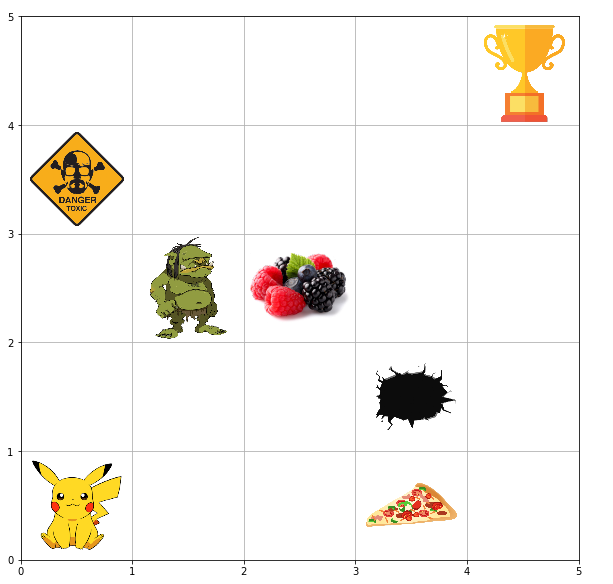

Timestep: 1


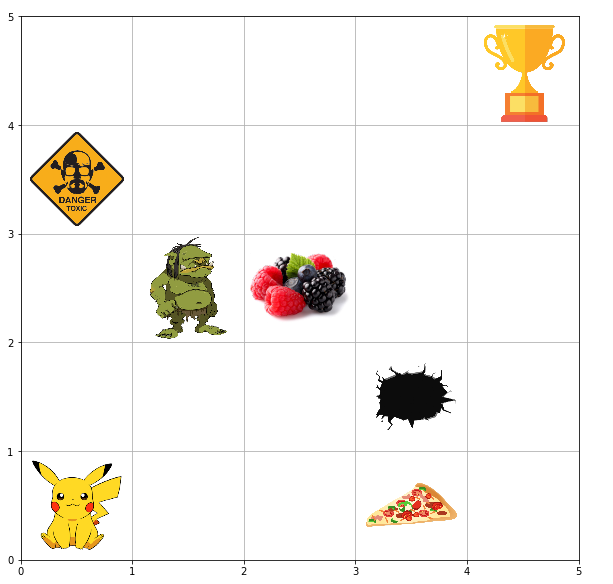

Reward received for timestep 1: -1

Timestep: 2


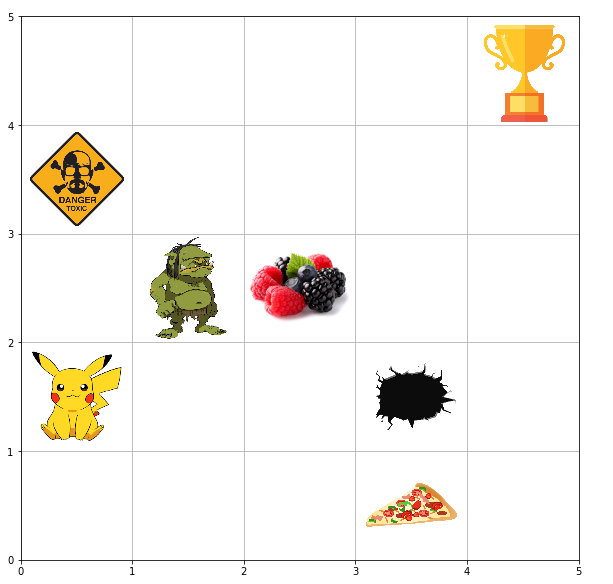

Reward received for timestep 2: -1

Timestep: 3


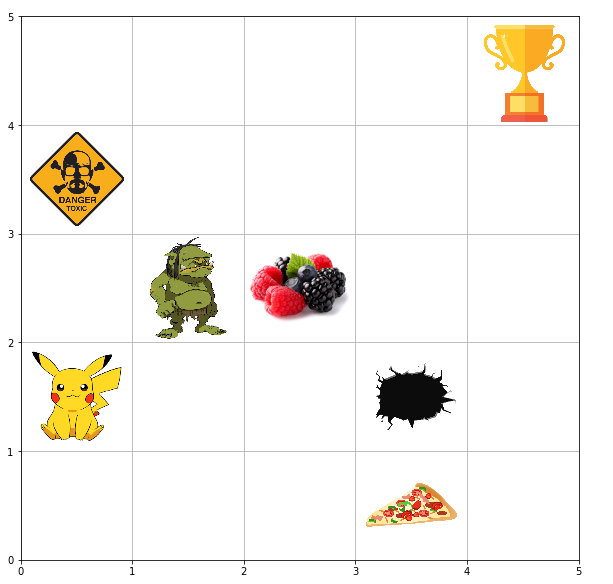

Reward received for timestep 3: -1

Timestep: 4


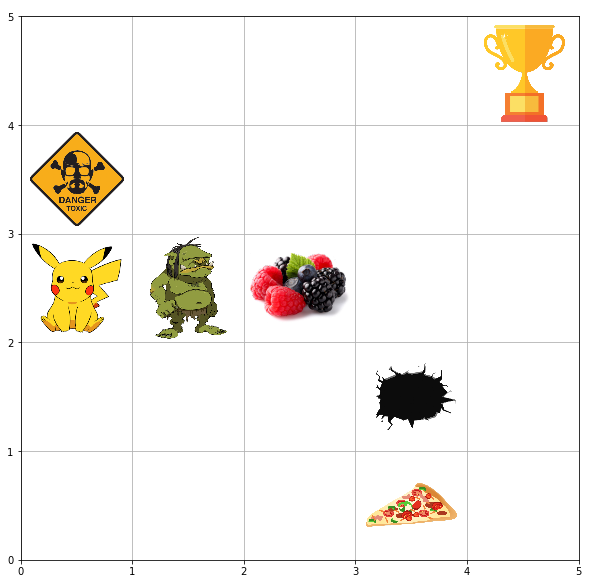

Reward received for timestep 4: -1

Timestep: 5


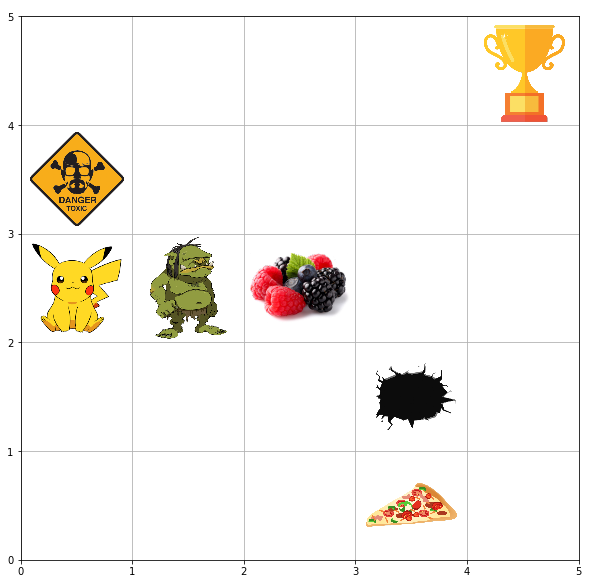

Reward received for timestep 5: -1

Timestep: 6


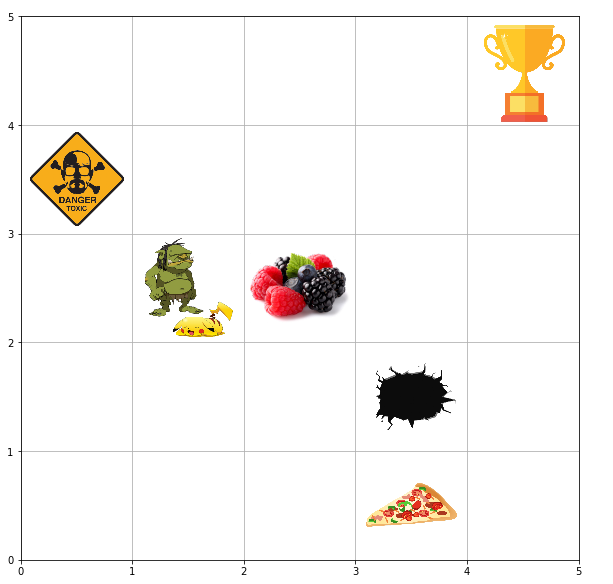

Reward received for timestep 6: -50

Alas! Agent met the monster
Game Over :D
Final reward: -55


In [4]:
# Uncomment the below code to run stochastic environment
env = GridEnvironment()

# env = GridEnvironment(is_stochastic=True)
timesteps = 20 # Timesteps to run the main function
main(env, timesteps)

## Part 2: Applying tabular methods

In [5]:
def plot_graphs(title, total_reward, epsilon_decay, cumulative_reward, percentage_success, percentage_failure, avg_timestep, episodes):
    '''
    This functions plots the graphs for rewards, epsilon, success, failure and avergae timesteps
    
    Success is defined when the agent has reached the goal state
    Failure is defined when the agent meets the monster or falls in the pit
    '''
    fig, axs = plt.subplots(3,2, figsize=(12,17))
    fig.suptitle(title, fontsize=22)
    fig.tight_layout()
    fig.subplots_adjust(top=0.91, hspace=0.2, wspace=0.2)
    axs[0,0].plot(epsilon_decay)
    axs[0,0].set_title('Epsilon Decay')
    axs[0,0].set_xlabel('Episodes')
    axs[0,0].set_ylabel('Epsilon')
    
    axs[0,1].plot(avg_timestep)
    axs[0,1].set_title('Average timesteps per 50 episodes')
    axs[0,1].set_xticks(np.arange(len(avg_timestep)))
    axs[0,1].set_xticklabels(list(range(0,episodes+1,50))[1:], rotation=45)
    axs[0,1].set_xlabel('Episodes')
    axs[0,1].set_ylabel('Timesteps')
    
    axs[1,0].plot(total_reward)
    axs[1,0].set_title('Total Reward per episode')
    axs[1,0].set_xlabel('Episodes')
    axs[1,0].set_ylabel('Rewards')
    
    axs[1,1].plot(cumulative_reward)
    axs[1,1].set_title('Cumulative reward over all episodes')
    axs[1,1].set_xlabel('Episodes')
    axs[1,1].set_ylabel('Cumulative Rewards')
    
    axs[2,0].plot(percentage_success)
    axs[2,0].set_title('Percentage of success per 100 episodes')
    axs[2,0].set_xticks(np.arange(len(percentage_success)))
    axs[2,0].set_xticklabels(list(range(0,episodes+1,100))[1:])
    axs[2,0].set_xlabel('Episodes')
    axs[2,0].set_ylabel('Success Rate')
    
    axs[2,1].plot(percentage_failure)
    axs[2,1].set_title('Percentage of failure per 100 episodes')
    axs[2,1].set_xticks(np.arange(len(percentage_failure)))
    axs[2,1].set_xticklabels(list(range(0,episodes+1,100))[1:])
    axs[2,1].set_xlabel('Episodes')
    axs[2,1].set_ylabel('Failure Rate')
    
    plt.show()

In [6]:
# Parameters for the different values of gamma and epsilon decay rate
# qd: Q-learning (deterministic)
# qs: Q-learning (stochastic)

params ={
    'gamma_0_9': {
        'alpha_lr': 0.9,
        'epsilon': 0.9,
        'gamma_df': 0.9,
        'episodes': 1000,
        'epsilon_decay_rate': 0.01,
        'Q_table_qd': {}, # Later on updated Q-table gets assigned to this key
        'Q_table_qs': {} # Later on updated Q-table gets assigned to this key
    },
    'gamma_1': {
        'alpha_lr': 0.9,
        'epsilon': 0.9,
        'gamma_df': 1,
        'episodes': 1000,
        'epsilon_decay_rate': 0.01,
        'Q_table_qd': {}, # Later on updated Q-table gets assigned to this key
        'Q_table_qs': {} # Later on updated Q-table gets assigned to this key
    },
    'gamma_0_5': {
        'alpha_lr': 0.9,
        'epsilon': 0.9,
        'gamma_df': 0.5,
        'episodes': 1000,
        'epsilon_decay_rate': 0.01,
        'Q_table_qd': {}, # Later on updated Q-table gets assigned to this key
        'Q_table_qs': {} # Later on updated Q-table gets assigned to this key
    },
    'edr_01': {
        'alpha_lr': 0.9,
        'epsilon': 0.9,
        'gamma_df': 0.9,
        'episodes': 1000,
        'epsilon_decay_rate': 0.01,
        'Q_table_qd': {}, # Later on updated Q-table gets assigned to this key
        'Q_table_qs': {} # Later on updated Q-table gets assigned to this key
    },
    'edr_001': {
        'alpha_lr': 0.9,
        'epsilon': 0.9,
        'gamma_df': 0.9,
        'episodes': 1000,
        'epsilon_decay_rate': 0.001,
        'Q_table_qd': {}, # Later on updated Q-table gets assigned to this key
        'Q_table_qs': {} # Later on updated Q-table gets assigned to this key
    },
    'edr_005': {
        'alpha_lr': 0.9,
        'epsilon': 0.9,
        'gamma_df': 0.9,
        'episodes': 1000,
        'epsilon_decay_rate': 0.005,
        'Q_table_qd': {}, # Later on updated Q-table gets assigned to this key
        'Q_table_qs': {} # Later on updated Q-table gets assigned to this key
    }
}

## Q-learning: Deterministic

In [7]:
def epsilon_greedy(epsilon, current_pos):
    '''
    Epsilon greedy function
    '''
    rand_num = np.random.random()
    if rand_num < epsilon:
        return np.random.randint(4)
    else:
        return np.argmax(Q_table[tuple(current_pos)])

In [17]:
def qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate):
    '''
    Implementation of Q-learning algorithm
    '''
    total_reward_arr = list() # Store total reward per episode values
    cumulative_reward_arr = list() # Store cumulative reward
    epsilon_decay_arr = [epsilon] # Store each epsilon value after decay
    percentage_success_arr = list() # Store the percentage of success per 100 episodes
    percentage_failure_arr = list() # Store the percentage of failure per 100 episodes
    timestep_arr = list() # Store the timestep per episode
    avg_timestep_arr = list() # Store average timestep every 20 episodes
    
    min_epsilon = 0.0 # Epsilon decay cannot go below the min value
    success_count = 0
    failure_count = 0
    
    for episode in range(episodes):
        obs = env.reset()
        current_pos = env.agent_pos.copy()
        done = False
        total_reward = 0
        timesteps = 0

        while not done:
            action = epsilon_greedy(epsilon, current_pos)
            observation, reward, done, info = env.step(action)

            next_state = info['current_agent_pos']
            
            # Update Q-table
            next_best_action = np.argmax(Q_table[tuple(next_state)])
            target = reward + (gamma_df * Q_table[tuple(next_state)][next_best_action])
            loss = target - Q_table[tuple(current_pos)][action]
            Q_table[tuple(current_pos)][action] += alpha_lr * loss

            total_reward += reward
            current_pos = next_state.copy()
            
            timesteps += 1
            
        timestep_arr.append(timesteps)
        
        # Calculate percentage success
        if done and reward == 50:
            success_count += 1
        if (episode+1) % 100 == 0:
            percentage_success_arr.append(success_count)
            success_count = 0
        
        # Calculate percentage failure
        if done and reward == -50:
            failure_count += 1
        if (episode+1) % 100 == 0:
            percentage_failure_arr.append(failure_count)
            failure_count = 0
        
        # Calculate average timesteps for 50 timesteps
        if done and (episode+1) % 50 == 0:
            avg_timestep_arr.append(np.average(timestep_arr))
            timestep_arr.clear()
                
        # Decay epsilon
        if epsilon > min_epsilon:
            epsilon -= (epsilon * epsilon_decay_rate)
            epsilon_decay_arr.append(epsilon)

        # Append total reward
        total_reward_arr.append(total_reward)  
        
        # Calculate cumulative reward
        if len(cumulative_reward_arr) == 0:
            cumulative_reward = total_reward
        else:
            cumulative_reward = cumulative_reward_arr[-1] + total_reward
        cumulative_reward_arr.append(cumulative_reward)
        
    return total_reward_arr, epsilon_decay_arr, cumulative_reward_arr, percentage_success_arr, percentage_failure_arr, avg_timestep_arr

In [9]:
def test_epsilon_greedy(epsilon, current_pos, Q_table_dict):
    '''
    Test the agent based on the optimal policy
    Takes the current position and the best Q-table as inputs
    '''
    rand_num = np.random.random()
    if rand_num < epsilon:
        return np.random.randint(4)
    else:
        return np.argmax(Q_table_dict[tuple(current_pos)])

In [10]:
def test_agent(env, episodes, Q_table_dict, epsilon=0, perform_render=False):
    '''
    Test the agent for n-episodes taking the agent choose only greedy action
    based on the Q_table_dict
    
    perform_render: Plots the environment for the last episode
    '''
    total_reward_arr = list()
    
    for episode in range(episodes):
        obs = env.reset()
        current_pos = env.agent_pos.copy()
        done = False
        total_reward = 0
        while not done:
            action = test_epsilon_greedy(epsilon, current_pos, Q_table_dict)
            observation, reward, done, info = env.step(action)

            next_state = info['current_agent_pos']
            total_reward += reward
            current_pos = next_state.copy()
            
            # Render only for the final episode
            if perform_render and episodes-1 == episode:
                env.render()
        total_reward_arr.append(total_reward)
    return total_reward_arr

### Discount Factor: 1

In [297]:
# Initialize different paramters for Q-learning
alpha_lr = params['gamma_1']['alpha_lr']
epsilon = params['gamma_1']['epsilon']
gamma_df = params['gamma_1']['gamma_df']
episodes = params['gamma_1']['episodes']
epsilon_decay_rate = params['gamma_1']['epsilon_decay_rate']

In [298]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [299]:
# Run the Q-learning algorithm
total_reward_qd2, epsilon_decay_qd2, cumulative_reward_qd2, percentage_success_qd2, percentage_failure_qd2, avg_timestep_qd2 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [300]:
# Save the Q-table values
params['gamma_1']['Q_table_qd'] = Q_table

In [301]:
params['gamma_1']['Q_table_qd']

{(0, 0): array([43.84250756, 44.28915783, 54.        , 44.26260079]),
 (0, 1): array([44.41585342, 45.05577784, 44.3988607 , 45.03284097]),
 (0, 2): array([ 45.03284098,  45.05577784, -49.9995    ,  45.05577784]),
 (0, 3): array([46.05577784, -0.9       , -0.9       , -0.9       ]),
 (0, 4): array([ 0. ,  0. , -0.9,  0. ]),
 (1, 0): array([44.9589746 , 45.28652276, 55.        , 44.33630572]),
 (1, 1): array([ 44.53457521, -50.        ,  54.85639125,  45.12571986]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.999995  ,  -0.9       ,  47.46296128,   7.44343301]),
 (1, 4): array([226.77132625,   2.11392   ,  -1.8       ,   0.        ]),
 (2, 0): array([45.43605826, 56.        , 46.15875488, 45.4049664 ]),
 (2, 1): array([ 45.97479283,  57.        , -50.        ,  45.56644535]),
 (2, 2): array([ 45.67485101,  47.        ,  47.        , -50.        ]),
 (2, 3): array([47.46001279, 47.41581008, 48.        , 47.54693197]),
 (2, 4): array([47.16543083, -1.80999   , 43.9965    ,  2.10

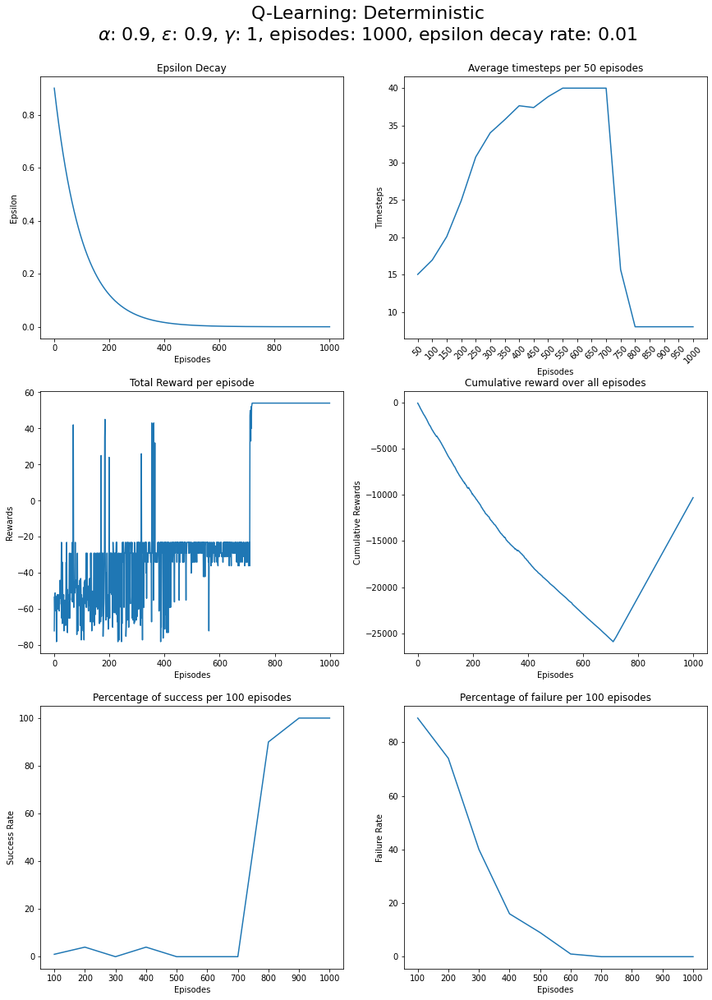

In [302]:
# Plot graphs
title = 'Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qd2, epsilon_decay_qd2, cumulative_reward_qd2, percentage_success_qd2, percentage_failure_qd2, avg_timestep_qd2, episodes)

#### Test the agent

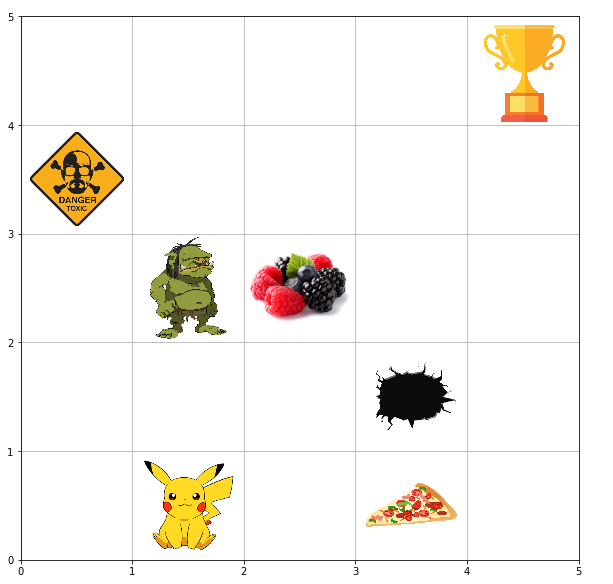

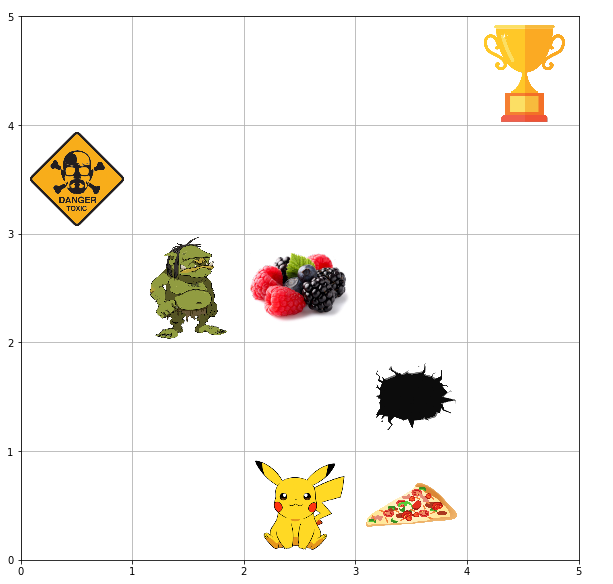

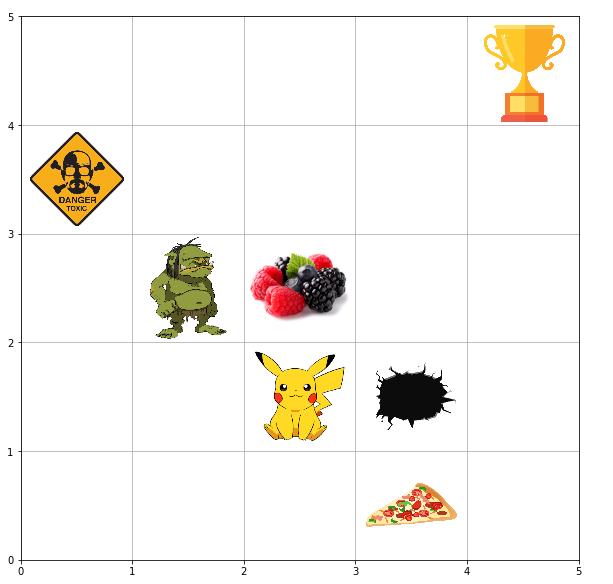

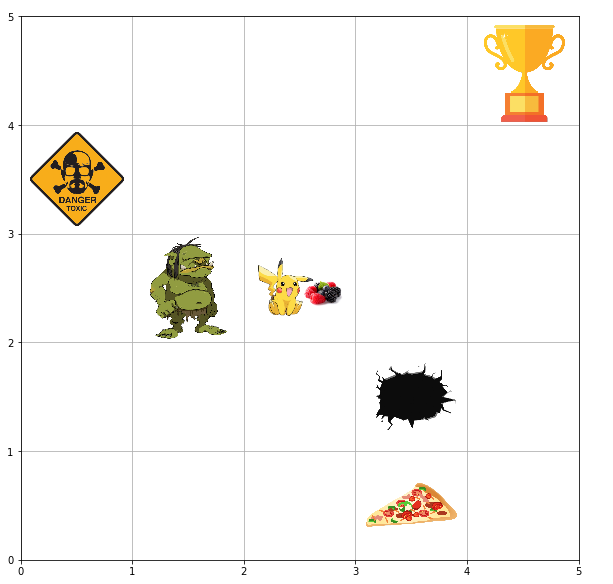

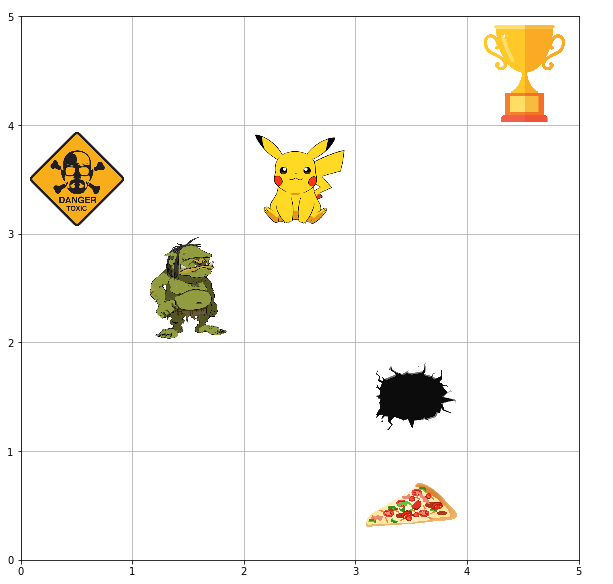

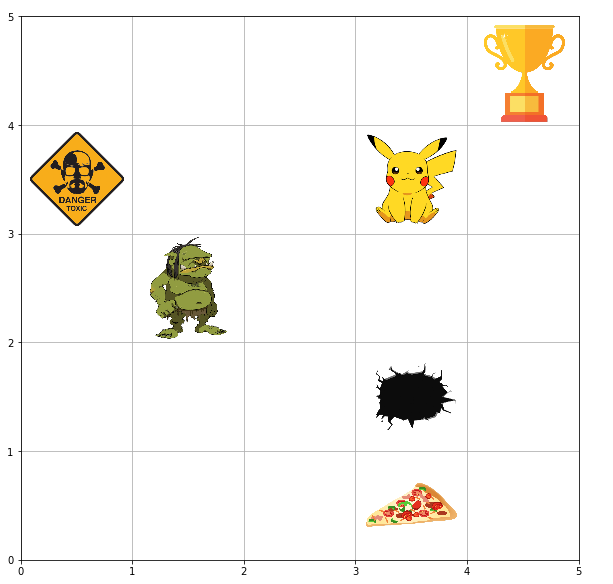

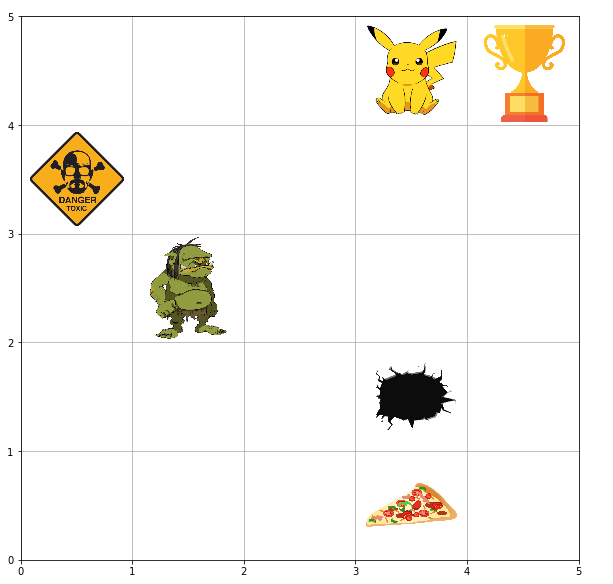

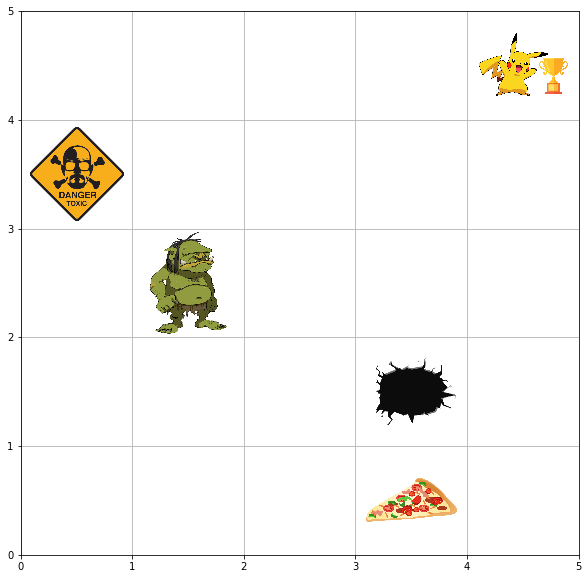

In [303]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['gamma_1']['Q_table_qd'], perform_render=True)

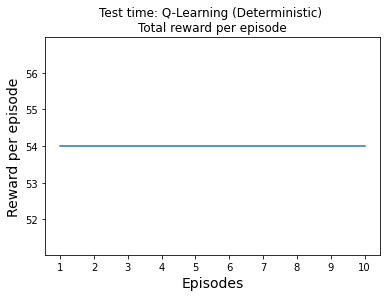

In [304]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Discount Factor: 0.9

In [26]:
# Initialize different paramters for Q-learning
alpha_lr = params['gamma_0_9']['alpha_lr']
epsilon = params['gamma_0_9']['epsilon']
gamma_df = params['gamma_0_9']['gamma_df']
episodes = params['gamma_0_9']['episodes']
epsilon_decay_rate = params['gamma_0_9']['epsilon_decay_rate']

In [27]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [28]:
# Run the Q-learning algorithm
total_reward_qd, epsilon_decay_qd, cumulative_reward_qd, percentage_success_qd, percentage_failure_qd, avg_timestep_qd = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [29]:
# Save the Q-table values
params['gamma_0_9']['Q_table_qd'] = Q_table

In [30]:
params['gamma_0_9']['Q_table_qd']

{(0, 0): array([22.47708168, 26.716814  , 19.77763658, 22.47703916]),
 (0, 1): array([23.04215849, 16.9100148 , 30.79646   , 20.40518625]),
 (0, 2): array([ 26.02218981,   7.92603856, -49.999995  ,   9.21875551]),
 (0, 3): array([22.46153378,  6.01628924, -0.99      , -0.9       ]),
 (0, 4): array([8.0066959, 0.       , 0.       , 0.       ]),
 (1, 0): array([19.68498054, 30.71217101, 22.29827477, 18.03095963]),
 (1, 1): array([ 25.33160385, -50.        ,  35.3294    ,  26.15134112]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-45.        ,  -0.99      ,  33.73999654,  12.99358571]),
 (1, 4): array([27.14410838, -0.9       , 38.6       , -0.9       ]),
 (2, 0): array([23.75937235, 35.31898709, 21.28792735, 20.44933088]),
 (2, 1): array([ 30.55740293,  40.366     , -50.        ,  30.16812744]),
 (2, 2): array([ 27.78291621,  33.74      ,  33.73999653, -50.        ]),
 (2, 3): array([29.366    , 38.6      , 38.6      , 29.3654142]),
 (2, 4): array([33.74      , 38.59596719, 44.   

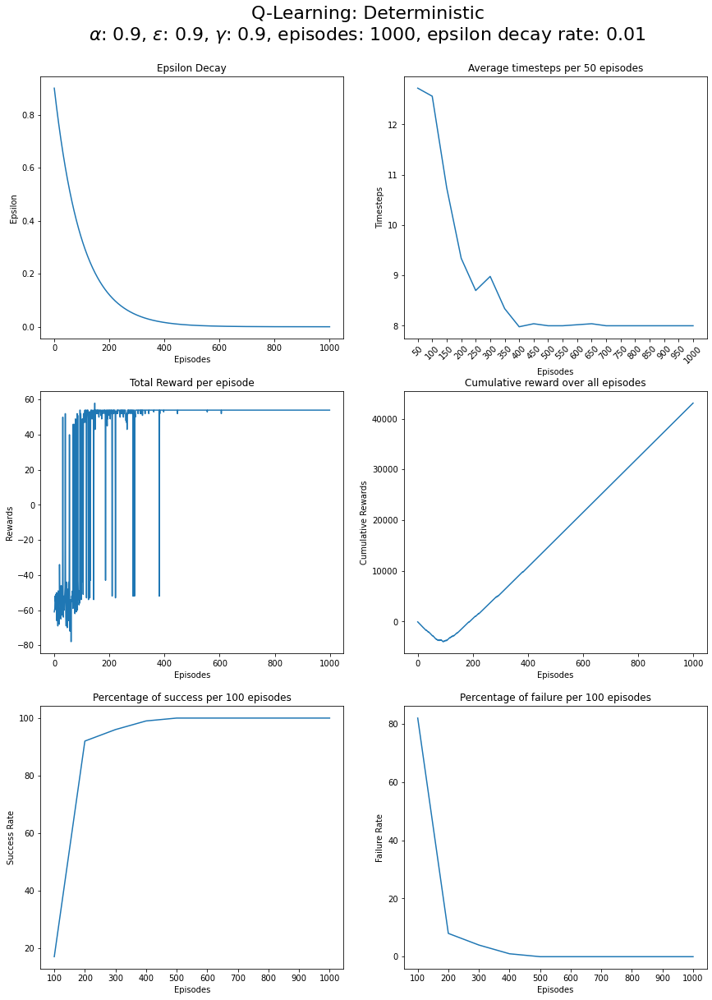

In [31]:
# Plot the graphs
title = 'Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qd, epsilon_decay_qd, cumulative_reward_qd, percentage_success_qd, percentage_failure_qd, avg_timestep_qd, episodes)

#### Test the agent

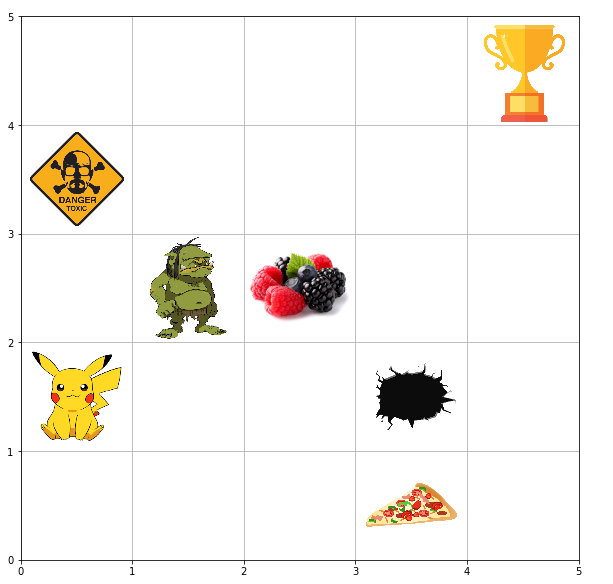

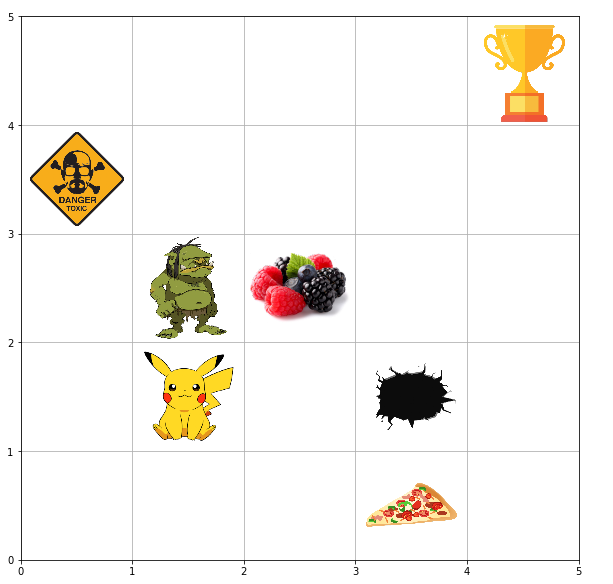

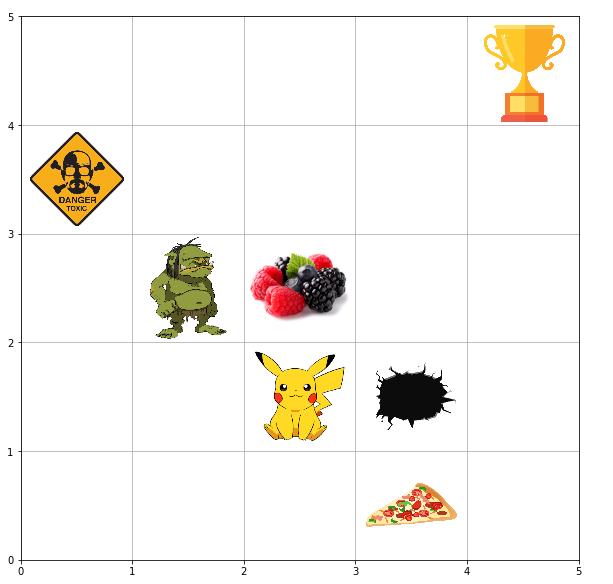

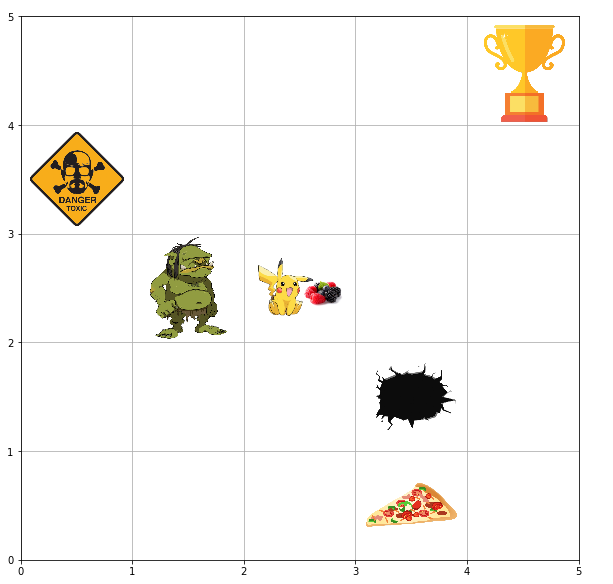

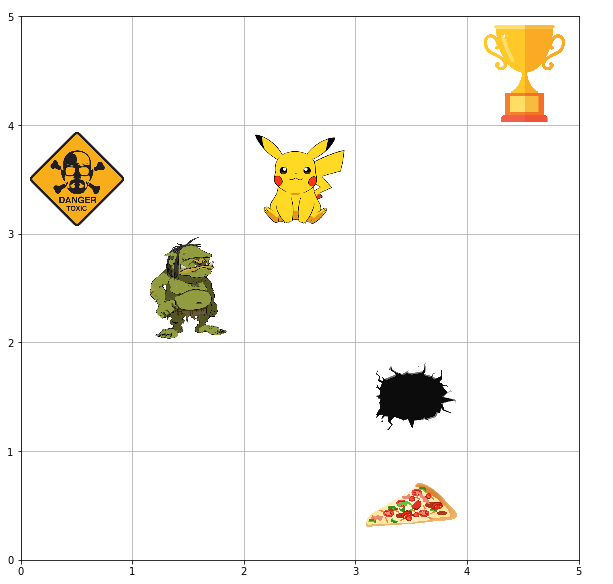

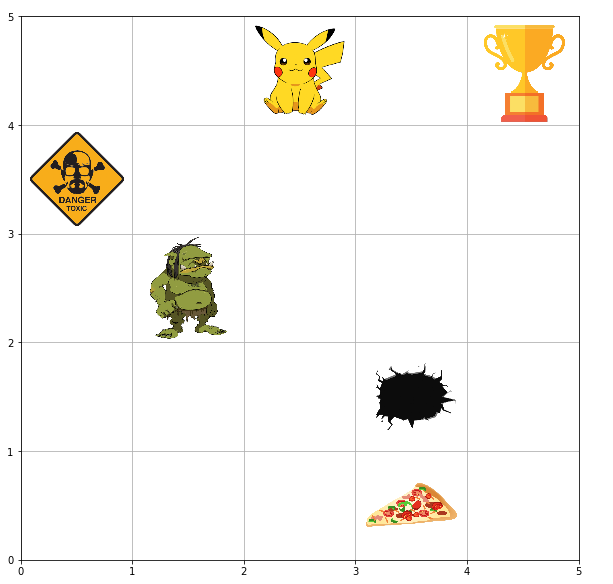

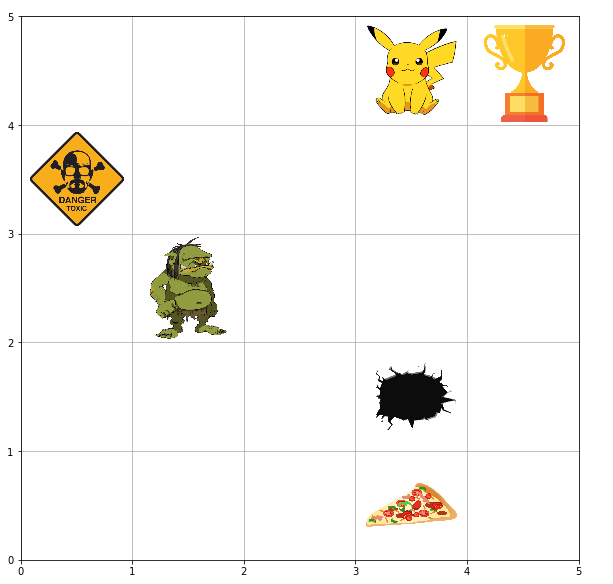

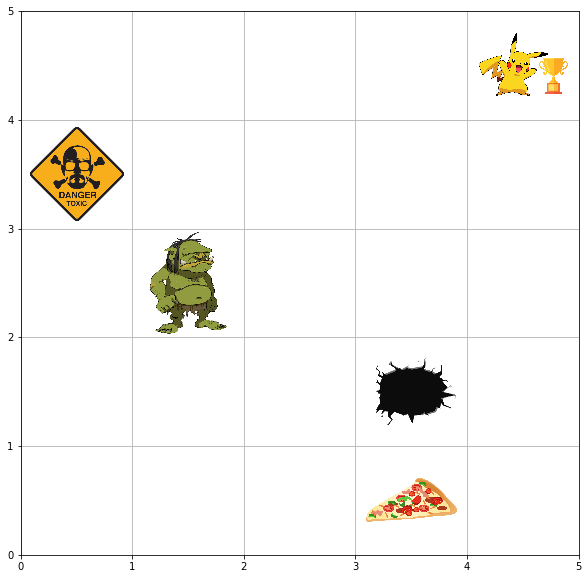

In [32]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['gamma_0_9']['Q_table_qd'], perform_render=True)

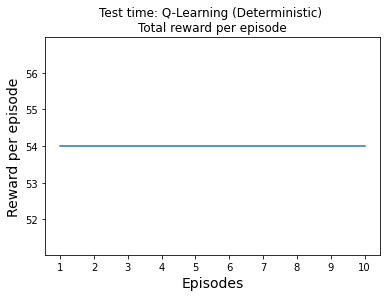

In [33]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Discount Factor: 0.5

In [42]:
# Initialize different paramters for Q-learning
alpha_lr = params['gamma_0_5']['alpha_lr']
epsilon = params['gamma_0_5']['epsilon']
gamma_df = params['gamma_0_5']['gamma_df']
episodes = params['gamma_0_5']['episodes']
epsilon_decay_rate = params['gamma_0_5']['epsilon_decay_rate']

In [43]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [44]:
# Run the Q-learning algorithm
total_reward_qd3, epsilon_decay_qd3, cumulative_reward_qd3, percentage_success_qd3, percentage_failure_qd3, avg_timestep_qd3 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [45]:
# Save the Q-table values
params['gamma_0_5']['Q_table_qd'] = Q_table

In [46]:
params['gamma_0_5']['Q_table_qd']

{(0, 0): array([-1.10937505, -0.21875   , -0.40900653, -1.10942084]),
 (0, 1): array([-1.15611151, -1.21533126,  1.5625    , -0.29897482]),
 (0, 2): array([ -0.22987282,  -2.817     , -49.9995    ,  -1.54567299]),
 (0, 3): array([-1.6218, -0.99  , -0.99  , -0.999 ]),
 (0, 4): array([-1.4355    , -1.4445    ,  3.86594942, -1.395     ]),
 (1, 0): array([-1.02861614,  1.53845212, -0.88443651, -1.11431144]),
 (1, 1): array([ -1.30106019, -50.        ,   5.125     ,  -0.221894  ]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.5       ,   4.47844488,  -1.4173476 ,  -2.7       ]),
 (1, 4): array([-1.476     , -0.99      , 10.99880999, -1.395     ]),
 (2, 0): array([-1.00290198,  5.11955596, -0.92516462, -1.22545302]),
 (2, 1): array([  1.50691052,  12.25      , -50.        ,   1.54085765]),
 (2, 2): array([  0.61975723,   4.5       ,   4.5       , -50.        ]),
 (2, 3): array([ 1.24985575, 11.        ,  9.77863905,  1.22588091]),
 (2, 4): array([ 4.00879167, -0.99      , 24.       

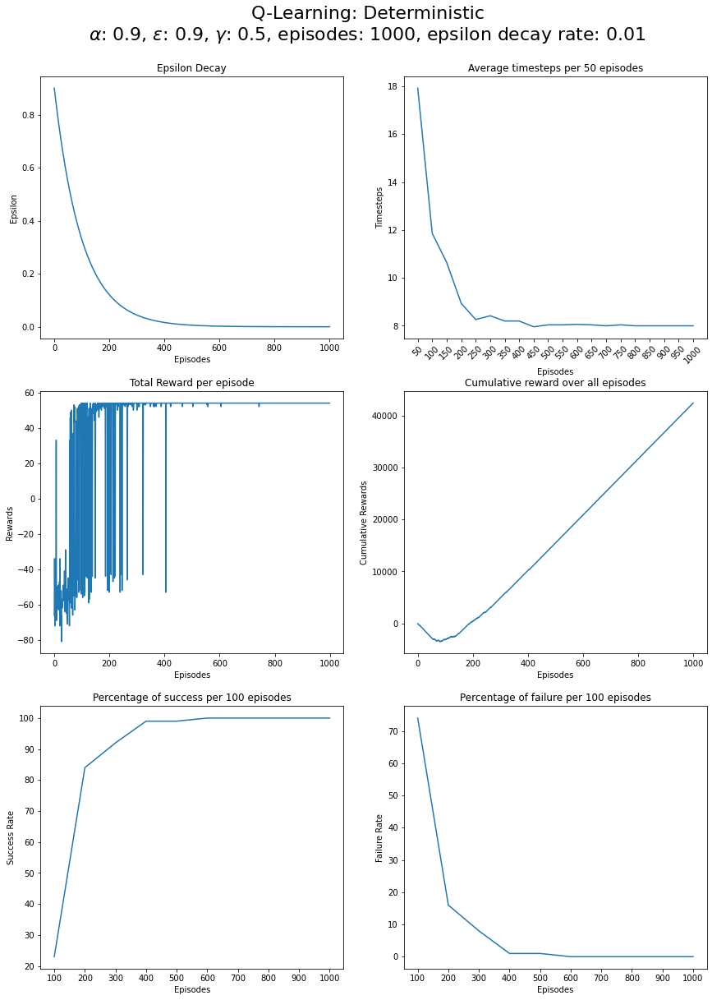

In [47]:
# Plot the graphs
title = 'Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qd3, epsilon_decay_qd3, cumulative_reward_qd3, percentage_success_qd3, percentage_failure_qd3, avg_timestep_qd3, episodes)

#### Test the agent

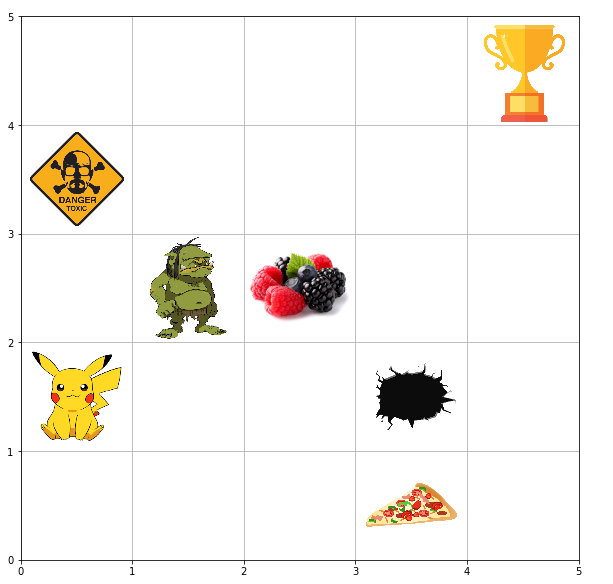

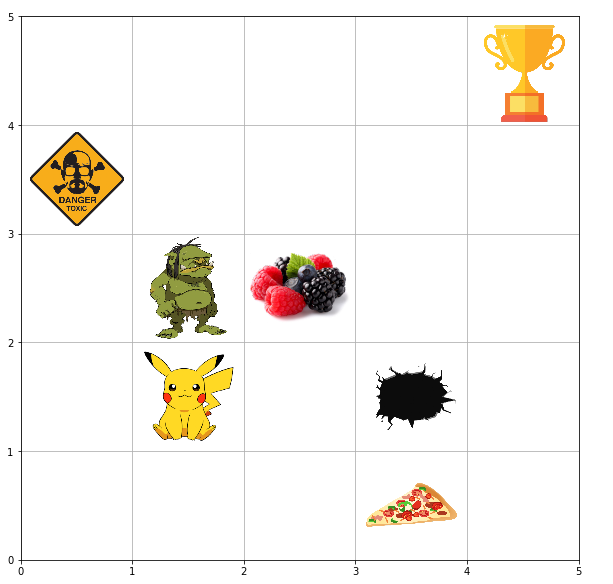

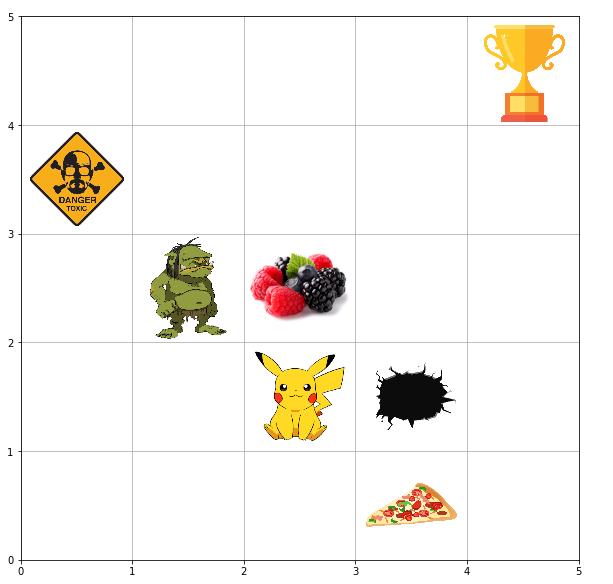

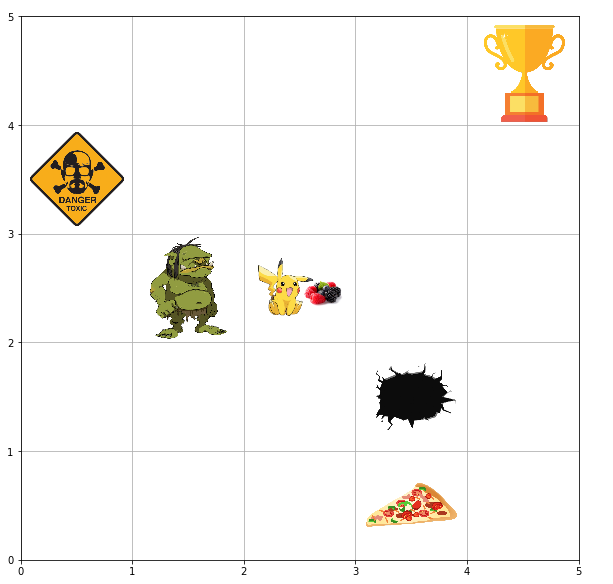

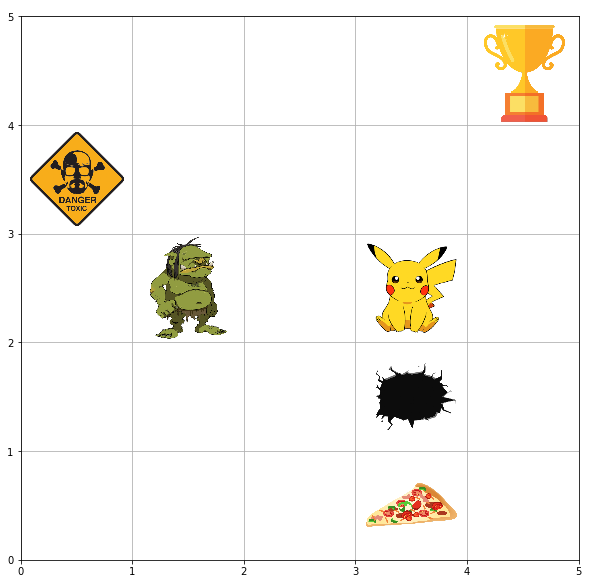

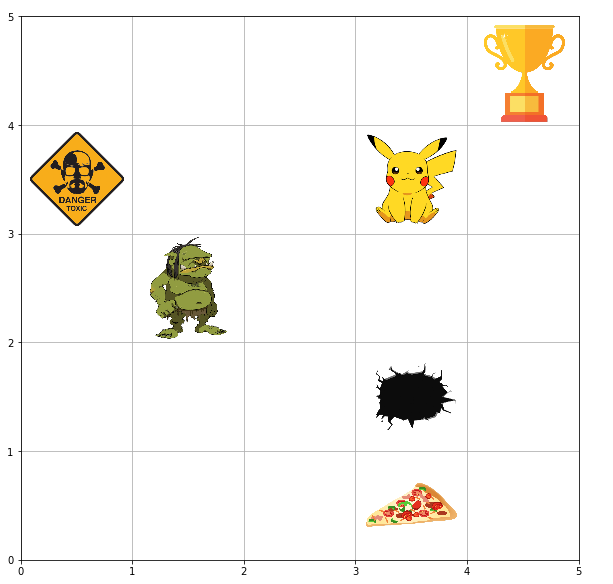

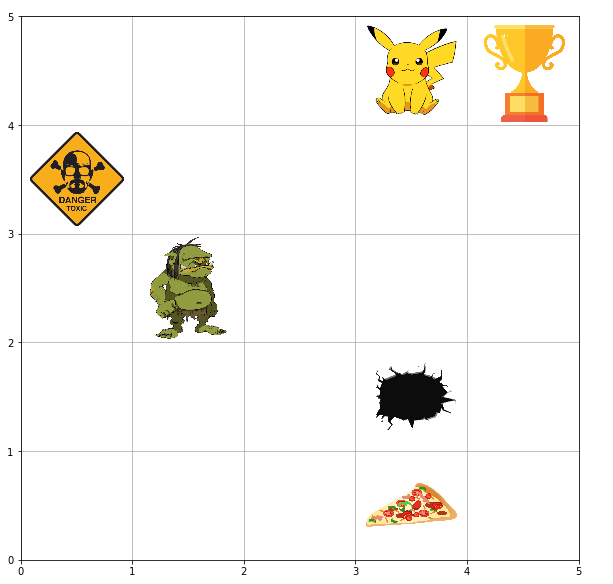

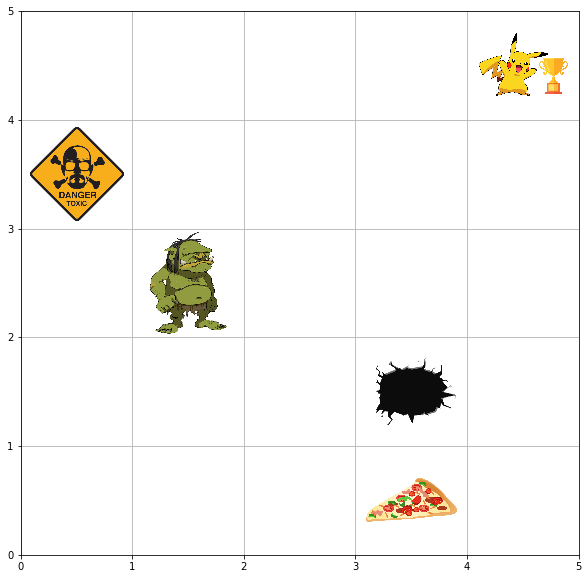

In [48]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['gamma_0_5']['Q_table_qd'], perform_render=True)

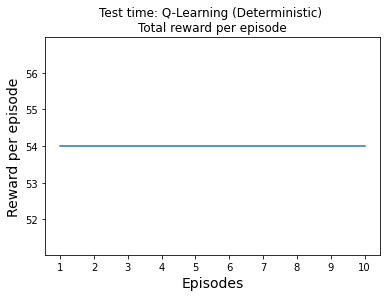

In [49]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Plot the compartive results for different gamma values

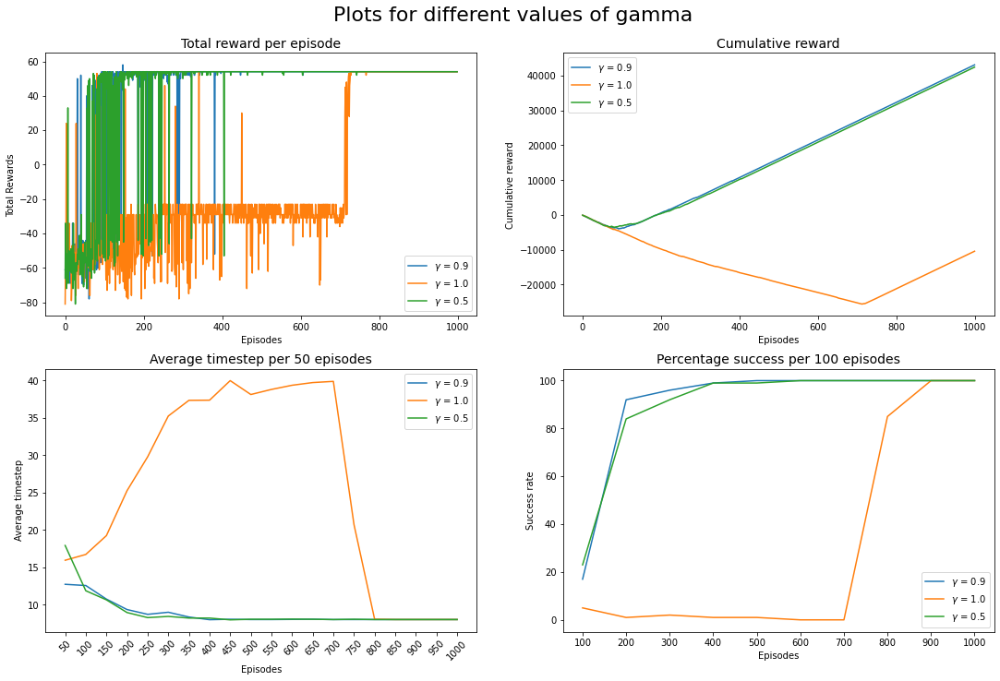

In [50]:
fig, axs = plt.subplots(2,2, figsize=(15,10))
fig.suptitle('Plots for different values of gamma', fontsize=22)
fig.tight_layout()
fig.subplots_adjust(top=0.91, hspace=0.2, wspace=0.2)
axs[0,0].plot(total_reward_qd, label=r'$\gamma$ = 0.9')
axs[0,0].plot(total_reward_qd2, label=r'$\gamma$ = 1.0')
axs[0,0].plot(total_reward_qd3, label=r'$\gamma$ = 0.5')
axs[0,0].set_xlabel('Episodes')
axs[0,0].set_ylabel('Total Rewards')
axs[0,0].set_title('Total reward per episode', fontsize=14)
axs[0,0].legend()

axs[0,1].plot(cumulative_reward_qd, label=r'$\gamma$ = 0.9')
axs[0,1].plot(cumulative_reward_qd2, label=r'$\gamma$ = 1.0')
axs[0,1].plot(cumulative_reward_qd3, label=r'$\gamma$ = 0.5')
axs[0,1].set_xlabel('Episodes')
axs[0,1].set_ylabel('Cumulative reward')
axs[0,1].set_title('Cumulative reward', fontsize=14)
axs[0,1].legend()

axs[1,0].plot(avg_timestep_qd, label=r'$\gamma$ = 0.9')
axs[1,0].plot(avg_timestep_qd2, label=r'$\gamma$ = 1.0')
axs[1,0].plot(avg_timestep_qd3, label=r'$\gamma$ = 0.5')
axs[1,0].set_xticks(np.arange(len(avg_timestep_qd)))
axs[1,0].set_xticklabels(list(range(0,1001,50))[1:], rotation=45)
axs[1,0].set_xlabel('Episodes')
axs[1,0].set_ylabel('Average timestep')
axs[1,0].set_title('Average timestep per 50 episodes', fontsize=14)
axs[1,0].legend()

axs[1,1].plot(percentage_success_qd, label=r'$\gamma$ = 0.9')
axs[1,1].plot(percentage_success_qd2, label=r'$\gamma$ = 1.0')
axs[1,1].plot(percentage_success_qd3, label=r'$\gamma$ = 0.5')
axs[1,1].set_xticks(np.arange(len(percentage_success_qd)))
axs[1,1].set_xticklabels(list(range(0,1001,100))[1:])
axs[1,1].set_xlabel('Episodes')
axs[1,1].set_ylabel('Success rate')
axs[1,1].set_title('Percentage success per 100 episodes', fontsize=14)
axs[1,1].legend()

plt.show()

### Epsilon Decay Rate: 0.01

In [51]:
# Initialize different paramters for Q-learning
alpha_lr = params['edr_01']['alpha_lr']
epsilon = params['edr_01']['epsilon']
gamma_df = params['edr_01']['gamma_df']
episodes = params['edr_01']['episodes']
epsilon_decay_rate = params['edr_01']['epsilon_decay_rate']

In [52]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [53]:
# Run the Q-learning algorithm
total_reward_qd4, epsilon_decay_qd4, cumulative_reward_qd4, percentage_success_qd4, percentage_failure_qd4, avg_timestep_qd4 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [54]:
# Save the Q-table values
params['edr_01']['Q_table_qd'] = Q_table

In [55]:
params['edr_01']['Q_table_qd']

{(0, 0): array([23.04480264, 26.66152317, 26.716814  , 22.7204507 ]),
 (0, 1): array([23.0398817 , 22.57197028, 30.79434178, 22.83545095]),
 (0, 2): array([ 26.69120894,  14.87294784, -49.99995   ,  17.32894584]),
 (0, 3): array([16.53385754,  0.        , -1.728     ,  0.        ]),
 (0, 4): array([-2.7,  0. , -0.9, -0.9]),
 (1, 0): array([19.9075203 , 30.79646   , 22.23916646, 22.74513503]),
 (1, 1): array([ 25.29948712, -50.        ,  35.3294    ,  21.06106794]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.9995    ,  -1.728     ,  33.73996516,  15.48167032]),
 (1, 4): array([-1.629     , -1.728     , 34.63043396, -0.99      ]),
 (2, 0): array([ 8.27557357, 25.78569904, 25.69071073, 20.42463231]),
 (2, 1): array([ 24.49528256,  40.366     , -50.        ,  24.502307  ]),
 (2, 2): array([ 27.78260347,  33.74      ,  33.73997622, -50.        ]),
 (2, 3): array([29.366     , 38.59999988, 38.6       , 29.36512117]),
 (2, 4): array([30.27249315, 38.59396716, 44.        , -1.7919  

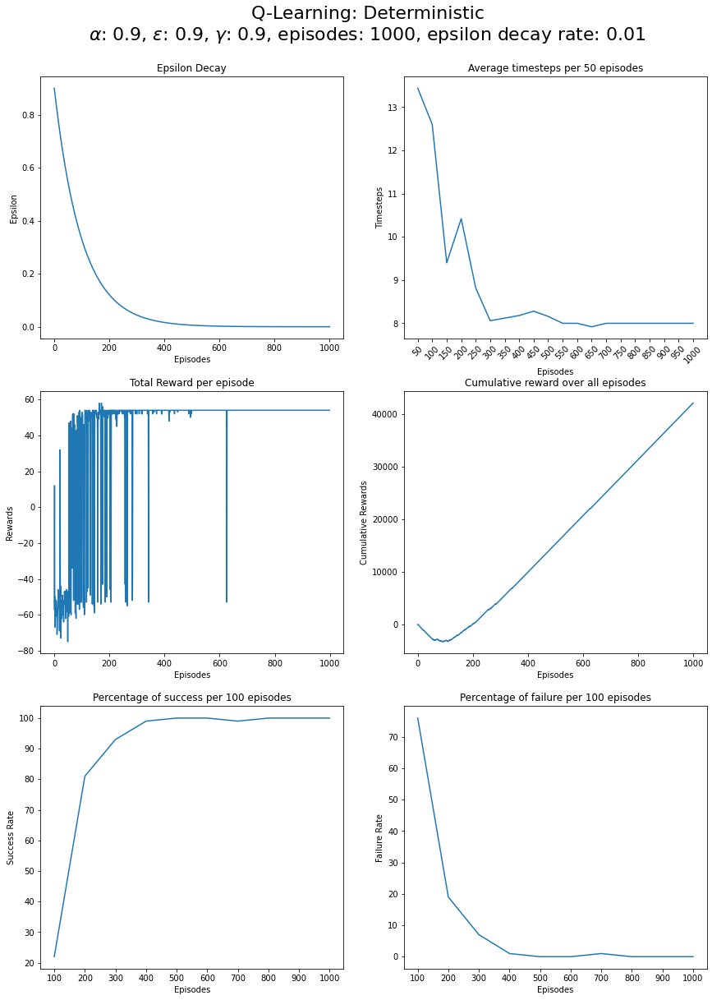

In [56]:
# Plot the graphs
title = 'Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qd4, epsilon_decay_qd4, cumulative_reward_qd4, percentage_success_qd4, percentage_failure_qd4, avg_timestep_qd4, episodes)

#### Test the agent

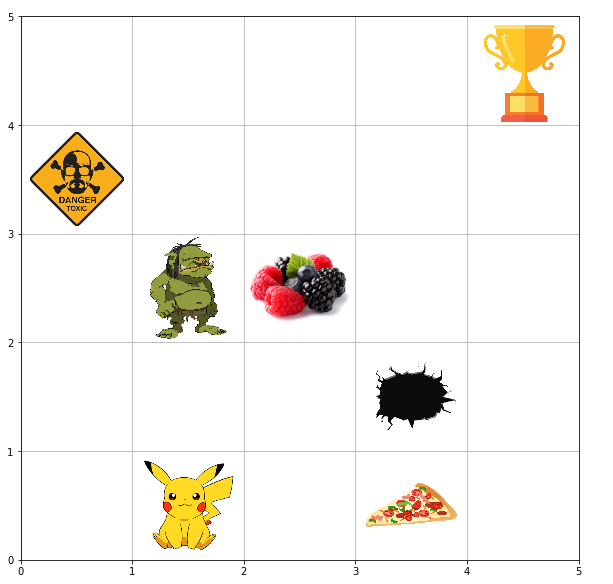

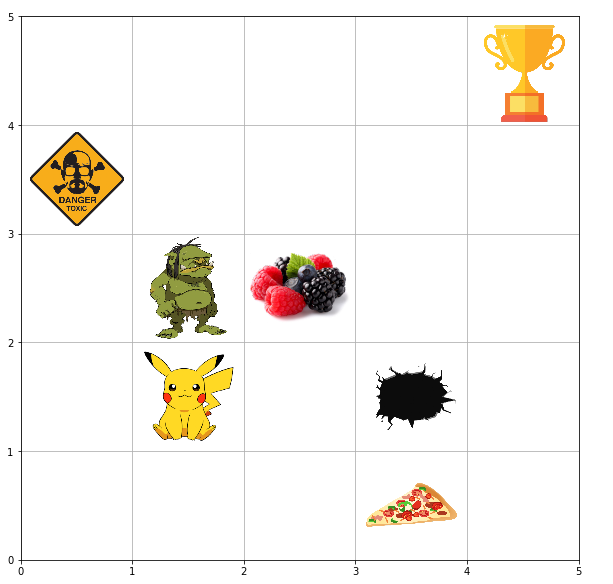

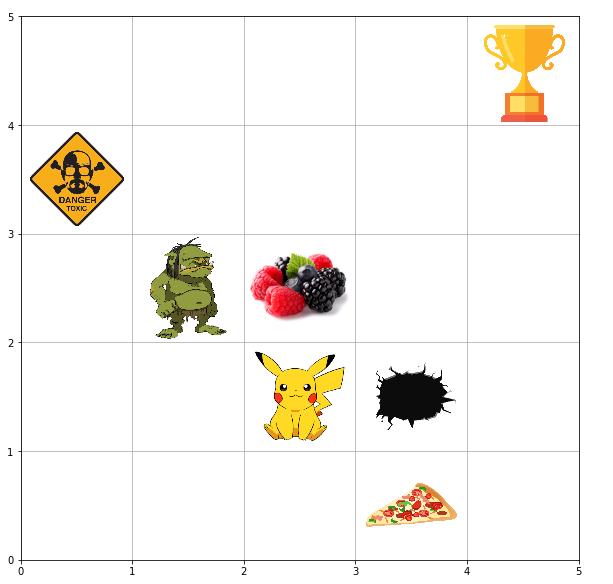

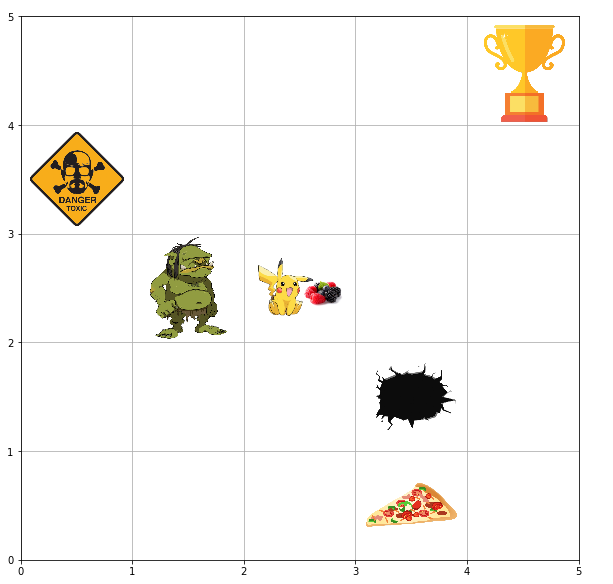

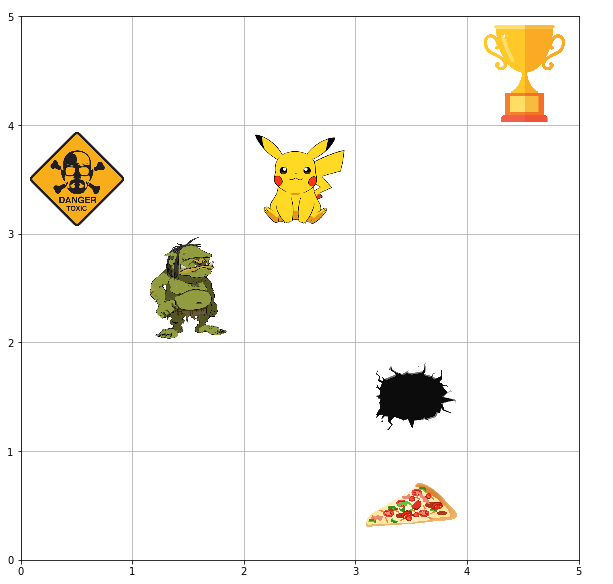

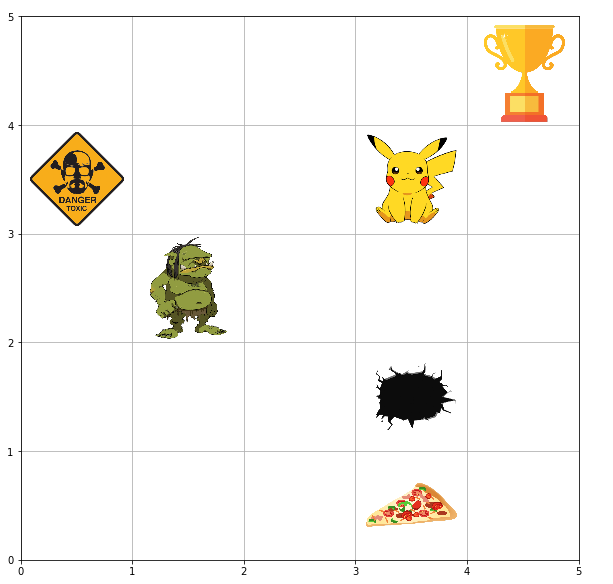

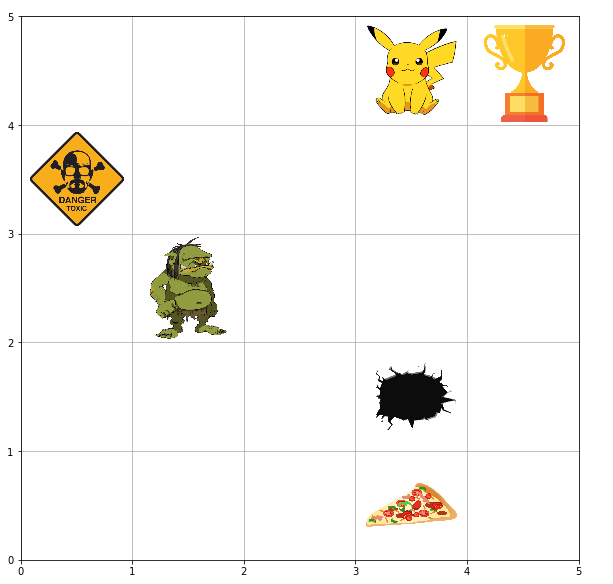

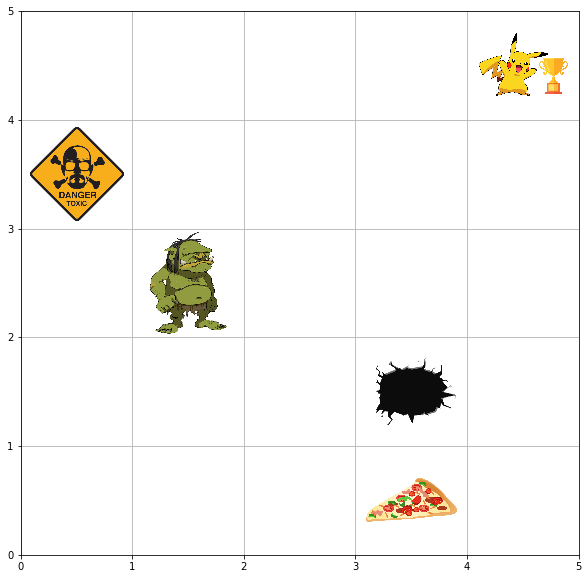

In [57]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['edr_01']['Q_table_qd'], perform_render=True)

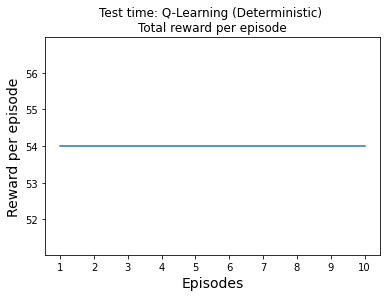

In [58]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Epsilon Decay Rate: 0.001

In [59]:
# Initialize different paramters for Q-learning
alpha_lr = params['edr_001']['alpha_lr']
epsilon = params['edr_001']['epsilon']
gamma_df = params['edr_001']['gamma_df']
episodes = params['edr_001']['episodes']
epsilon_decay_rate = params['edr_001']['epsilon_decay_rate']

In [60]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [61]:
# Run the Q-learning algorithm
total_reward_qd5, epsilon_decay_qd5, cumulative_reward_qd5, percentage_success_qd5, percentage_failure_qd5, avg_timestep_qd5 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [62]:
# Save the Q-table values
params['edr_001']['Q_table_qd'] = Q_table

In [63]:
params['edr_001']['Q_table_qd']

{(0, 0): array([23.04505726, 26.71575443, 26.716814  , 23.04507404]),
 (0, 1): array([22.05034671, 20.26142021, 30.79645907, 20.78045014]),
 (0, 2): array([ 20.40948596,  23.4474    , -50.        ,  20.23245742]),
 (0, 3): array([20.10156928, 29.366     , 29.366     , 25.4294    ]),
 (0, 4): array([23.6292017 , 29.36599971, 33.74      , 29.36599994]),
 (1, 0): array([26.71681394, 30.79646   , 26.76507006, 23.04512537]),
 (1, 1): array([ 26.71212127, -50.        ,  35.3294    ,  26.62769942]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-50.        ,  33.74      ,  33.74      ,  23.44920198]),
 (1, 4): array([29.366     , 33.73999549, 38.6       , 29.366     ]),
 (2, 0): array([23.94937763, 25.70692399, 31.4293946 , 26.67025373]),
 (2, 1): array([ 27.28631267,  40.366     , -50.        ,  30.66575945]),
 (2, 2): array([ 27.71729785,  33.74      ,  33.74      , -50.        ]),
 (2, 3): array([29.366, 38.6  , 38.6  , 29.366]),
 (2, 4): array([33.74, 38.6 , 44.  , 33.74]),
 (3, 0): a

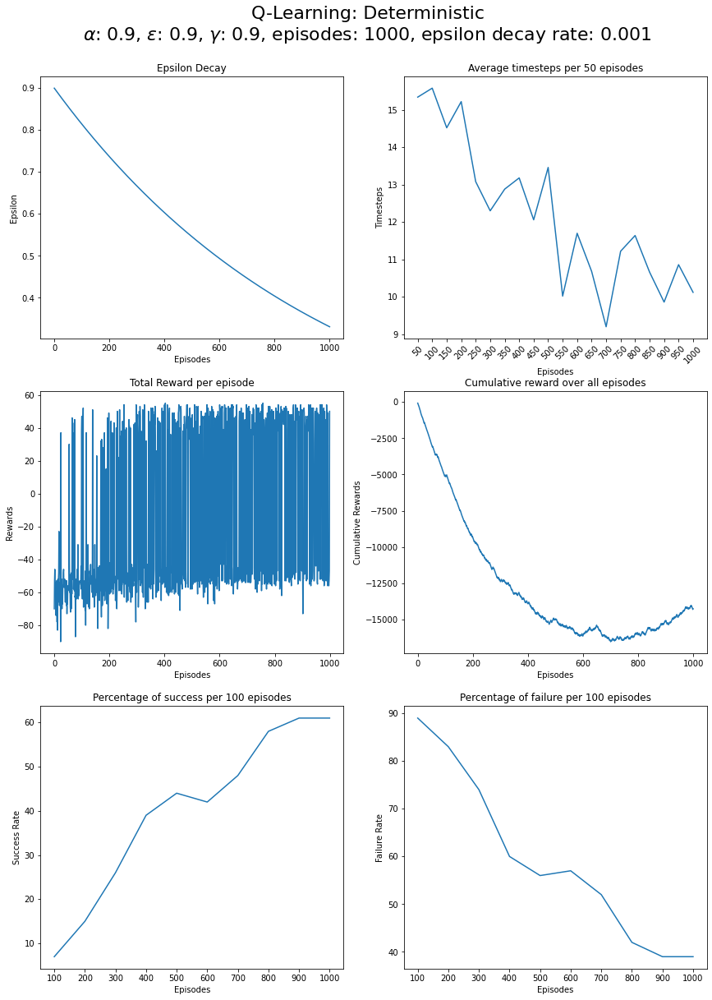

In [64]:
# Plot the graphs
title = 'Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qd5, epsilon_decay_qd5, cumulative_reward_qd5, percentage_success_qd5, percentage_failure_qd5, avg_timestep_qd5, episodes)

#### Test the agent

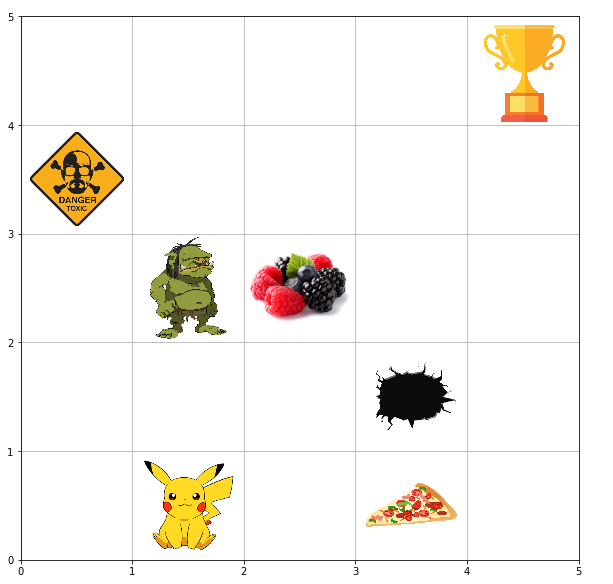

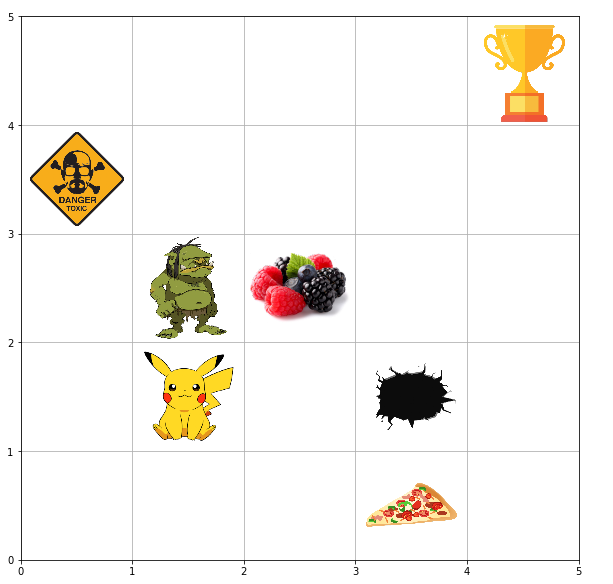

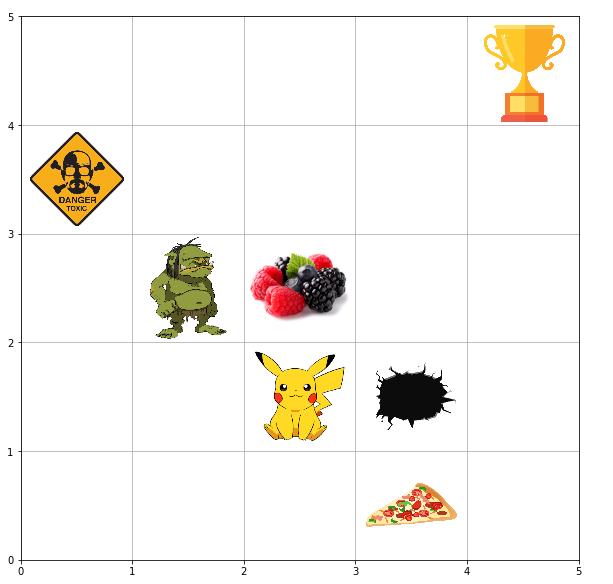

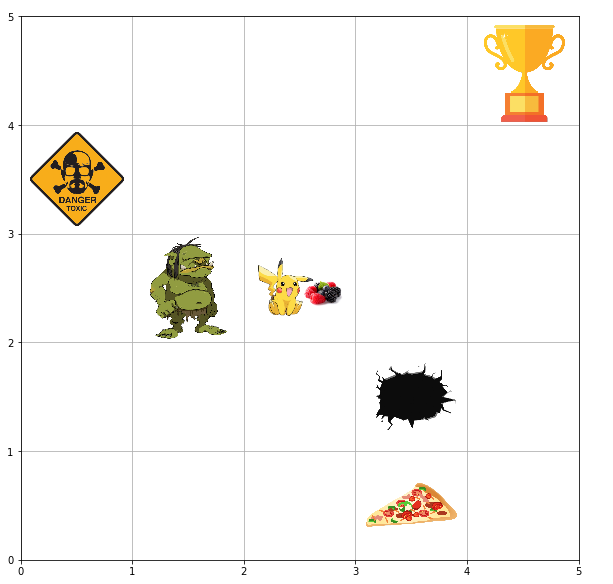

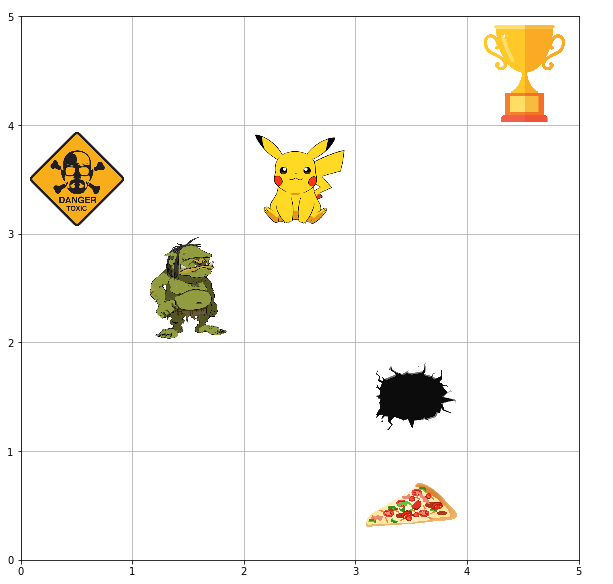

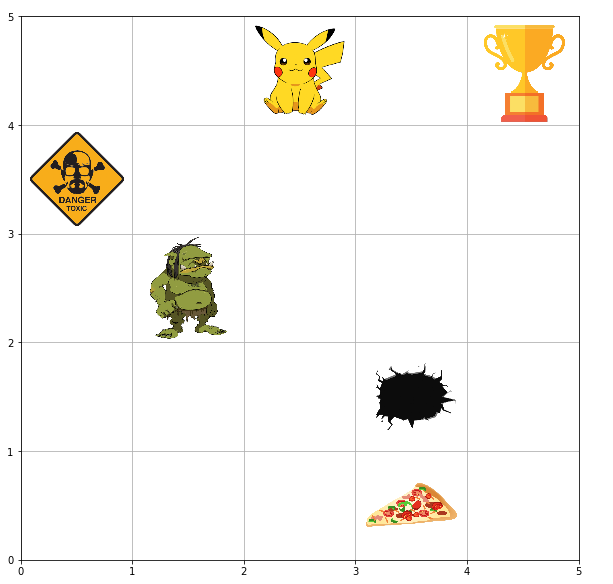

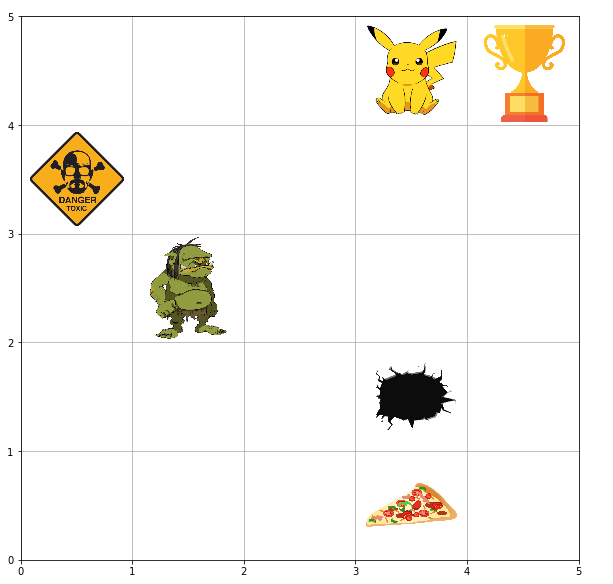

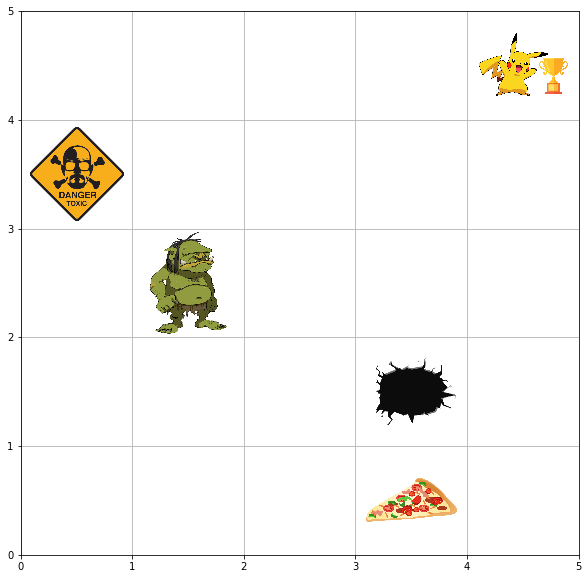

In [65]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['edr_001']['Q_table_qd'], perform_render=True)

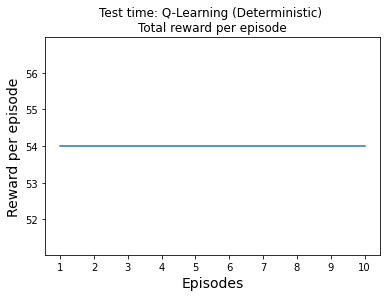

In [66]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Epsilon Decay Rate: 0.005

In [67]:
# Initialize different paramters for Q-learning
alpha_lr = params['edr_005']['alpha_lr']
epsilon = params['edr_005']['epsilon']
gamma_df = params['edr_005']['gamma_df']
episodes = params['edr_005']['episodes']
epsilon_decay_rate = params['edr_005']['epsilon_decay_rate']

In [68]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [69]:
# Run the Q-learning algorithm
total_reward_qd6, epsilon_decay_qd6, cumulative_reward_qd6, percentage_success_qd6, percentage_failure_qd6, avg_timestep_qd6 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [70]:
# Save the Q-table values
params['edr_005']['Q_table_qd'] = Q_table

In [71]:
params['edr_005']['Q_table_qd']

{(0, 0): array([19.7979299 , 19.62479387, 26.716814  , 19.80013217]),
 (0, 1): array([22.74739813, 21.96051527, 29.87574867, 20.40467096]),
 (0, 2): array([ 26.58512662,  11.17447785, -49.99995   ,   7.88472829]),
 (0, 3): array([21.72300663,  0.26685201,  0.        , 11.85521091]),
 (0, 4): array([11.39966935,  0.        ,  0.        ,  0.        ]),
 (1, 0): array([22.83789331, 23.64346681, 30.79646   , 23.04483509]),
 (1, 1): array([ 24.98915551, -50.        ,  35.31109011,  20.71539446]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.95      ,  33.73885503,  11.3058116 ,   3.33741764]),
 (1, 4): array([10.54175511,  0.        , 38.59997683,  0.        ]),
 (2, 0): array([26.42818514, 35.3294    , 25.46098544, 20.39726545]),
 (2, 1): array([ 22.44070868,  40.366     , -50.        ,  29.18735476]),
 (2, 2): array([ 27.7825913,  33.74     ,  33.74     , -50.       ]),
 (2, 3): array([29.36599994, 38.59999997, 38.6       , 29.34222538]),
 (2, 4): array([33.59740981, 38.56312949

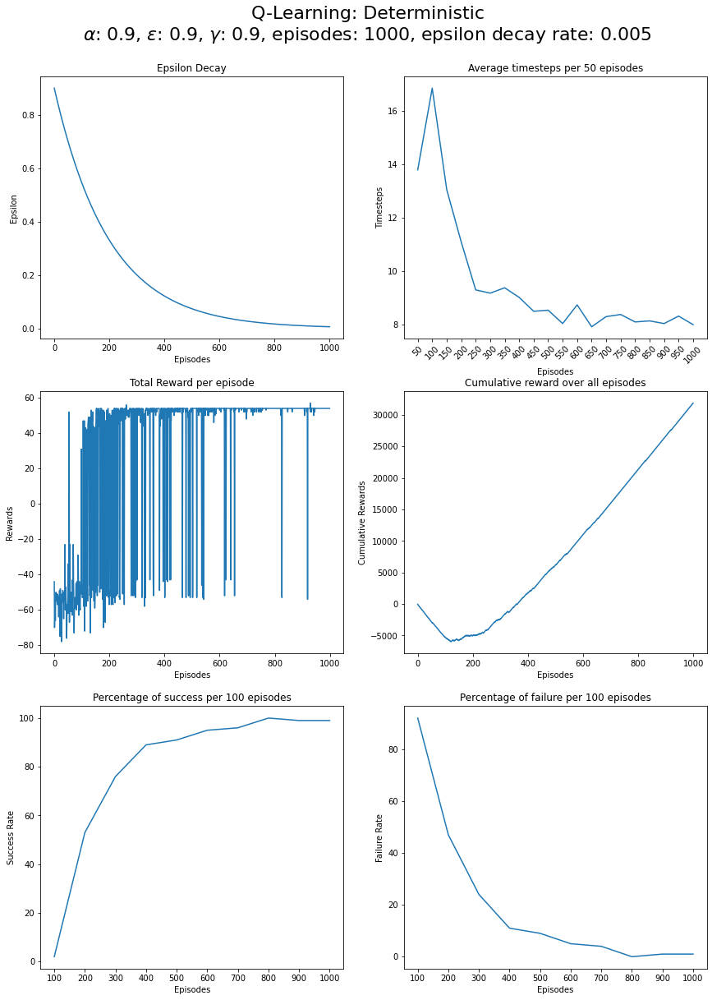

In [72]:
# Plot the graphs
title = 'Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qd6, epsilon_decay_qd6, cumulative_reward_qd6, percentage_success_qd6, percentage_failure_qd6, avg_timestep_qd6, episodes)

#### Test the agent

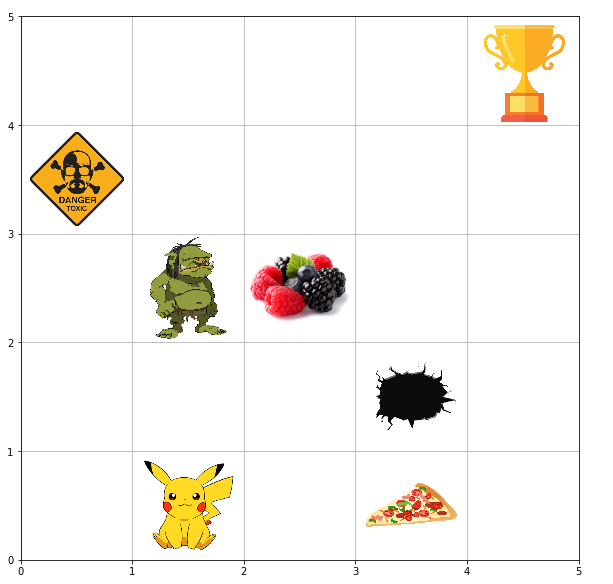

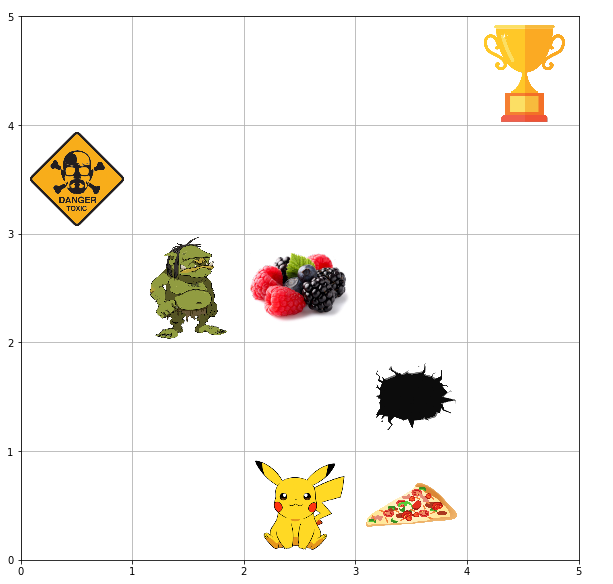

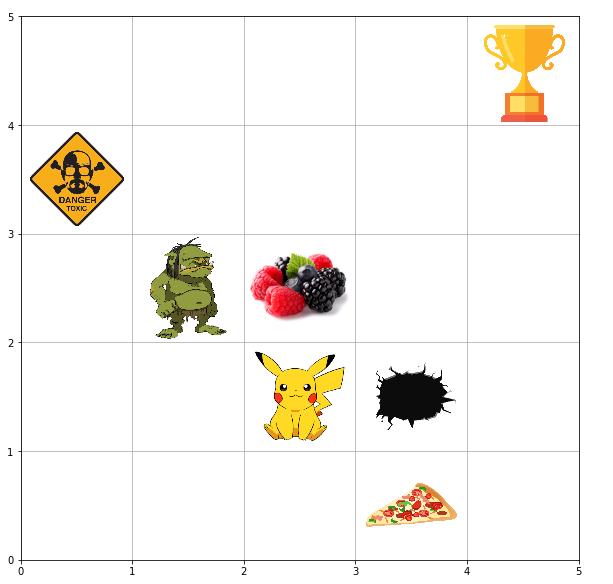

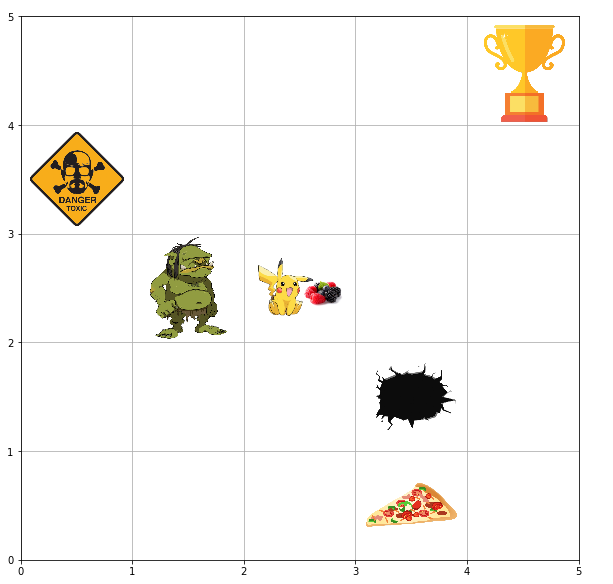

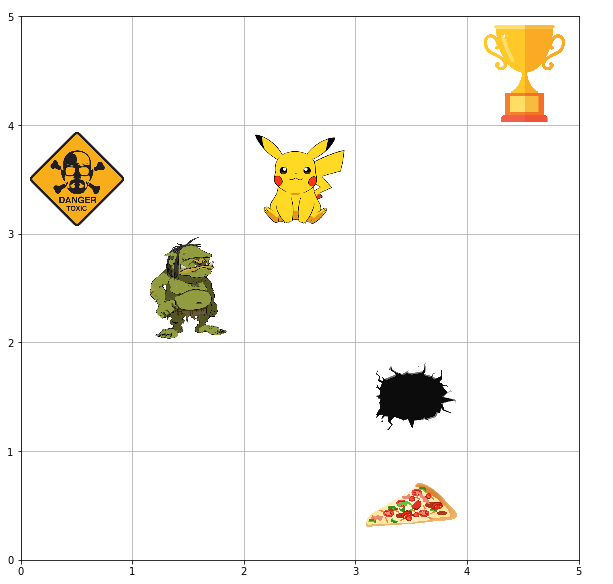

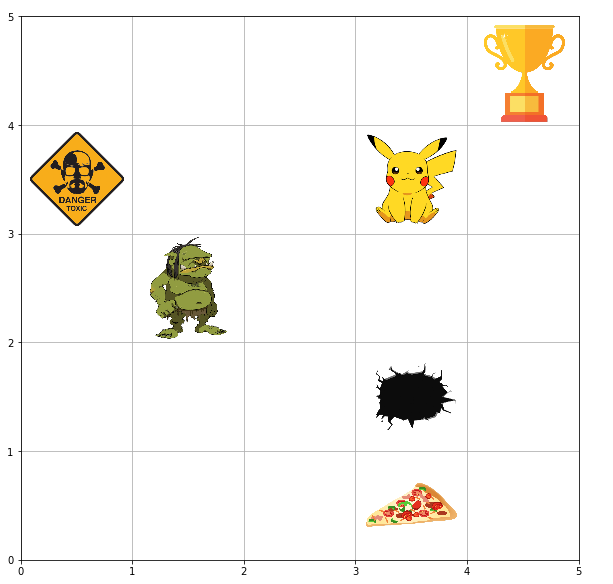

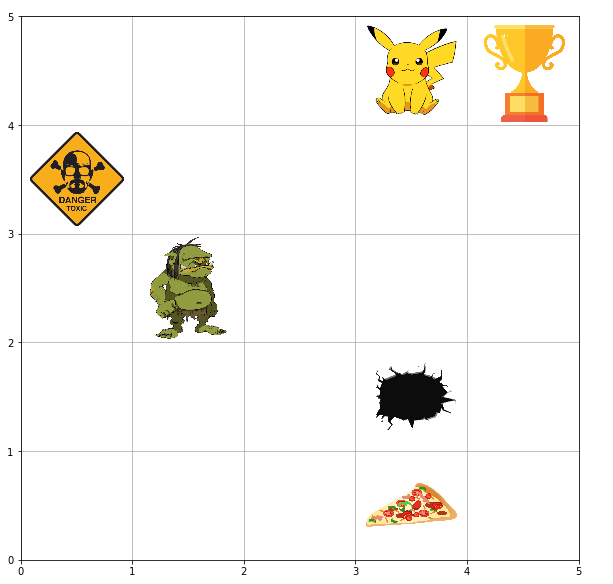

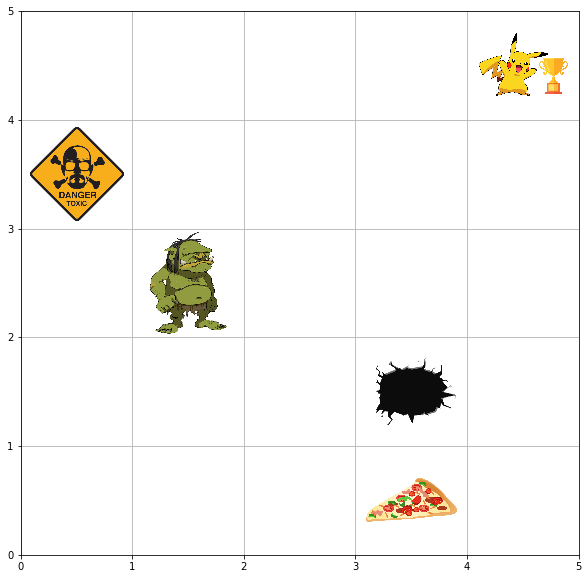

In [73]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['edr_005']['Q_table_qd'], perform_render=True)

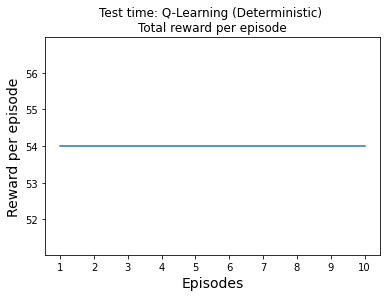

In [74]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Plot the comparative results for different epsilon decay rate values

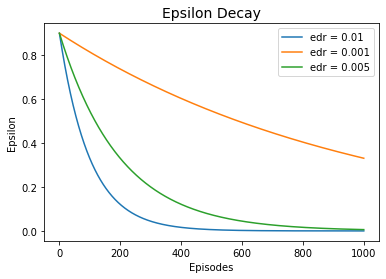

In [75]:
plt.plot(epsilon_decay_qd4, label=r'edr = 0.01')
plt.plot(epsilon_decay_qd5, label=r'edr = 0.001')
plt.plot(epsilon_decay_qd6, label=r'edr = 0.005')
plt.xlabel('Episodes')
plt.ylabel('Epsilon')
plt.title('Epsilon Decay', fontsize=14)
plt.legend()
plt.show()

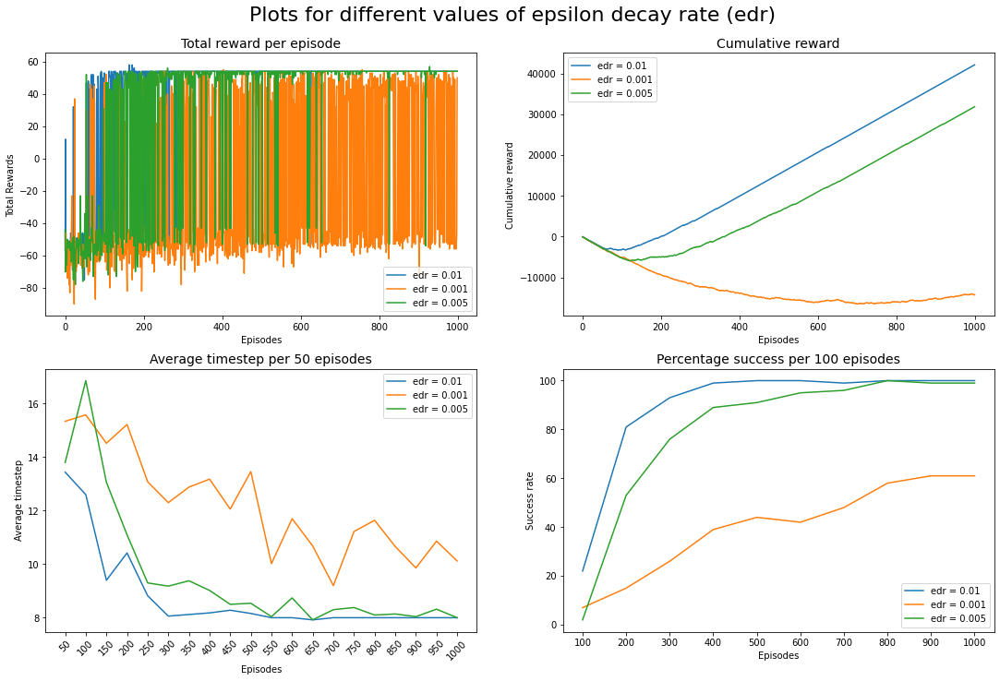

In [76]:
fig, axs = plt.subplots(2,2, figsize=(15,10))
fig.suptitle('Plots for different values of epsilon decay rate (edr)', fontsize=22)
fig.tight_layout()
fig.subplots_adjust(top=0.91, hspace=0.2, wspace=0.2)
axs[0,0].plot(total_reward_qd4, label=r'edr = 0.01')
axs[0,0].plot(total_reward_qd5, label=r'edr = 0.001')
axs[0,0].plot(total_reward_qd6, label=r'edr = 0.005')
axs[0,0].set_xlabel('Episodes')
axs[0,0].set_ylabel('Total Rewards')
axs[0,0].set_title('Total reward per episode', fontsize=14)
axs[0,0].legend()

axs[0,1].plot(cumulative_reward_qd4, label=r'edr = 0.01')
axs[0,1].plot(cumulative_reward_qd5, label=r'edr = 0.001')
axs[0,1].plot(cumulative_reward_qd6, label=r'edr = 0.005')
axs[0,1].set_xlabel('Episodes')
axs[0,1].set_ylabel('Cumulative reward')
axs[0,1].set_title('Cumulative reward', fontsize=14)
axs[0,1].legend()

axs[1,0].plot(avg_timestep_qd4, label=r'edr = 0.01')
axs[1,0].plot(avg_timestep_qd5, label=r'edr = 0.001')
axs[1,0].plot(avg_timestep_qd6, label=r'edr = 0.005')
axs[1,0].set_xticks(np.arange(len(avg_timestep_qd4)))
axs[1,0].set_xticklabels(list(range(0,1001,50))[1:], rotation=45)
axs[1,0].set_xlabel('Episodes')
axs[1,0].set_ylabel('Average timestep')
axs[1,0].set_title('Average timestep per 50 episodes', fontsize=14)
axs[1,0].legend()

axs[1,1].plot(percentage_success_qd4, label=r'edr = 0.01')
axs[1,1].plot(percentage_success_qd5, label=r'edr = 0.001')
axs[1,1].plot(percentage_success_qd6, label=r'edr = 0.005')
axs[1,1].set_xticks(np.arange(len(percentage_success_qd4)))
axs[1,1].set_xticklabels(list(range(0,1001,100))[1:])
axs[1,1].set_xlabel('Episodes')
axs[1,1].set_ylabel('Success rate')
axs[1,1].set_title('Percentage success per 100 episodes', fontsize=14)
axs[1,1].legend()

plt.show()

## Q-learning: Stochastic

### Discount Factor: 1

In [77]:
# Initialize different paramters for Q-learning
alpha_lr = params['gamma_1']['alpha_lr']
epsilon = params['gamma_1']['epsilon']
gamma_df = params['gamma_1']['gamma_df']
episodes = params['gamma_1']['episodes']
epsilon_decay_rate = params['gamma_1']['epsilon_decay_rate']

In [78]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [79]:
# Run the Q-learning algorithm
total_reward_qs1, epsilon_decay_qs1, cumulative_reward_qs1, percentage_success_qs1, percentage_failure_qs1, avg_timestep_qs1 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [80]:
# Save the Q-table values
params['gamma_1']['Q_table_qs'] = Q_table

In [81]:
params['gamma_1']['Q_table_qs']

{(0, 0): array([-35.75105341, -36.31061291,  38.41526684, -36.13622485]),
 (0, 1): array([ 52.20060175, -35.83831787, -47.28901093, -36.16962297]),
 (0, 2): array([-47.27056241,  63.26959372, -49.77572209, -36.24876791]),
 (0, 3): array([ 42.82359578, -23.40510333,  48.39033688,  42.49533169]),
 (0, 4): array([48.51424003, 97.71628793, 97.61236926, 57.47434575]),
 (1, 0): array([-35.42140705, -41.21832864,  53.2305668 , -34.86689128]),
 (1, 1): array([-48.36831952, -50.        , -48.95863436,  44.69161346]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.995     , -32.95459263,  44.65141695, -35.12704216]),
 (1, 4): array([97.02937642, 96.25145367, 96.22099651, 98.412687  ]),
 (2, 0): array([-32.90675864,  52.83336524, -38.17850832, -34.44885049]),
 (2, 1): array([-41.48581449, -22.25238388, -50.        , -41.95996561]),
 (2, 2): array([-40.91202291,  37.09596922, -40.81183406, -49.7802561 ]),
 (2, 3): array([ 34.45066941,  37.45679508,  47.74752662, -18.09186748]),
 (2, 4): arr

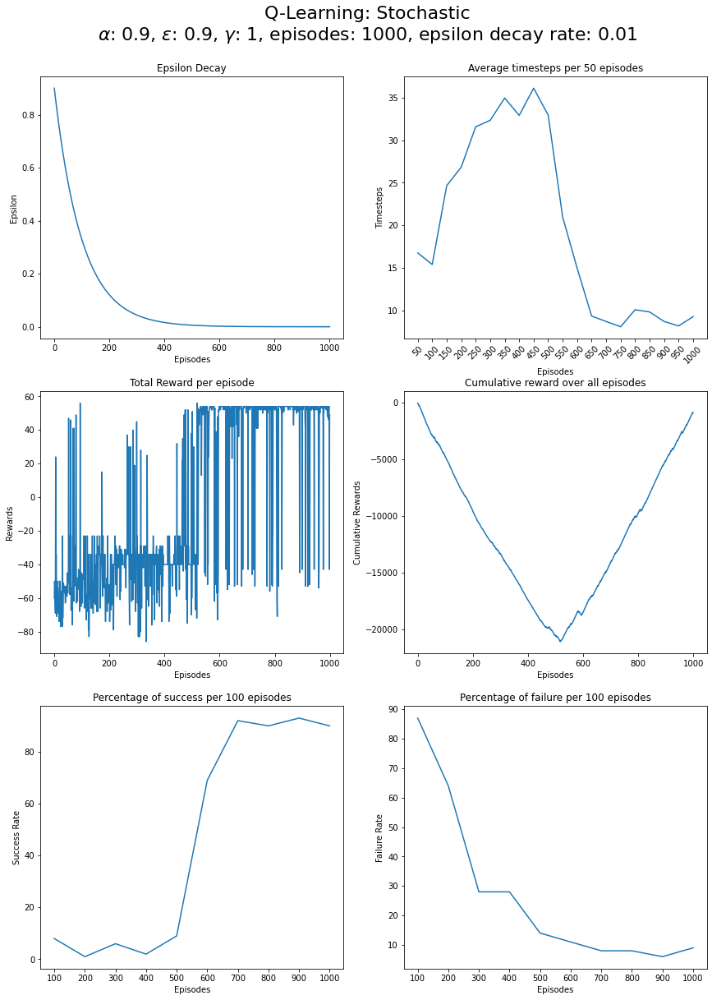

In [82]:
# Plot the graphs
title = 'Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qs1, epsilon_decay_qs1, cumulative_reward_qs1, percentage_success_qs1, percentage_failure_qs1, avg_timestep_qs1, episodes)

#### Test the agent

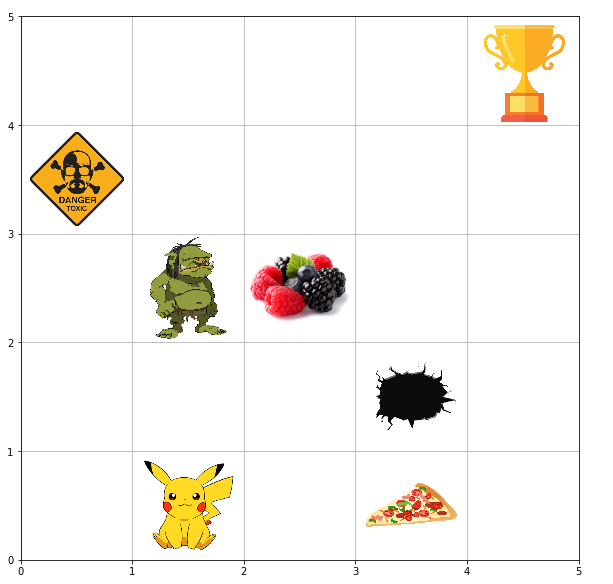

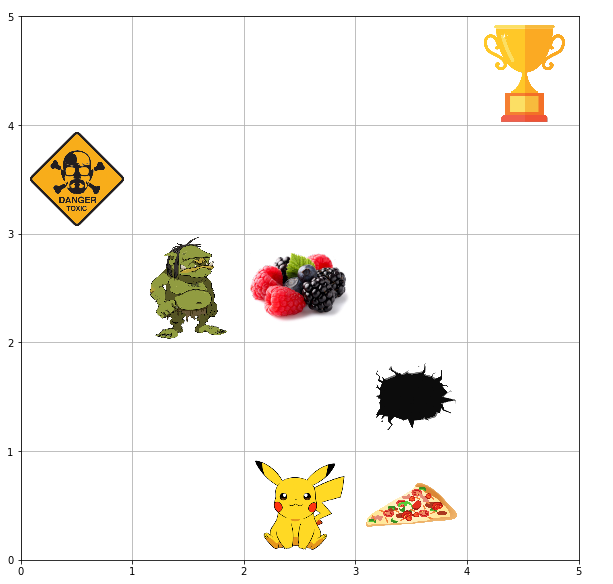

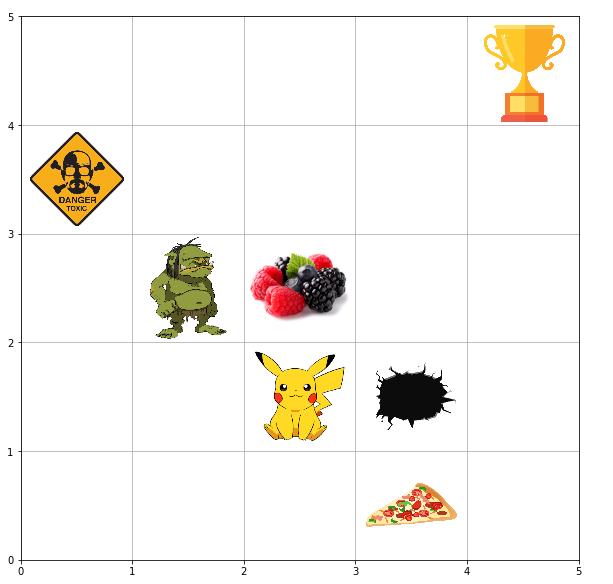

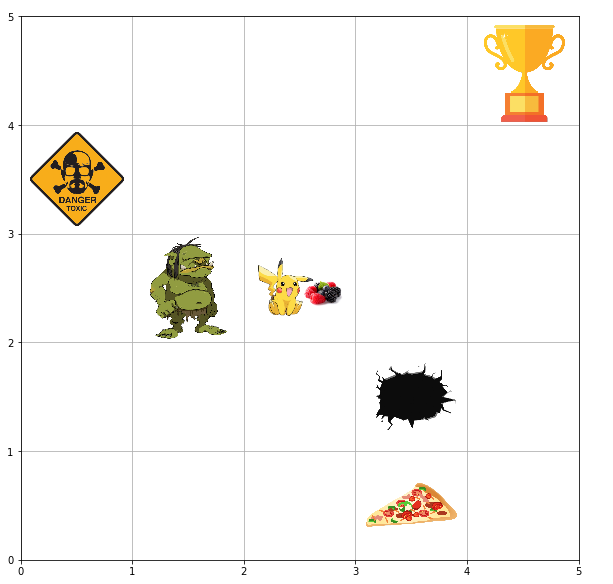

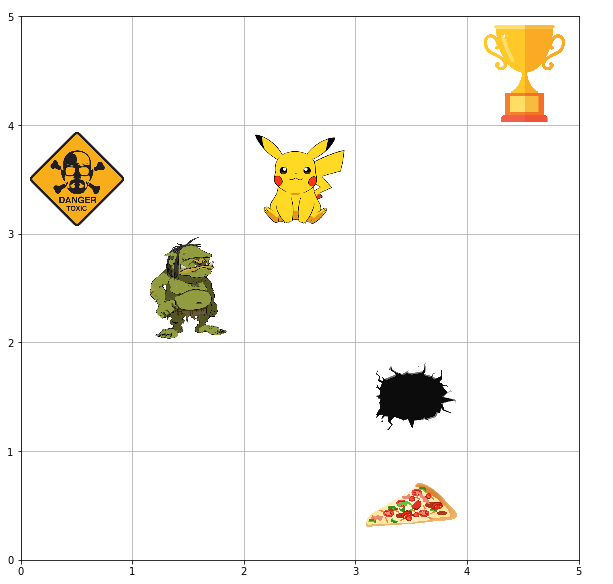

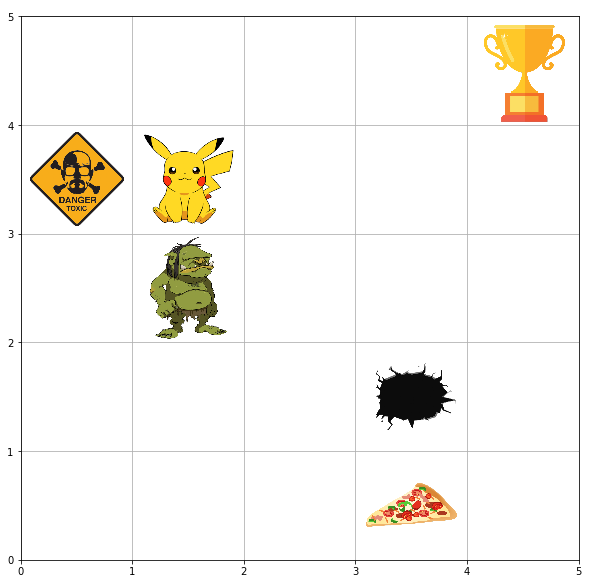

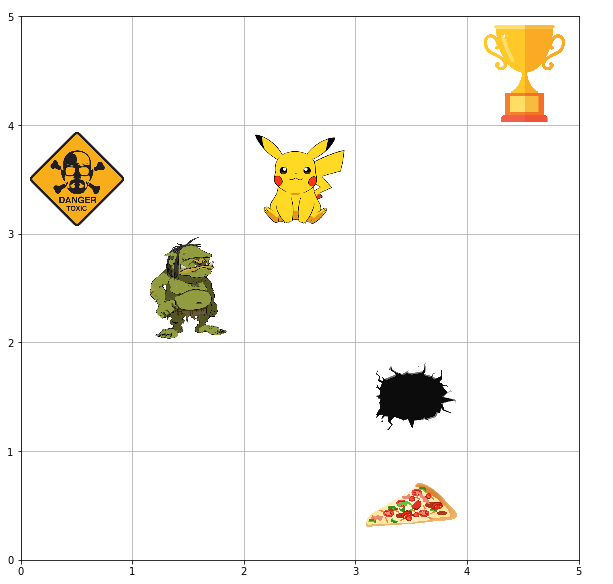

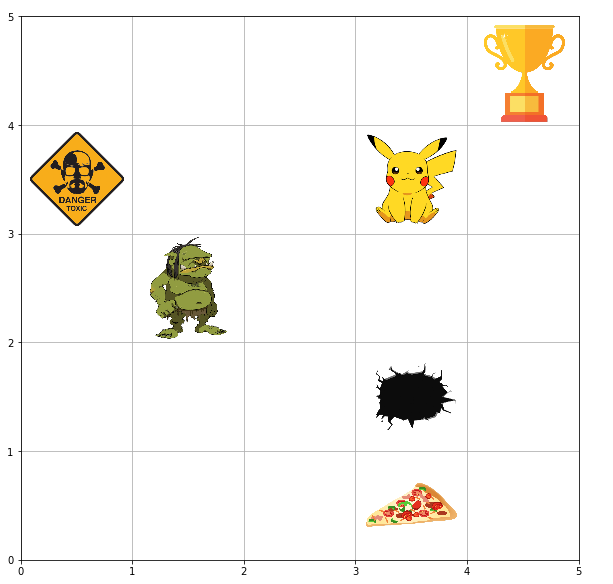

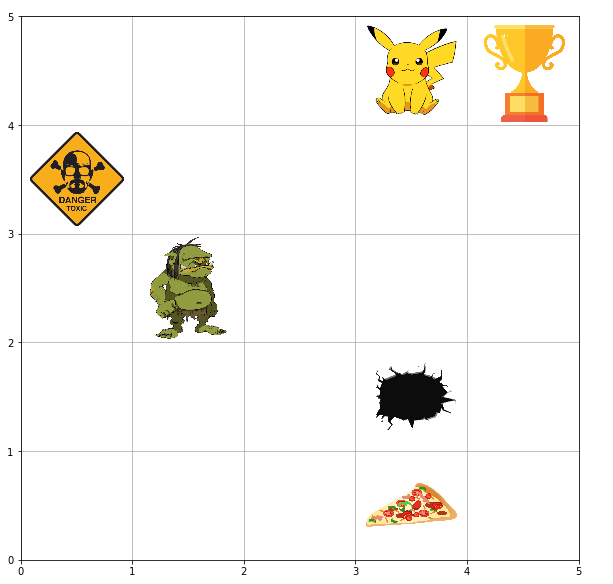

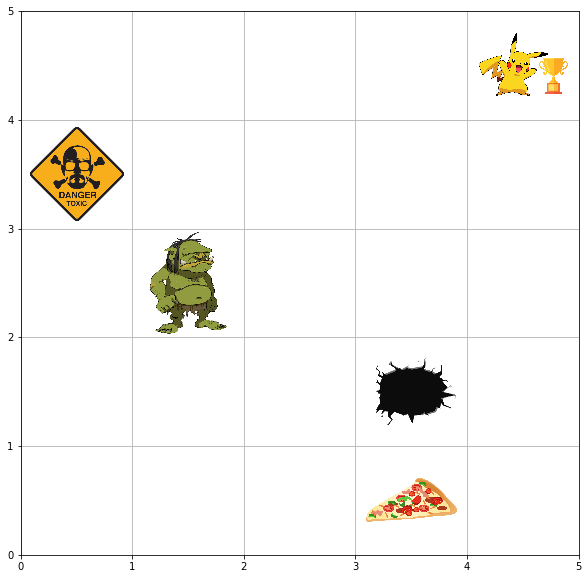

In [83]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['gamma_1']['Q_table_qs'], perform_render=True)

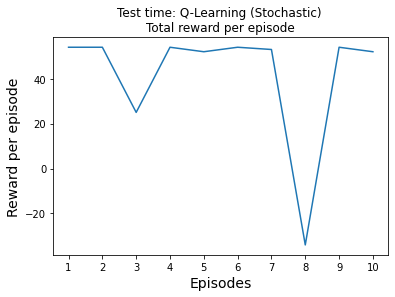

In [84]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Discount Factor: 0.9

In [108]:
# Initialize different paramters for Q-learning
alpha_lr = params['gamma_0_9']['alpha_lr']
epsilon = params['gamma_0_9']['epsilon']
gamma_df = params['gamma_0_9']['gamma_df']
episodes = params['gamma_0_9']['episodes']
epsilon_decay_rate = params['gamma_0_9']['epsilon_decay_rate']

In [109]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [110]:
# Run the Q-learning algorithm
total_reward_qs2, epsilon_decay_qs2, cumulative_reward_qs2, percentage_success_qs2, percentage_failure_qs2, avg_timestep_qs2 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [111]:
# Save the Q-table values
params['gamma_0_9']['Q_table_qs'] = Q_table

In [112]:
params['gamma_0_9']['Q_table_qs']

{(0, 0): array([-10.32811667, -10.00837682,  11.94494743, -10.19240475]),
 (0, 1): array([  2.17989365, -34.67312452, -38.32503409, -36.70648406]),
 (0, 2): array([-45.99455932,  16.69774835, -49.9999995 , -46.00264041]),
 (0, 3): array([ 1.36117953, -0.9       , 21.88645976, -0.9       ]),
 (0, 4): array([-0.9      , -0.9      , 23.4524986,  0.       ]),
 (1, 0): array([ 15.23335071, -22.56381508, -18.39306   , -35.29033734]),
 (1, 1): array([-45.84186466, -50.        ,  30.97178583, -45.92814905]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.554     ,  25.42939999, -42.30303507,  -0.18524231]),
 (1, 4): array([10.83150782, -0.9       , 29.366     ,  3.68520071]),
 (2, 0): array([-17.9604978 , -30.74255978, -32.66365275, -34.99087335]),
 (2, 1): array([-45.94870801,  39.71728254, -50.        , -45.94963066]),
 (2, 2): array([-41.81253922,  33.6925169 , -42.91784135, -49.99999992]),
 (2, 3): array([ 2.61740425,  9.9313132 , 38.59855776,  6.15205909]),
 (2, 4): array([33.74   

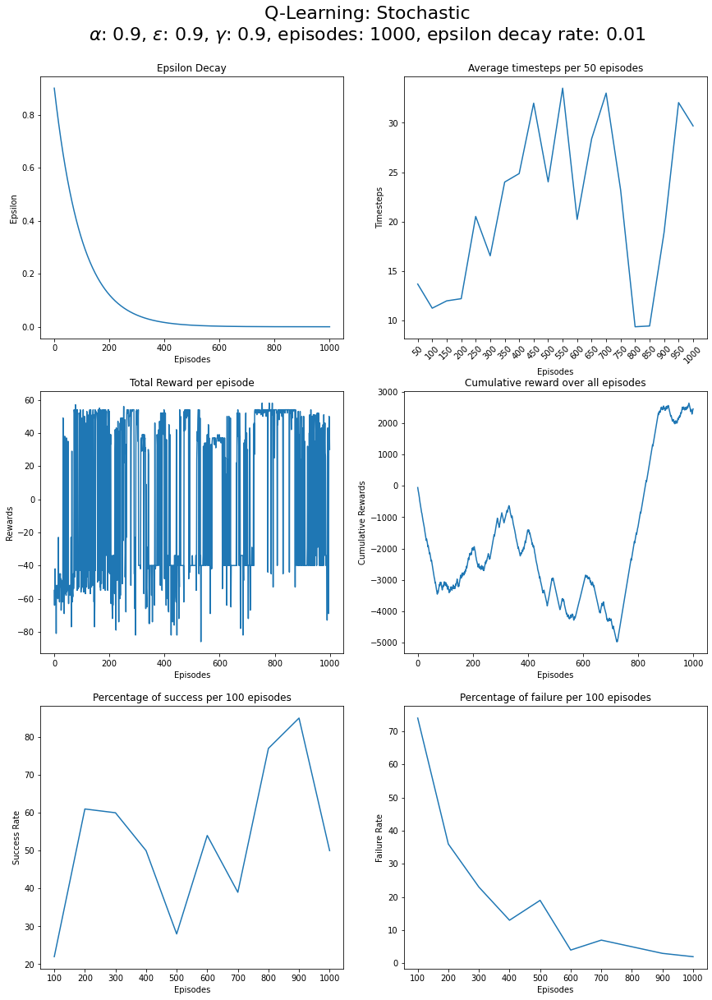

In [113]:
# Plot the graphs
title = 'Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qs2, epsilon_decay_qs2, cumulative_reward_qs2, percentage_success_qs2, percentage_failure_qs2, avg_timestep_qs2, episodes)

#### Test the agent

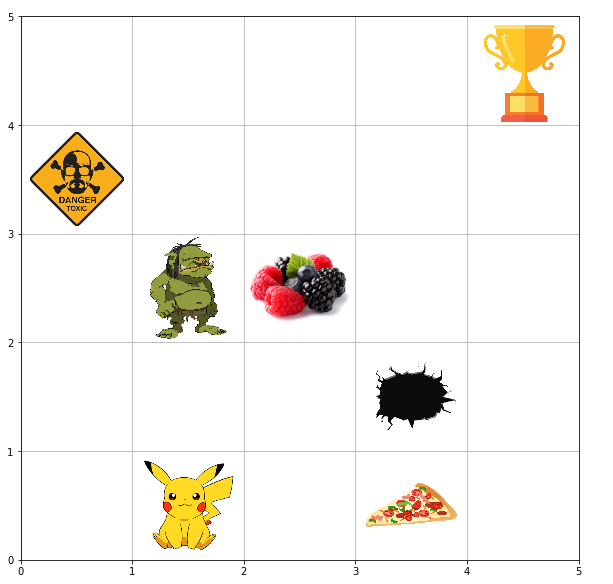

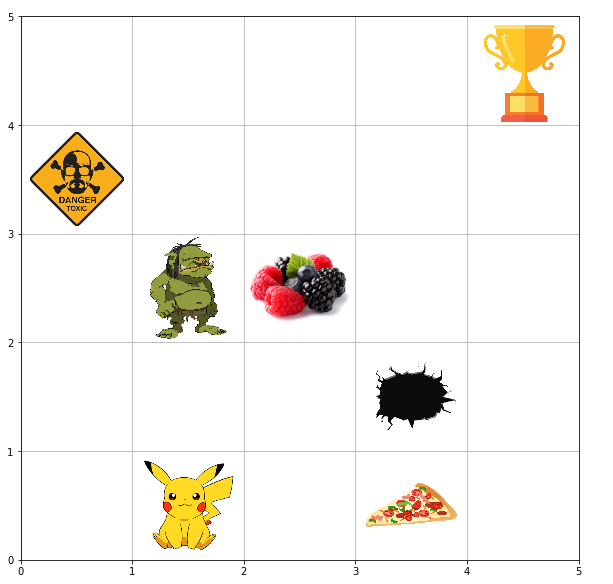

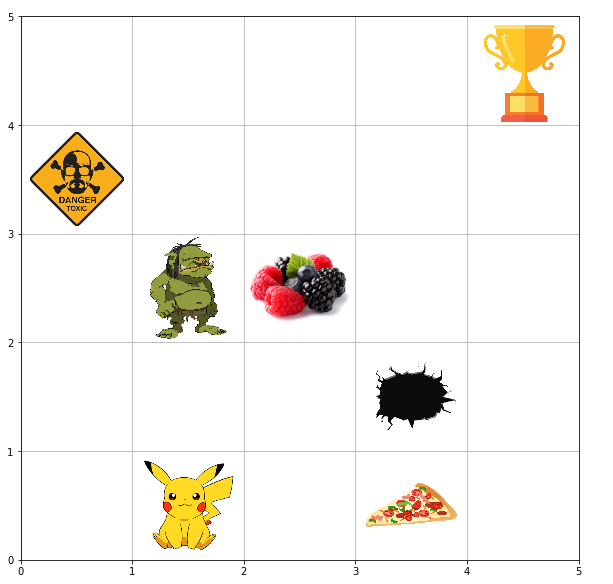

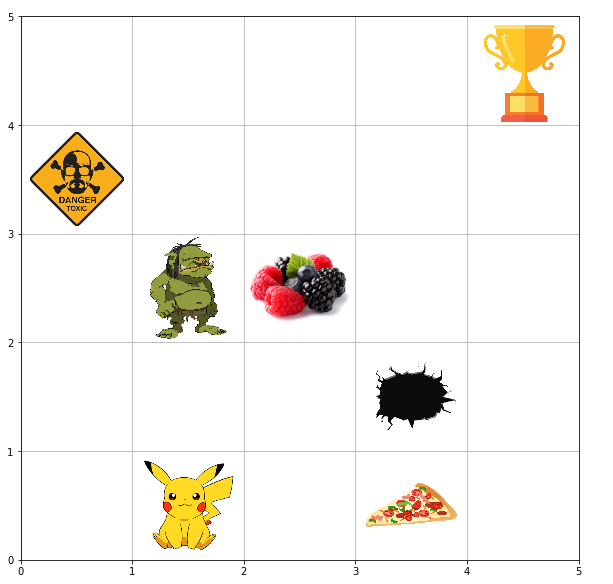

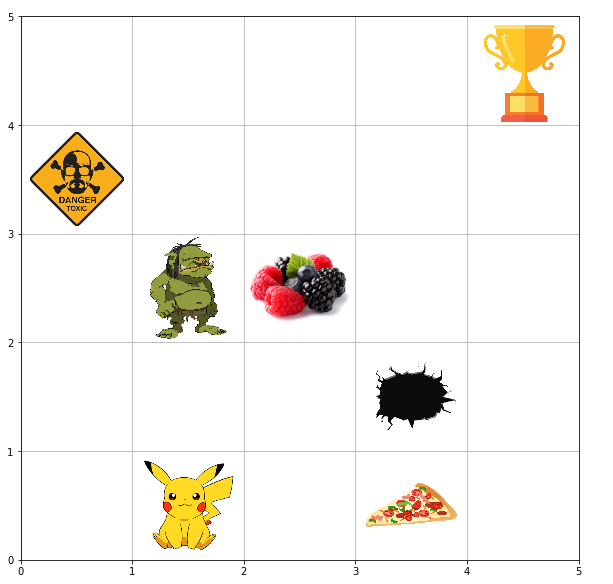

...

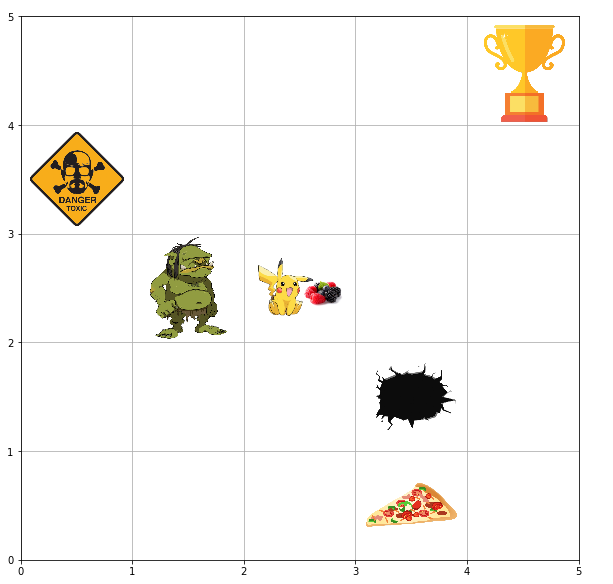

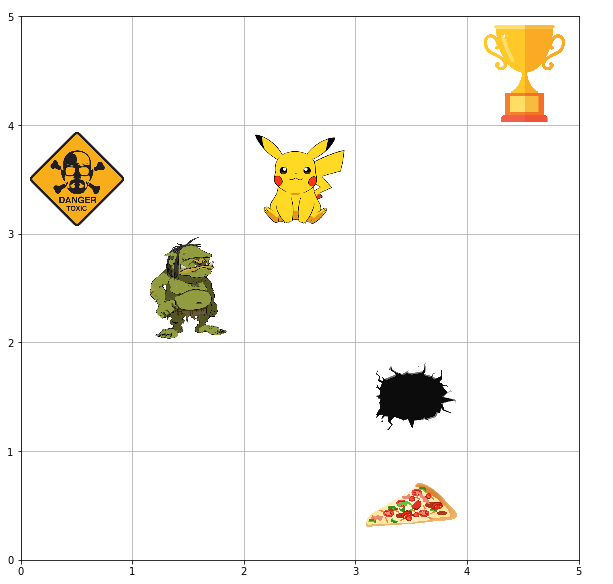

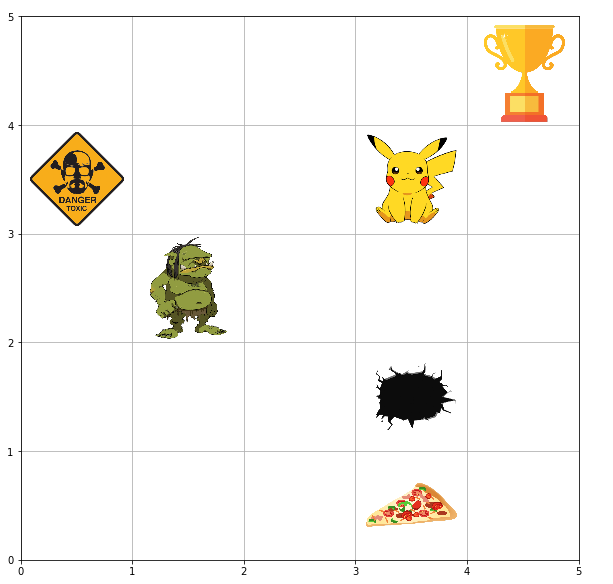

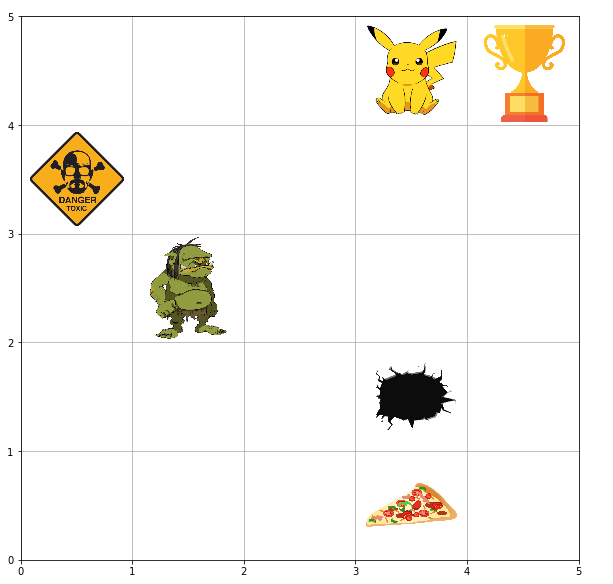

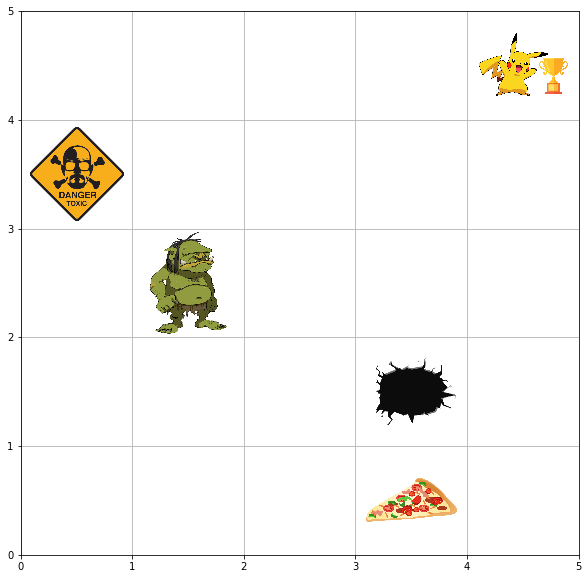

In [114]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['gamma_0_9']['Q_table_qs'], perform_render=True)

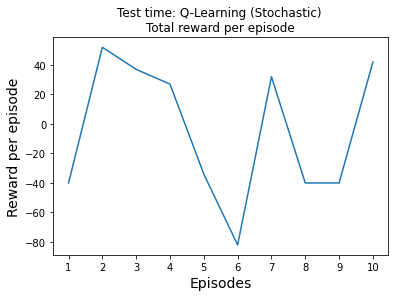

In [115]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Discount Factor: 0.5

In [122]:
# Initialize different paramters for Q-learning
alpha_lr = params['gamma_0_5']['alpha_lr']
epsilon = params['gamma_0_5']['epsilon']
gamma_df = params['gamma_0_5']['gamma_df']
episodes = params['gamma_0_5']['episodes']
epsilon_decay_rate = params['gamma_0_5']['epsilon_decay_rate']

In [123]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [124]:
# Run the Q-learning algorithm
total_reward_qs3, epsilon_decay_qs3, cumulative_reward_qs3, percentage_success_qs3, percentage_failure_qs3, avg_timestep_qs3 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [125]:
# Save the Q-table values
params['gamma_0_5']['Q_table_qs'] = Q_table

In [126]:
params['gamma_0_5']['Q_table_qs']

{(0, 0): array([-10.44340626, -10.26587292, -10.26562255,  -0.39932776]),
 (0, 1): array([-21.43999803, -21.51432006,   1.49435442, -21.43994027]),
 (0, 2): array([-10.23622477, -45.36098798, -49.9995    , -45.20034677]),
 (0, 3): array([-1.7947125 , -2.63592029, -0.9546839 , -1.84871538]),
 (0, 4): array([-1.58195984, -1.694475  , -1.52475001, -3.41775   ]),
 (1, 0): array([-21.18579787,   0.95516513, -21.40939521, -21.19576685]),
 (1, 1): array([-45.16805789, -50.        ,   5.09956941, -45.2       ]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.5       ,   0.6893472 , -44.55000076,  -1.4399955 ]),
 (1, 4): array([-1.32852157, -1.395     , 10.15647009, -1.6702648 ]),
 (2, 0): array([-15.99589955, -20.09428964, -16.03956828,  -1.40921424]),
 (2, 1): array([-45.19991932,  12.24437204, -49.99999995, -45.19892596]),
 (2, 2): array([-44.61491815, -44.67794071,   4.17270628, -49.999995  ]),
 (2, 3): array([ 0.68442723, 10.57353441,  1.59133763,  1.03601076]),
 (2,
  4): array([ 5

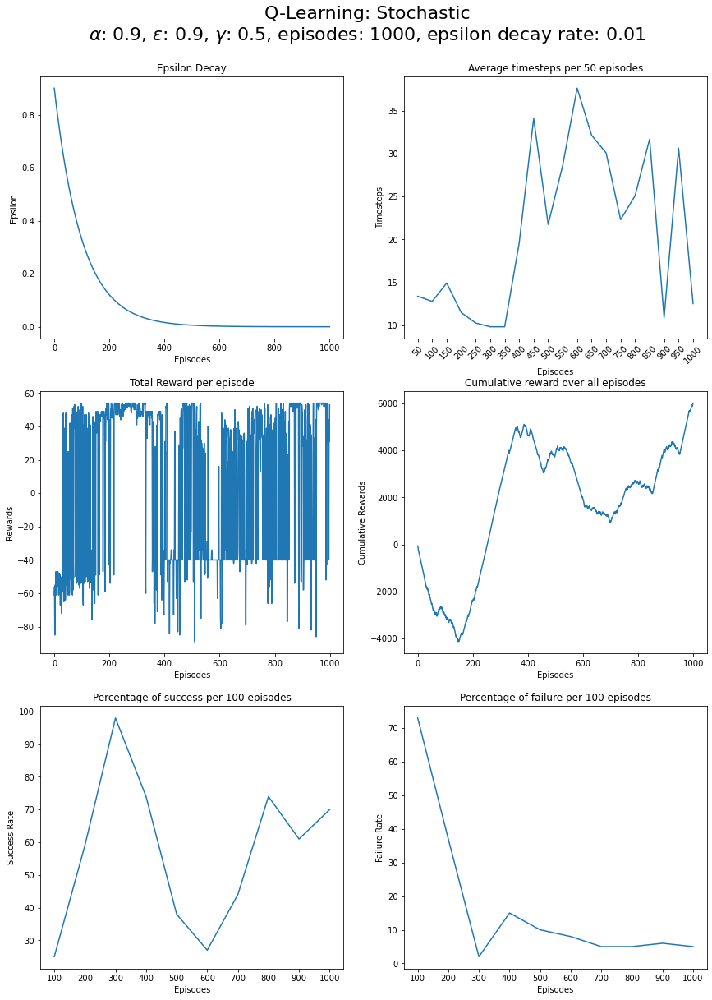

In [127]:
# Plot the graphs
title = 'Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qs3, epsilon_decay_qs3, cumulative_reward_qs3, percentage_success_qs3, percentage_failure_qs3, avg_timestep_qs3, episodes)

#### Test the agent

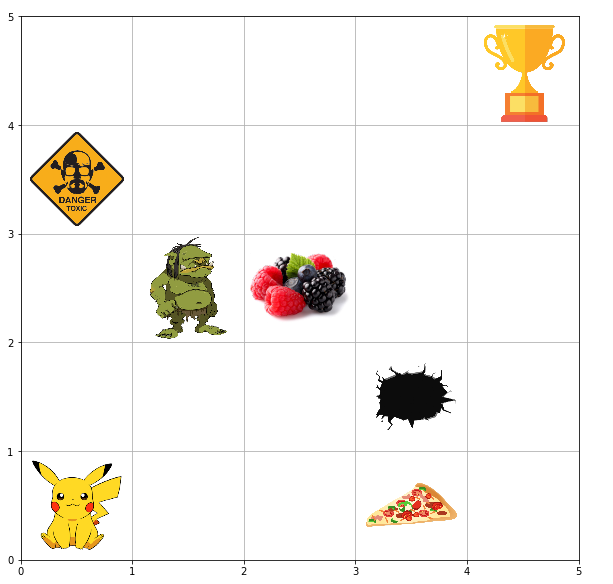

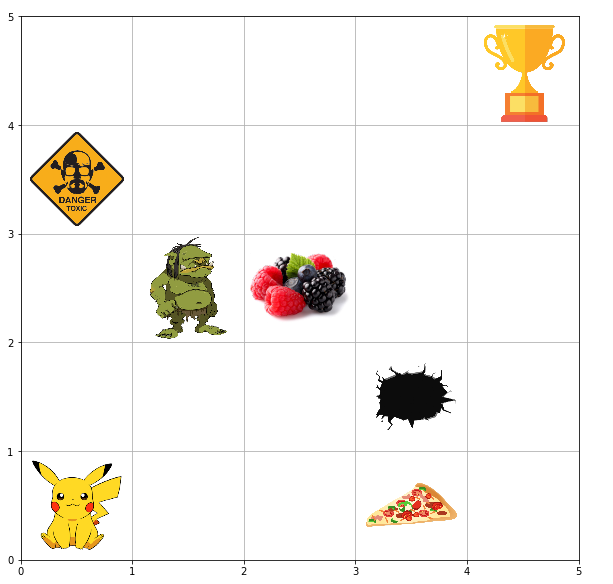

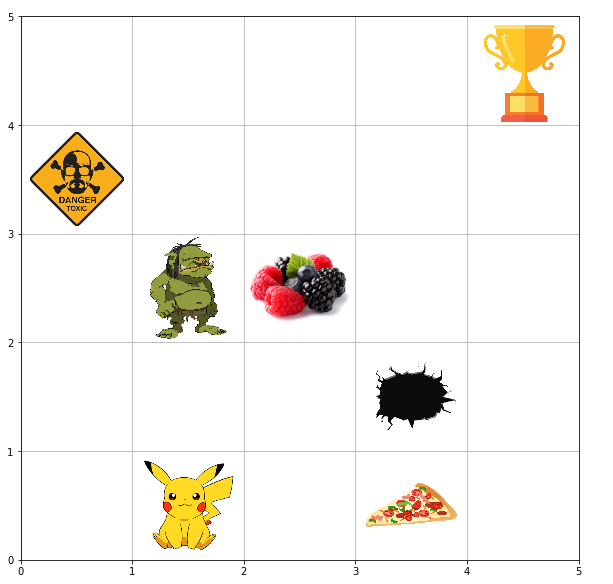

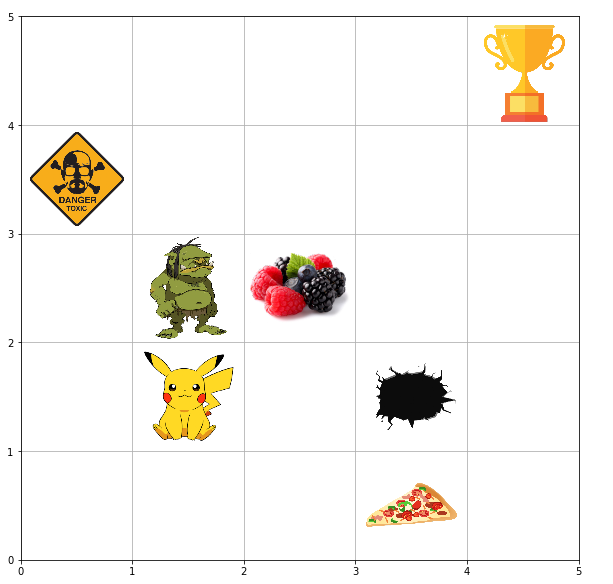

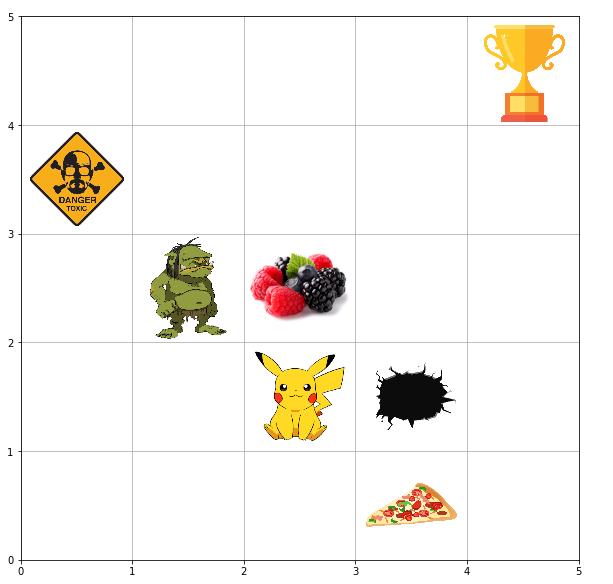

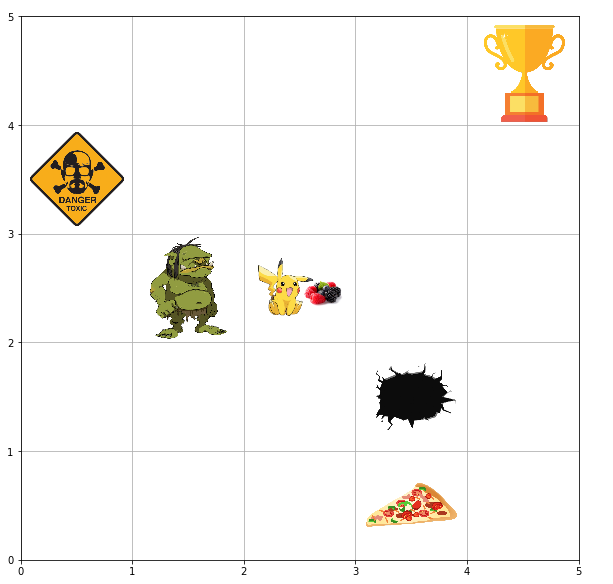

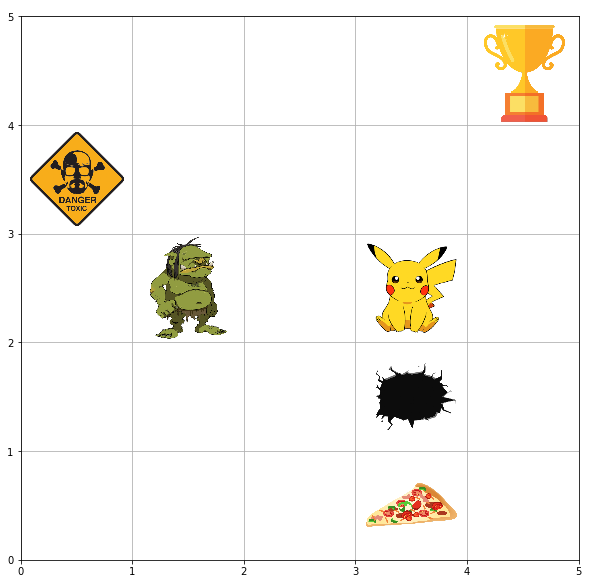

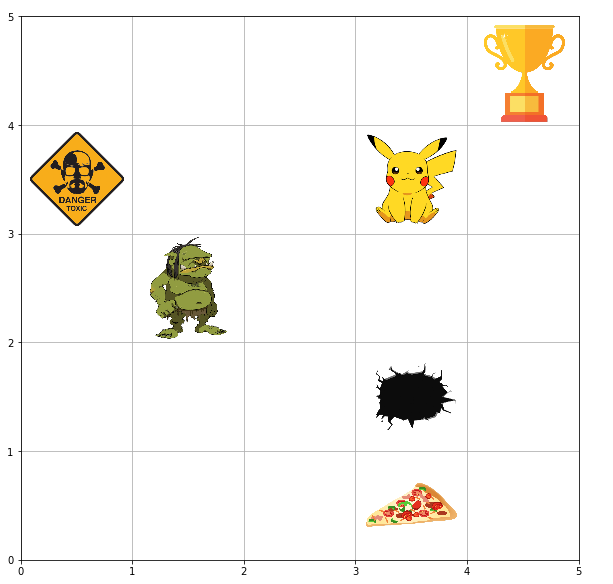

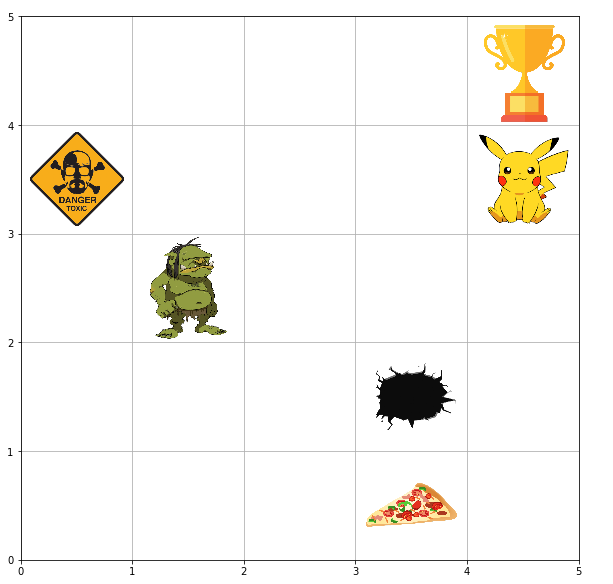

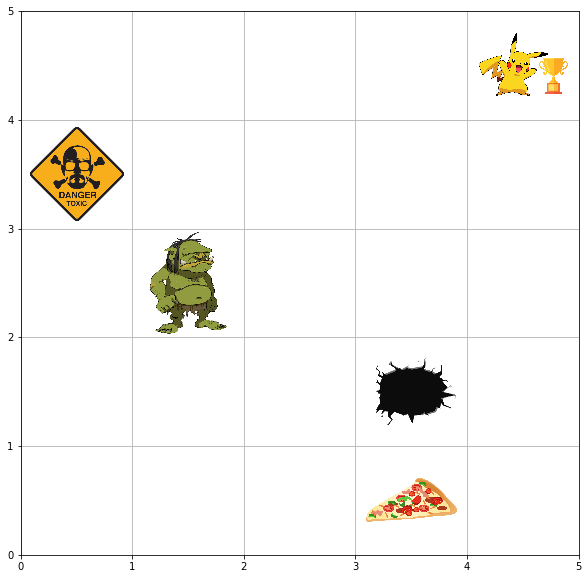

In [131]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['gamma_0_5']['Q_table_qs'], perform_render=True)

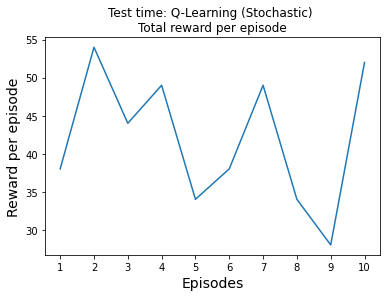

In [132]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Plot the comparative results for different values of gamma

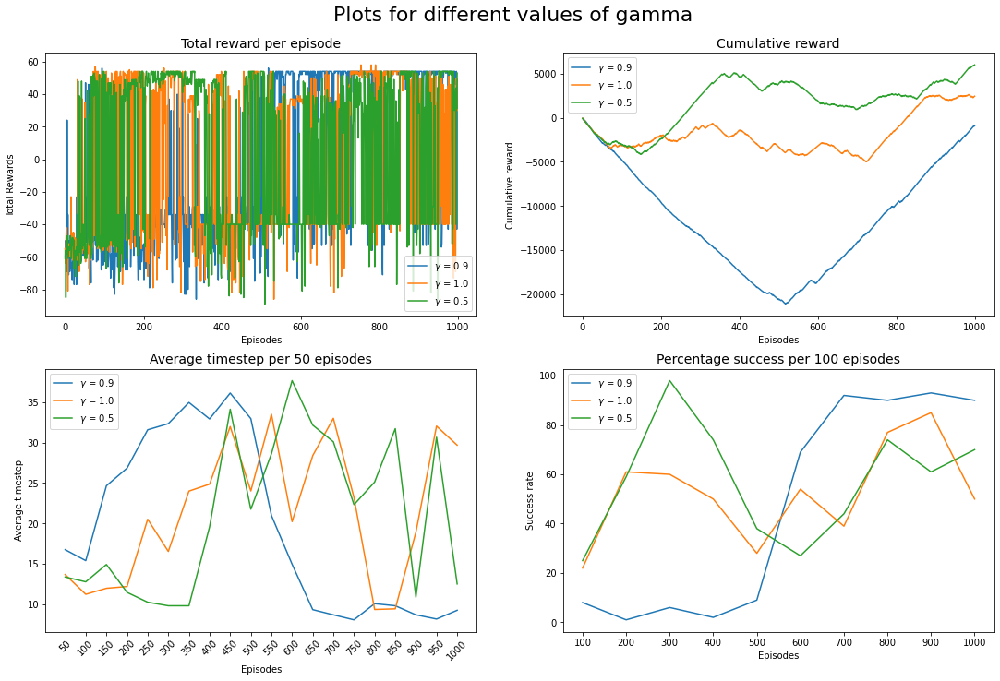

In [133]:
fig, axs = plt.subplots(2,2, figsize=(15,10))
fig.suptitle('Plots for different values of gamma', fontsize=22)
fig.tight_layout()
fig.subplots_adjust(top=0.91, hspace=0.2, wspace=0.2)
axs[0,0].plot(total_reward_qs1, label=r'$\gamma$ = 0.9')
axs[0,0].plot(total_reward_qs2, label=r'$\gamma$ = 1.0')
axs[0,0].plot(total_reward_qs3, label=r'$\gamma$ = 0.5')
axs[0,0].set_xlabel('Episodes')
axs[0,0].set_ylabel('Total Rewards')
axs[0,0].set_title('Total reward per episode', fontsize=14)
axs[0,0].legend()

axs[0,1].plot(cumulative_reward_qs1, label=r'$\gamma$ = 0.9')
axs[0,1].plot(cumulative_reward_qs2, label=r'$\gamma$ = 1.0')
axs[0,1].plot(cumulative_reward_qs3, label=r'$\gamma$ = 0.5')
axs[0,1].set_xlabel('Episodes')
axs[0,1].set_ylabel('Cumulative reward')
axs[0,1].set_title('Cumulative reward', fontsize=14)
axs[0,1].legend()

axs[1,0].plot(avg_timestep_qs1, label=r'$\gamma$ = 0.9')
axs[1,0].plot(avg_timestep_qs2, label=r'$\gamma$ = 1.0')
axs[1,0].plot(avg_timestep_qs3, label=r'$\gamma$ = 0.5')
axs[1,0].set_xticks(np.arange(len(avg_timestep_qs1)))
axs[1,0].set_xticklabels(list(range(0,1001,50))[1:], rotation=45)
axs[1,0].set_xlabel('Episodes')
axs[1,0].set_ylabel('Average timestep')
axs[1,0].set_title('Average timestep per 50 episodes', fontsize=14)
axs[1,0].legend()

axs[1,1].plot(percentage_success_qs1, label=r'$\gamma$ = 0.9')
axs[1,1].plot(percentage_success_qs2, label=r'$\gamma$ = 1.0')
axs[1,1].plot(percentage_success_qs3, label=r'$\gamma$ = 0.5')
axs[1,1].set_xticks(np.arange(len(percentage_success_qs1)))
axs[1,1].set_xticklabels(list(range(0,1001,100))[1:])
axs[1,1].set_xlabel('Episodes')
axs[1,1].set_ylabel('Success rate')
axs[1,1].set_title('Percentage success per 100 episodes', fontsize=14)
axs[1,1].legend()

plt.show()

### Epsilon Decay Rate: 0.01

In [153]:
# Initialize different paramters for Q-learning
alpha_lr = params['edr_01']['alpha_lr']
epsilon = params['edr_01']['epsilon']
gamma_df = params['edr_01']['gamma_df']
episodes = params['edr_01']['episodes']
epsilon_decay_rate = params['edr_01']['epsilon_decay_rate']

In [154]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [155]:
# Run the Q-learning algorithm
total_reward_qs4, epsilon_decay_qs4, cumulative_reward_qs4, percentage_success_qs4, percentage_failure_qs4, avg_timestep_qs4 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [156]:
# Save the Q-table values
params['edr_01']['Q_table_qs'] = Q_table

In [157]:
params['edr_01']['Q_table_qs']

{(0, 0): array([-25.54625296, -26.83341956,  20.76095618, -29.61299278]),
 (0, 1): array([-35.93758515,   9.24154429, -39.1406294 , -37.19647441]),
 (0, 2): array([-45.74478041,  22.76281897, -50.        , -45.10951566]),
 (0, 3): array([ 4.82562846, 29.366     , -3.36201608, -2.69905411]),
 (0, 4): array([-1.91531057, -2.46429   , 26.88657078, -2.38239   ]),
 (1, 0): array([-38.88088091, -39.14882355,   4.37501948, -35.9419976 ]),
 (1, 1): array([-10.40489898, -50.        , -46.30433173, -46.1312494 ]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.95      , -41.99828654, -41.65520999,  25.15027104]),
 (1, 4): array([-0.9999    , -0.6560241 , 36.90779525, -0.9       ]),
 (2, 0): array([-38.34892601, -38.75842165,  22.99673568, -33.6961838 ]),
 (2, 1): array([-10.01442998, -47.87933086, -49.99275683, -45.99972615]),
 (2, 2): array([-44.48704243, -49.16260022,  32.96154691, -49.24651218]),
 (2, 3): array([ 9.77346064,  9.16768822, 31.84031957, 10.54024799]),
 (2, 4): array([12.4

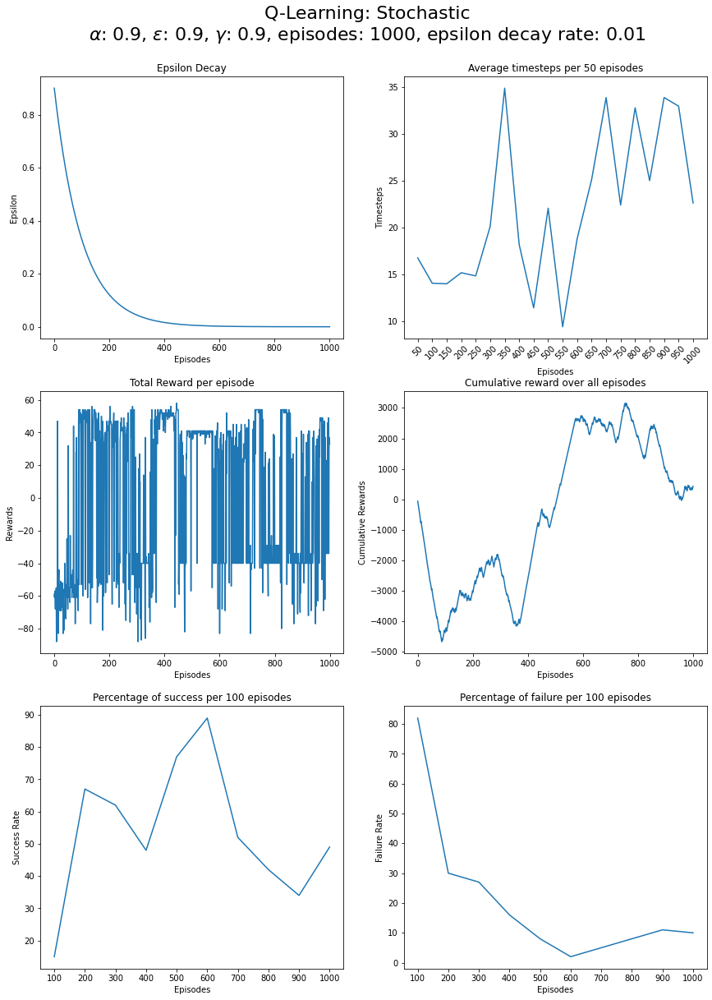

In [158]:
# Plot the graphs
title = 'Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qs4, epsilon_decay_qs4, cumulative_reward_qs4, percentage_success_qs4, percentage_failure_qs4, avg_timestep_qs4, episodes)

#### Test the agent

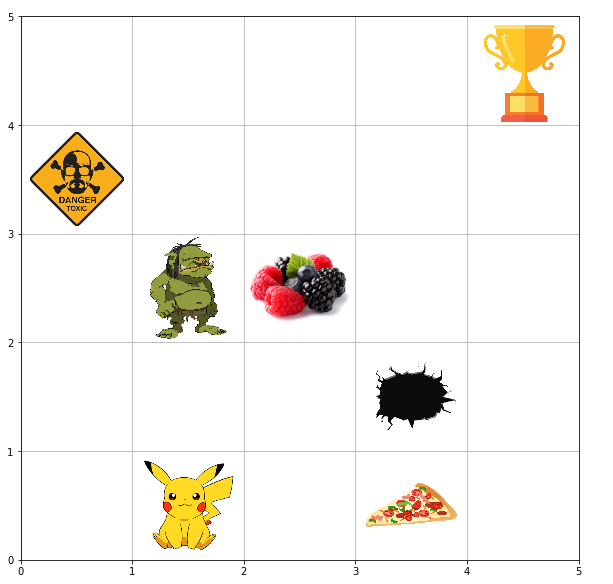

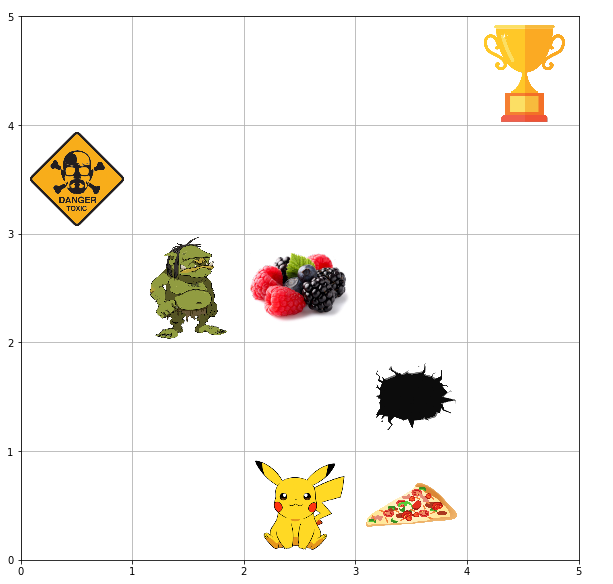

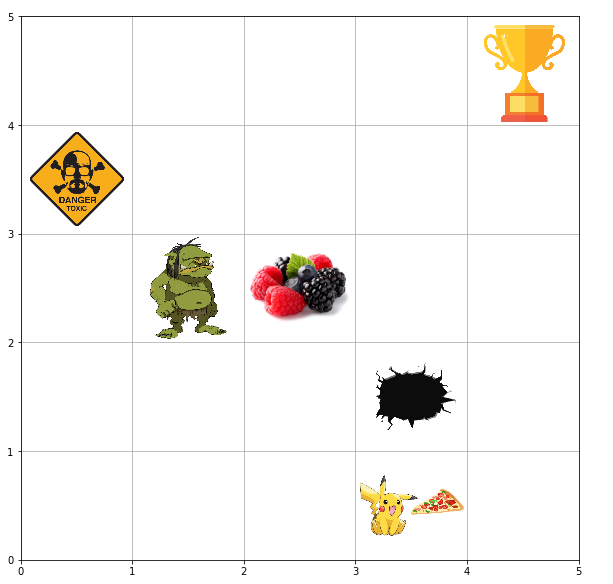

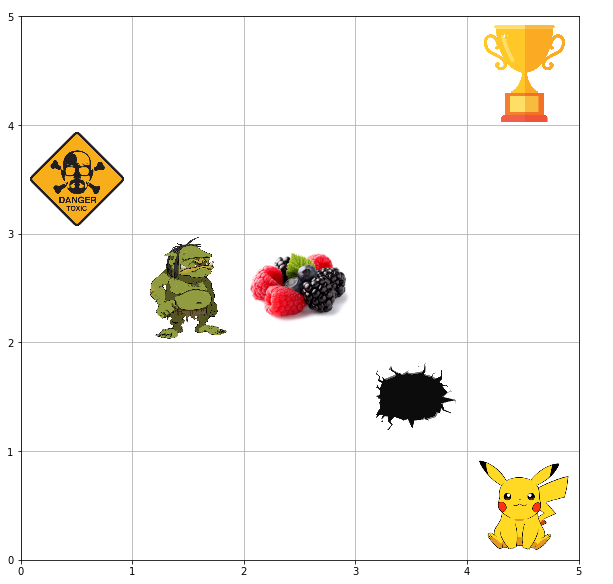

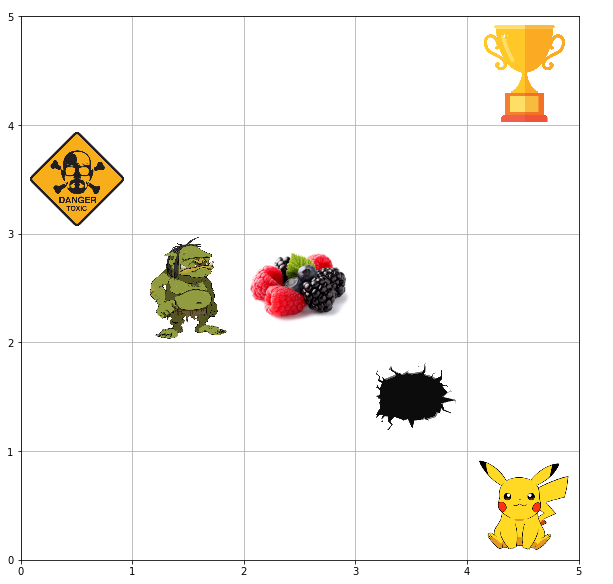

...

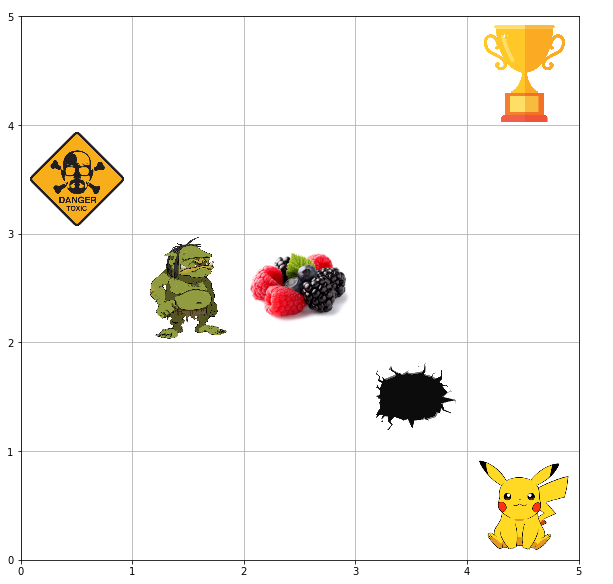

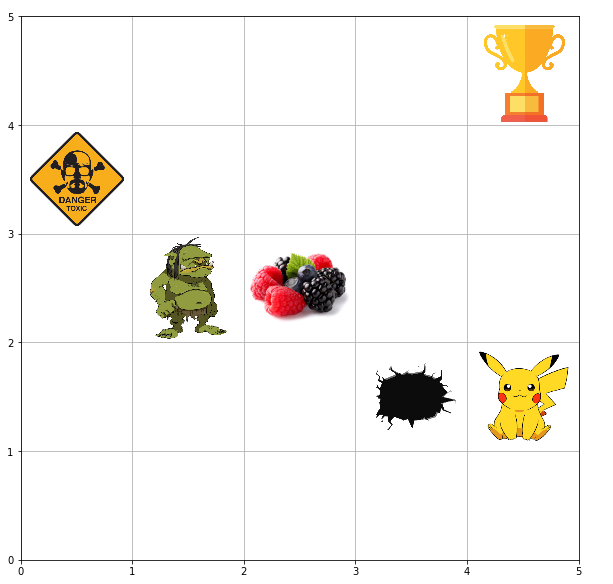

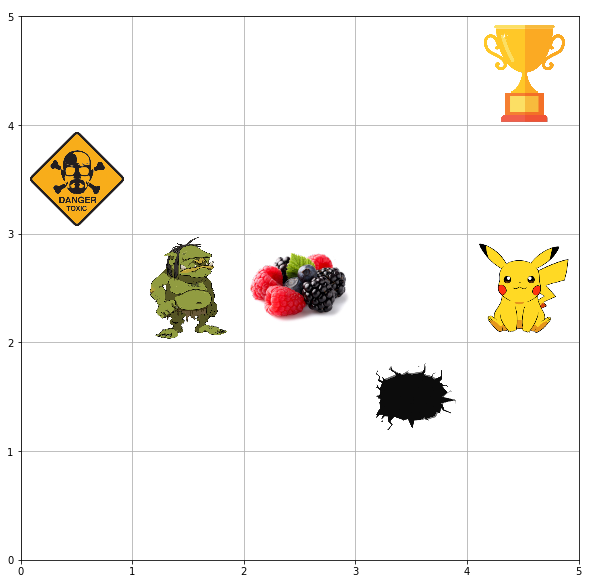

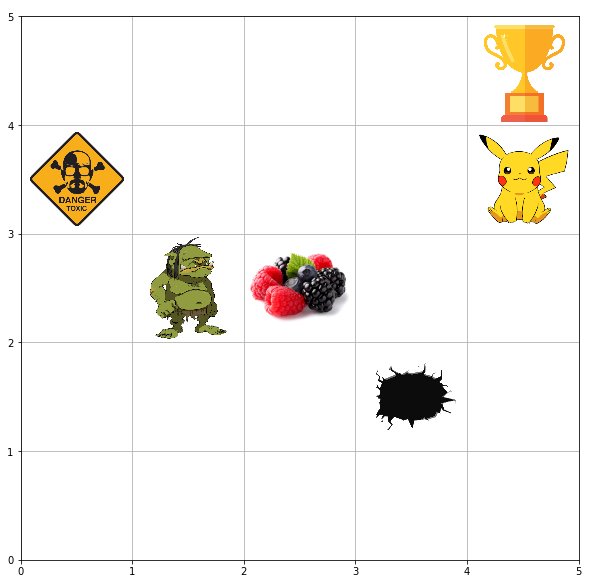

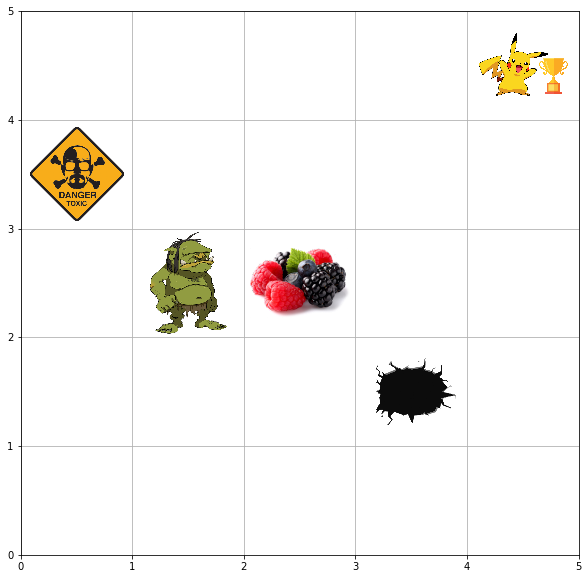

In [159]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['edr_01']['Q_table_qs'], perform_render=True)

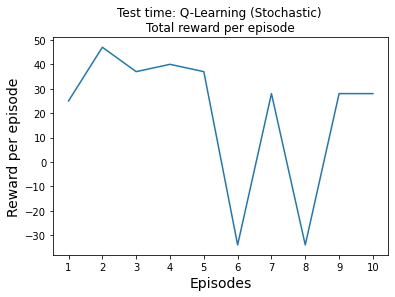

In [160]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Epsilon Decay Rate: 0.001

In [184]:
# Initialize different paramters for Q-learning
alpha_lr = params['edr_001']['alpha_lr']
epsilon = params['edr_001']['epsilon']
gamma_df = params['edr_001']['gamma_df']
episodes = params['edr_001']['episodes']
epsilon_decay_rate = params['edr_001']['epsilon_decay_rate']

In [185]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [186]:
# Run the Q-learning algorithm
total_reward_qs5, epsilon_decay_qs5, cumulative_reward_qs5, percentage_success_qs5, percentage_failure_qs5, avg_timestep_qs5 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [187]:
# Save the Q-table values
params['edr_001']['Q_table_qs'] = Q_table

In [188]:
params['edr_001']['Q_table_qs']

{(0, 0): array([15.14889801, 11.02731309, 26.29111371, 20.18398882]),
 (0, 1): array([12.94702889, 19.82257303, 13.75180692, 12.96120671]),
 (0, 2): array([17.87596319, 23.48597554, 14.11431515, 20.87389633]),
 (0, 3): array([18.89891523, 25.71582087, 29.36233567, 26.65123499]),
 (0, 4): array([25.22164564, 25.32107397, 33.00133633, 25.68969594]),
 (1, 0): array([25.53090262, 30.78371718, 21.81271597, 19.99501145]),
 (1, 1): array([ 12.93981512, -49.31601757,  35.33157687,  12.46834549]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-50.        ,  33.73213981,  33.66939135,  26.56881458]),
 (1, 4): array([30.596892  , 29.93073902, 34.26973959, 29.02428167]),
 (2, 0): array([12.00582   , 34.48794231, 12.19591148, 11.56804675]),
 (2, 1): array([ 14.13001911,  40.36591238, -43.34345707,  26.70405874]),
 (2, 2): array([ 30.51055614, -41.62602732,  33.73699278, -50.        ]),
 (2, 3): array([37.87710919, 33.87607955, 38.59968426, 29.36366276]),
 (2, 4): array([33.7537057 , 38.59945787

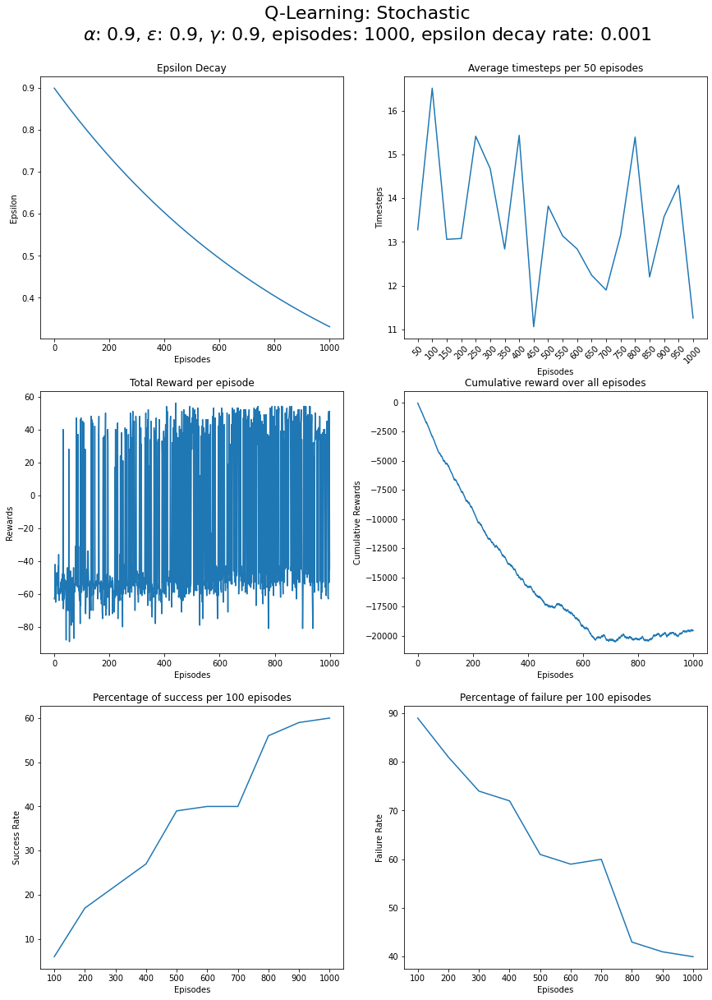

In [189]:
# Plot the graphs
title = 'Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qs5, epsilon_decay_qs5, cumulative_reward_qs5, percentage_success_qs5, percentage_failure_qs5, avg_timestep_qs5, episodes)

#### Test the agent

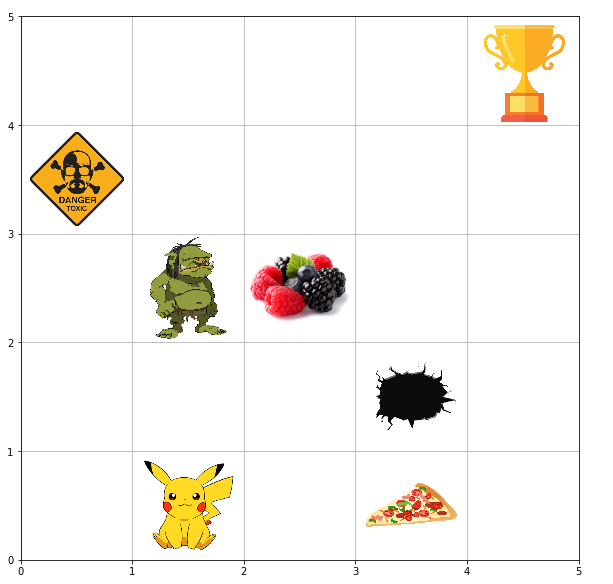

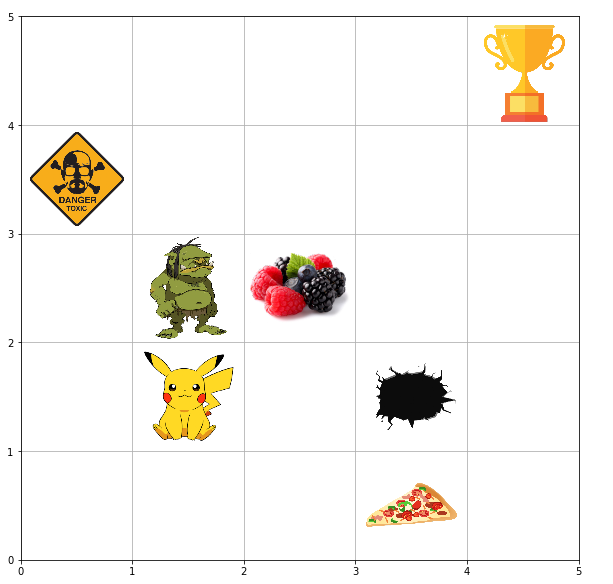

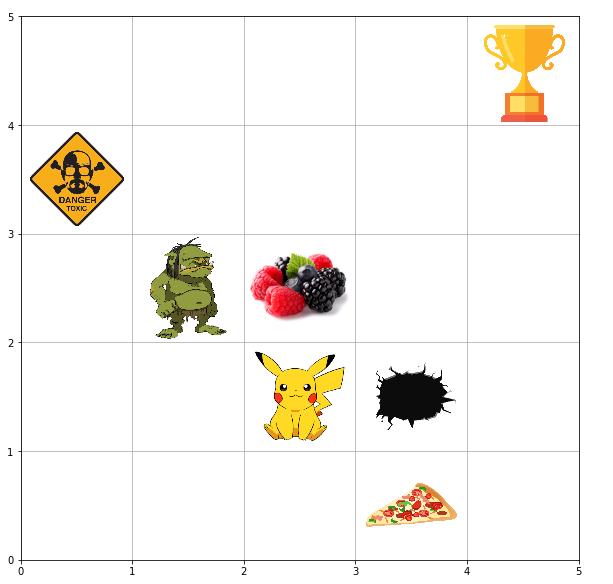

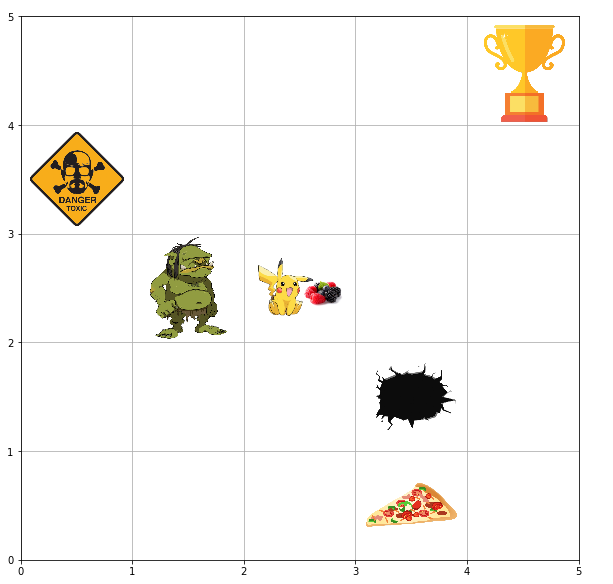

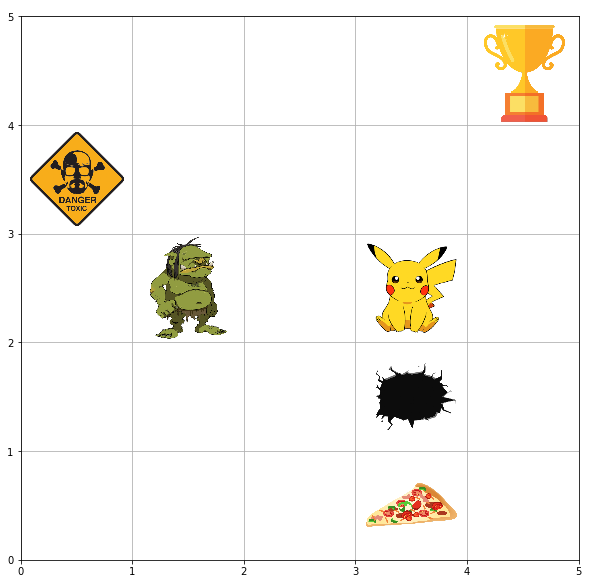

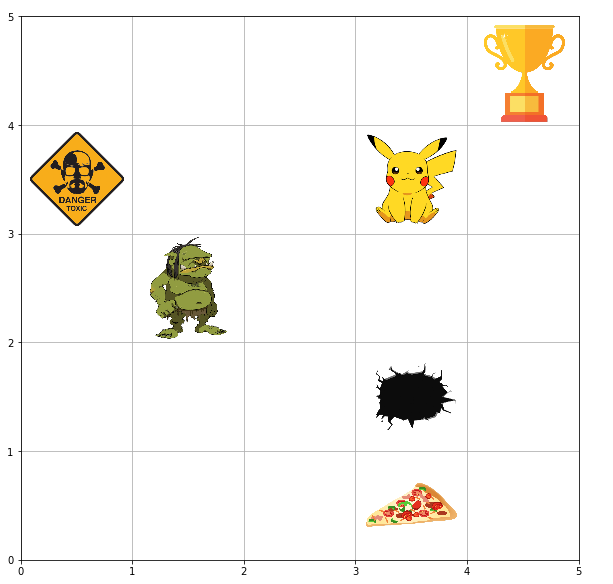

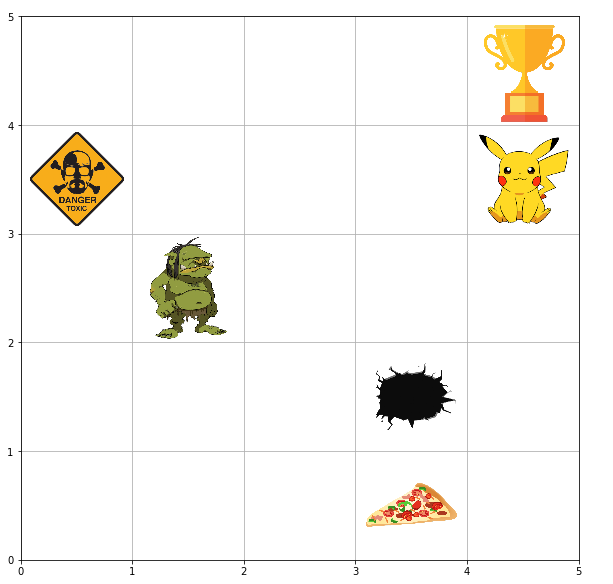

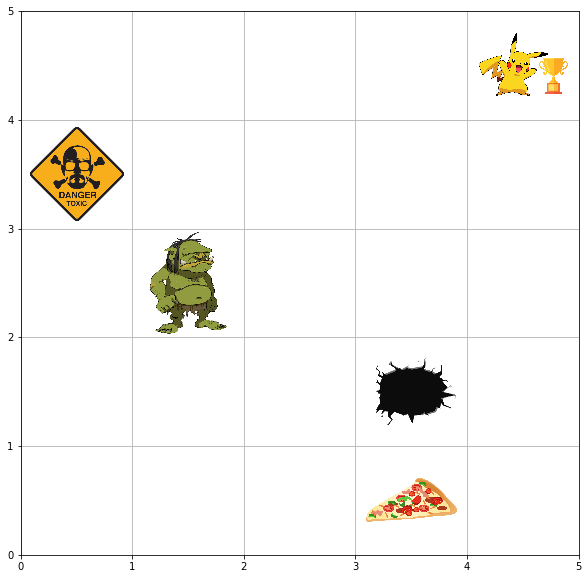

In [190]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['edr_001']['Q_table_qs'], perform_render=True)

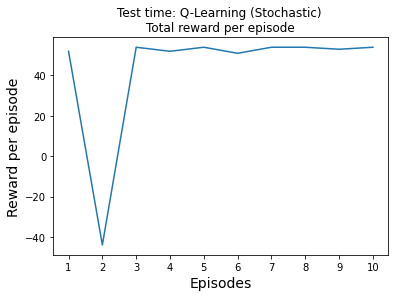

In [191]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Epsilon Decay Rate: 0.005

In [192]:
# Initialize different paramters for Q-learning
alpha_lr = params['edr_005']['alpha_lr']
epsilon = params['edr_005']['epsilon']
gamma_df = params['edr_005']['gamma_df']
episodes = params['edr_005']['episodes']
epsilon_decay_rate = params['edr_005']['epsilon_decay_rate']

In [193]:
# Initialize Q-table to zero
Q_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [194]:
# Run the Q-learning algorithm
total_reward_qs6, epsilon_decay_qs6, cumulative_reward_qs6, percentage_success_qs6, percentage_failure_qs6, avg_timestep_qs6 = qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [195]:
# Save the Q-table values
params['edr_005']['Q_table_qs'] = Q_table

In [196]:
params['edr_005']['Q_table_qs']

{(0, 0): array([ -9.99996195, -11.82151288,  -6.60588121,  -9.30116242]),
 (0, 1): array([-12.73404578, -33.46261277,  -8.9607139 , -38.41859694]),
 (0, 2): array([-45.18784085,  12.15156169, -45.2898859 , -45.78284357]),
 (0, 3): array([10.80088893, 25.4224529 , 11.86991592, 11.33489059]),
 (0, 4): array([14.68614885, 17.49443091, 26.66521898, 17.23034274]),
 (1, 0): array([-38.98029421, -36.34089724,  -9.51729052, -10.88809256]),
 (1, 1): array([ -9.26530577, -46.36379636, -46.14352298, -45.92669749]),
 (1, 2): array([0., 0., 0., 0.]),
 (1, 3): array([-49.99999287, -44.03897073, -41.62600373, -43.01643027]),
 (1, 4): array([ 1.81716364, 16.6503651 , 36.94125739, 17.84875569]),
 (2, 0): array([ -3.62602951, -30.47464684, -32.44454095, -24.02426448]),
 (2, 1): array([-45.92630814,  40.33352209, -50.        ,  -6.46347131]),
 (2, 2): array([-44.43095775, -41.67154433,  33.7376431 , -50.        ]),
 (2, 3): array([23.42683404, 30.07624103, 24.12742134, 16.17695483]),
 (2, 4): array([27.0

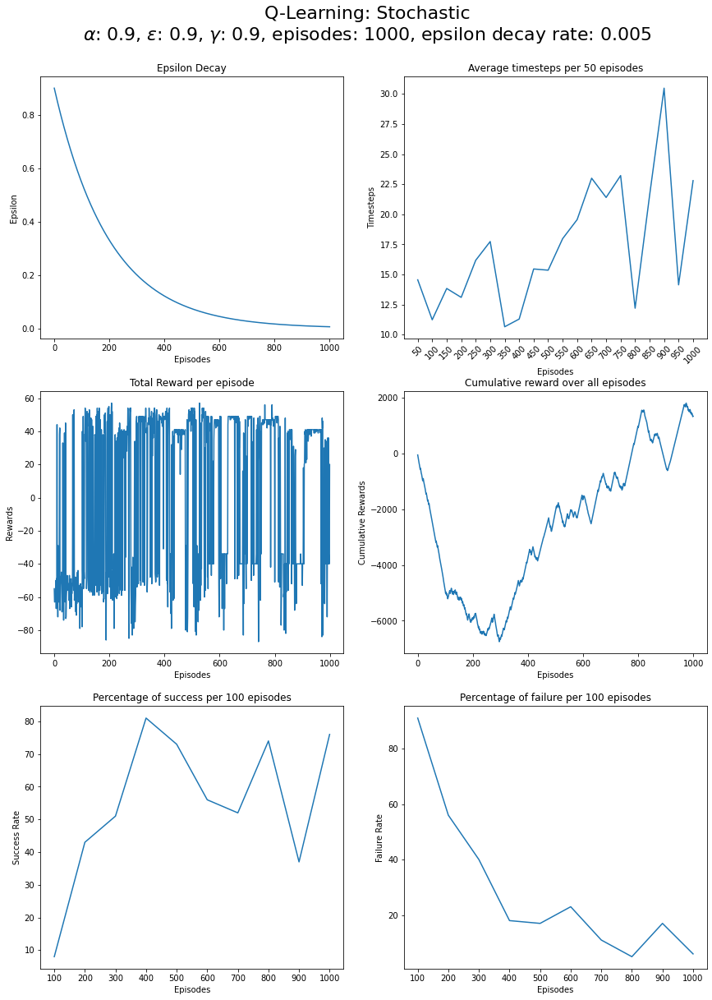

In [197]:
# Plot the graphs
title = 'Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_qs6, epsilon_decay_qs6, cumulative_reward_qs6, percentage_success_qs6, percentage_failure_qs6, avg_timestep_qs6, episodes)

#### Test the agent

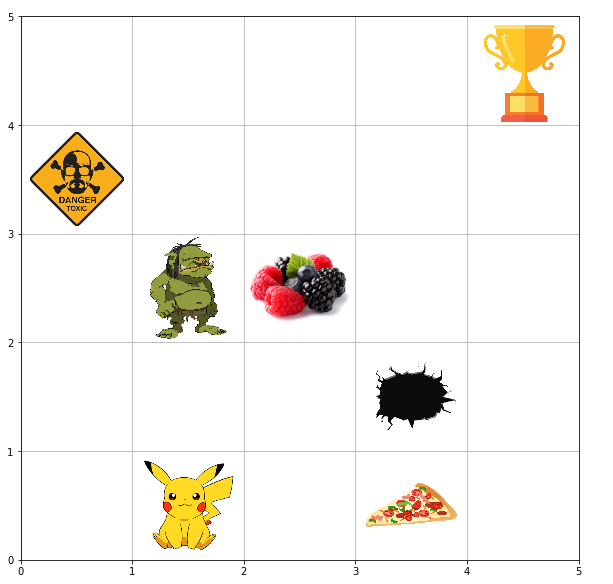

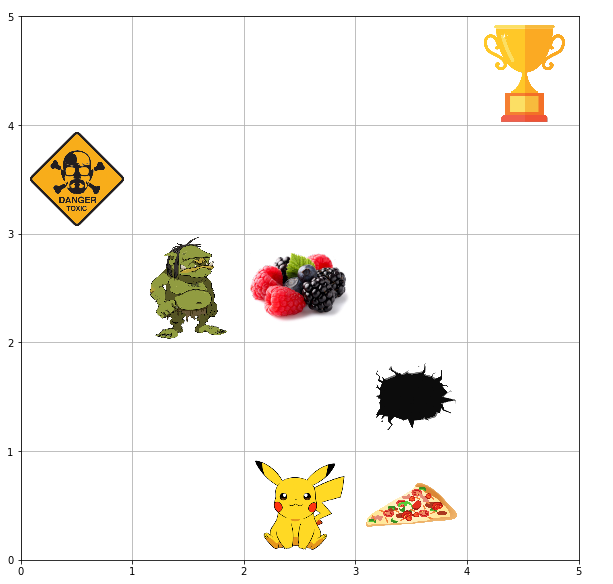

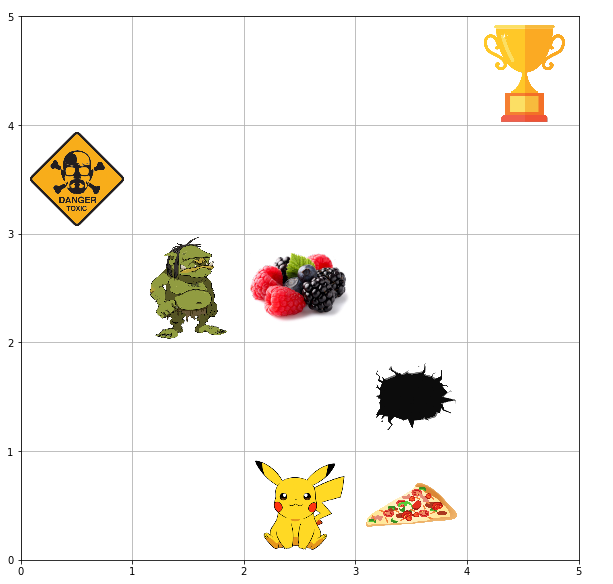

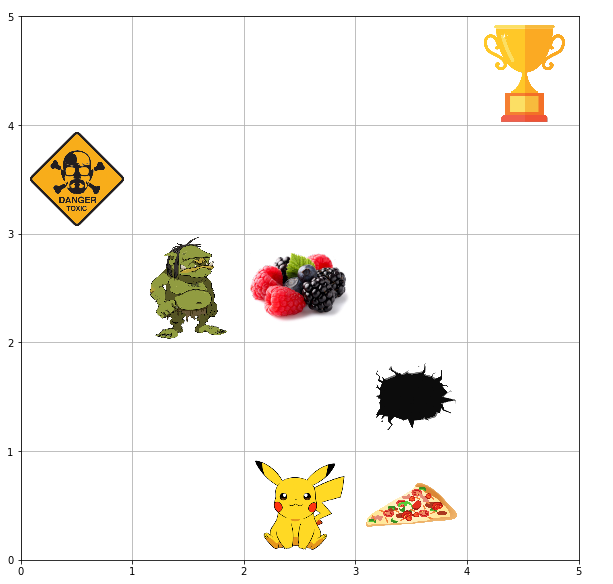

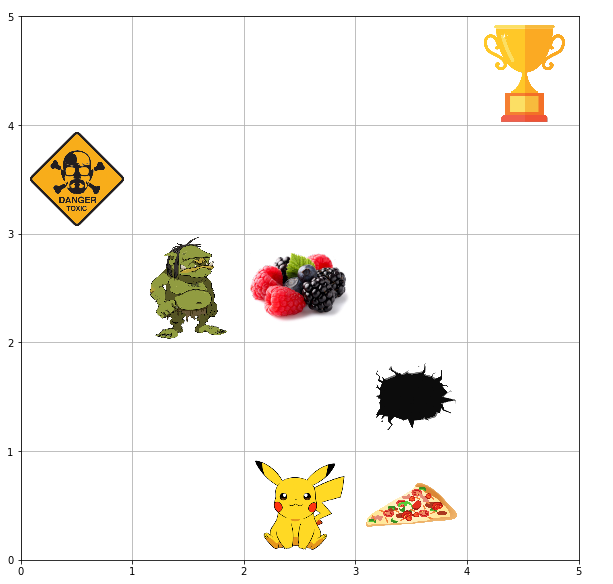

...

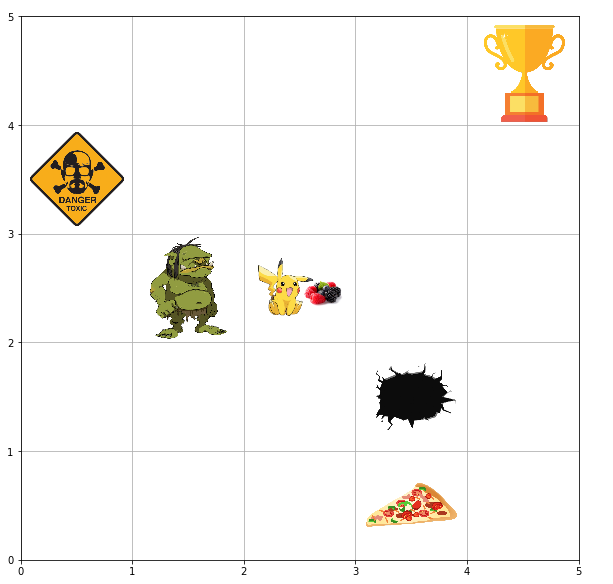

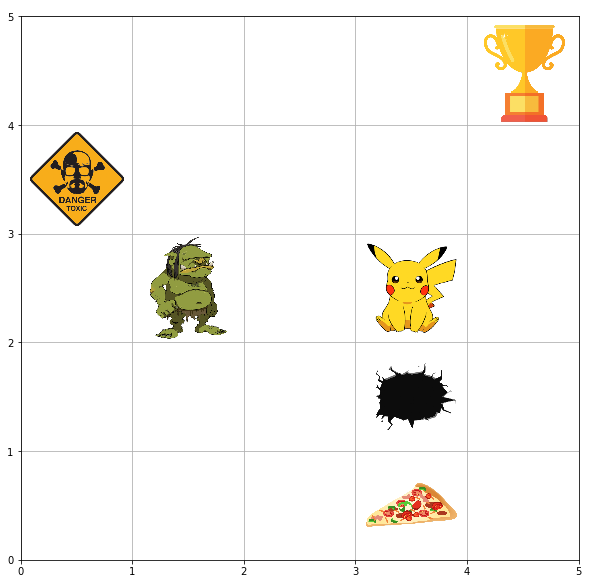

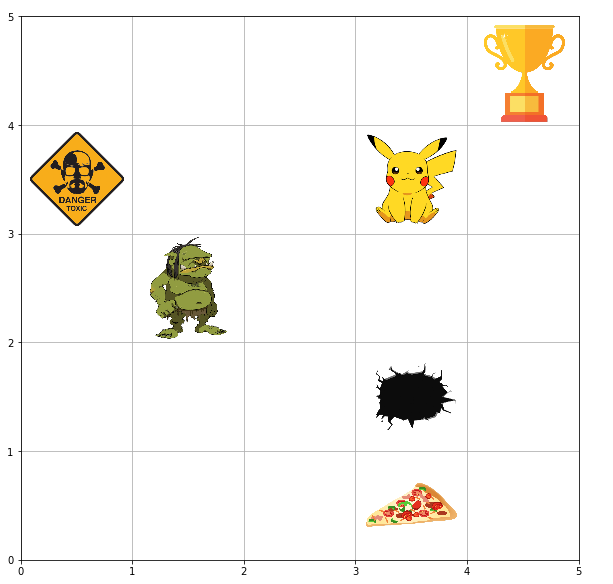

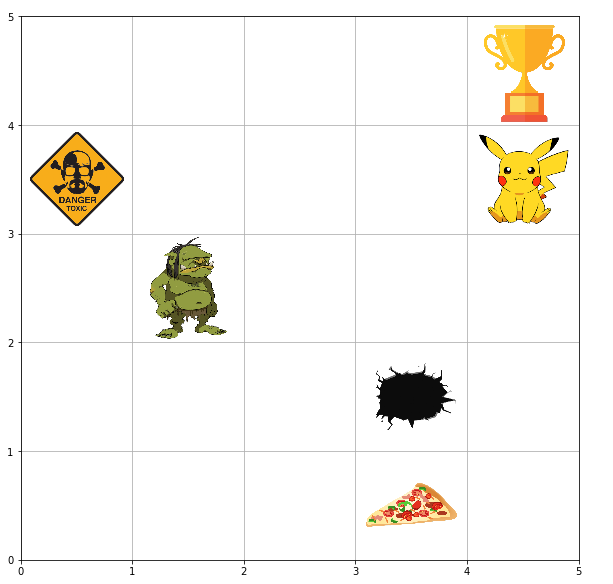

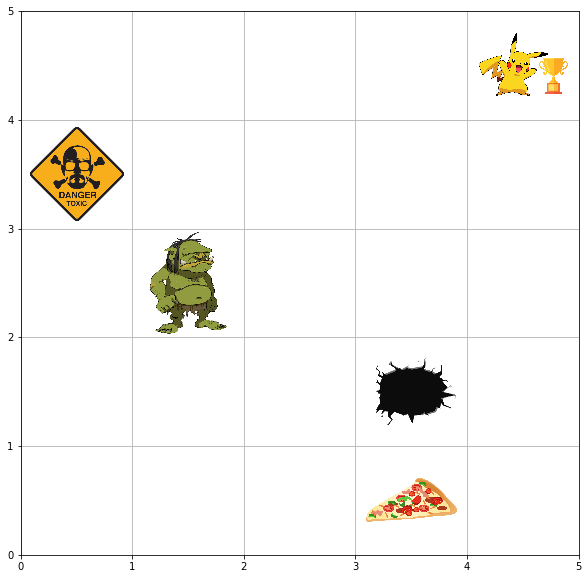

In [198]:
episodes = 10
test_total_reward_arr = test_agent(env, episodes, params['edr_005']['Q_table_qs'], perform_render=True)

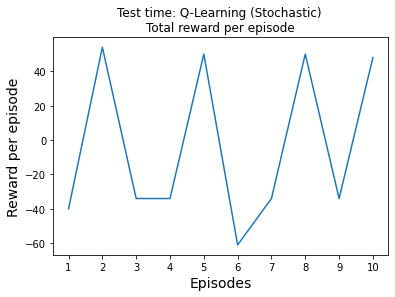

In [199]:
plt.plot(test_total_reward_arr)
plt.title('Test time: Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

### Plot the comparative results for different epsilon decay rate values

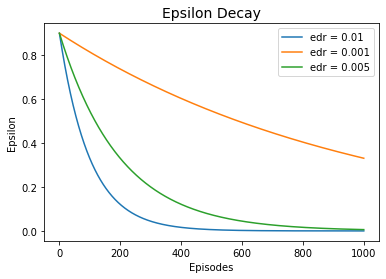

In [200]:
plt.plot(epsilon_decay_qs4, label=r'edr = 0.01')
plt.plot(epsilon_decay_qs5, label=r'edr = 0.001')
plt.plot(epsilon_decay_qs6, label=r'edr = 0.005')
plt.xlabel('Episodes')
plt.ylabel('Epsilon')
plt.title('Epsilon Decay', fontsize=14)
plt.legend()
plt.show()

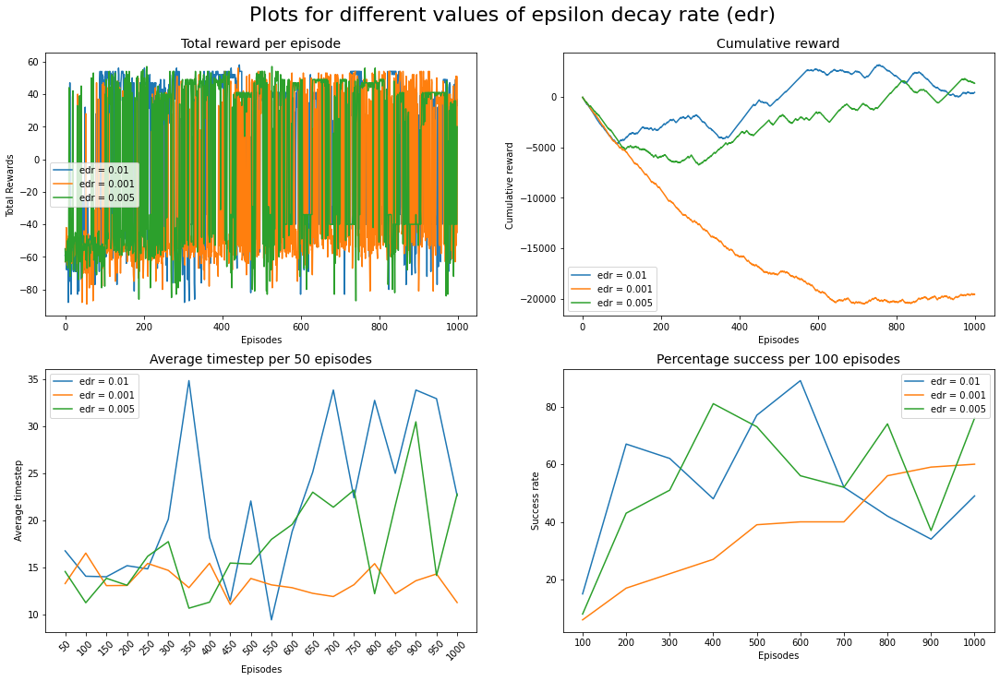

In [201]:
fig, axs = plt.subplots(2,2, figsize=(15,10))
fig.suptitle('Plots for different values of epsilon decay rate (edr)', fontsize=22)
fig.tight_layout()
fig.subplots_adjust(top=0.91, hspace=0.2, wspace=0.2)
axs[0,0].plot(total_reward_qs4, label=r'edr = 0.01')
axs[0,0].plot(total_reward_qs5, label=r'edr = 0.001')
axs[0,0].plot(total_reward_qs6, label=r'edr = 0.005')
axs[0,0].set_xlabel('Episodes')
axs[0,0].set_ylabel('Total Rewards')
axs[0,0].set_title('Total reward per episode', fontsize=14)
axs[0,0].legend()

axs[0,1].plot(cumulative_reward_qs4, label=r'edr = 0.01')
axs[0,1].plot(cumulative_reward_qs5, label=r'edr = 0.001')
axs[0,1].plot(cumulative_reward_qs6, label=r'edr = 0.005')
axs[0,1].set_xlabel('Episodes')
axs[0,1].set_ylabel('Cumulative reward')
axs[0,1].set_title('Cumulative reward', fontsize=14)
axs[0,1].legend()

axs[1,0].plot(avg_timestep_qs4, label=r'edr = 0.01')
axs[1,0].plot(avg_timestep_qs5, label=r'edr = 0.001')
axs[1,0].plot(avg_timestep_qs6, label=r'edr = 0.005')
axs[1,0].set_xticks(np.arange(len(avg_timestep_qs4)))
axs[1,0].set_xticklabels(list(range(0,1001,50))[1:], rotation=45)
axs[1,0].set_xlabel('Episodes')
axs[1,0].set_ylabel('Average timestep')
axs[1,0].set_title('Average timestep per 50 episodes', fontsize=14)
axs[1,0].legend()

axs[1,1].plot(percentage_success_qs4, label=r'edr = 0.01')
axs[1,1].plot(percentage_success_qs5, label=r'edr = 0.001')
axs[1,1].plot(percentage_success_qs6, label=r'edr = 0.005')
axs[1,1].set_xticks(np.arange(len(percentage_success_qs4)))
axs[1,1].set_xticklabels(list(range(0,1001,100))[1:])
axs[1,1].set_xlabel('Episodes')
axs[1,1].set_ylabel('Success rate')
axs[1,1].set_title('Percentage success per 100 episodes', fontsize=14)
axs[1,1].legend()

plt.show()

## Double Q-learning: Deterministic

In [202]:
def double_q_epsilon_greedy(epsilon, current_pos):
    '''
    Epsilon greedy function for doube Q-learning algorithm
    '''
    rand_num = np.random.random()
    if rand_num < epsilon:
        return np.random.randint(4)
    else:
        q1_q2 = np.add(Q1_table[tuple(current_pos)], Q2_table[tuple(current_pos)])
        return np.argmax(q1_q2)

In [210]:
def double_qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate):
    '''
    Implementation of Double Q-learning algorithm
    '''
    total_reward_arr = list() # Store total reward per episode values
    cumulative_reward_arr = list() # Store cumulative reward
    epsilon_decay_arr = [epsilon] # Store each epsilon value after decay
    percentage_success_arr = list() # Store the percentage of success per 100 episodes
    percentage_failure_arr = list() # Store the percentage of failure per 100 episodes
    timestep_arr = list() # Store the timestep per episode
    avg_timestep_arr = list() # Store average timestep every 20 episodes
    
    min_epsilon = 0.0 # Epsilon decay cannot go below the min value
    success_count = 0
    failure_count = 0
    
    for episode in range(episodes):
        obs = env.reset()
        current_pos = env.agent_pos.copy()
        done = False
        total_reward = 0
        timesteps = 0

        while not done:
            action = double_q_epsilon_greedy(epsilon, current_pos)
            observation, reward, done, info = env.step(action)

            next_state = info['current_agent_pos']
            
            if np.random.random() < 0.5:
                next_best_action = np.argmax(Q1_table[tuple(next_state)])
                target = reward + (gamma_df * Q2_table[tuple(next_state)][next_best_action])
                loss = target - Q1_table[tuple(current_pos)][action]
                Q1_table[tuple(current_pos)][action] += alpha_lr * loss
            else:
                next_best_action = np.argmax(Q2_table[tuple(next_state)])
                target = reward + (gamma_df * Q1_table[tuple(next_state)][next_best_action])
                loss = target - Q2_table[tuple(current_pos)][action]
                Q2_table[tuple(current_pos)][action] += alpha_lr * loss

            total_reward += reward
            current_pos = next_state.copy()
            
            timesteps += 1
        
        timestep_arr.append(timesteps)
        
        # Calculate percentage success
        if done and reward == 50:
            success_count += 1
        if (episode+1) % 100 == 0:
            percentage_success_arr.append(success_count)
            success_count = 0
        
        # Calculate percentage failure
        if done and reward == -50:
            failure_count += 1
        if (episode+1) % 100 == 0:
            percentage_failure_arr.append(failure_count)
            failure_count = 0
        
        # Calculate average timesteps for 50 episodes
        if done and (episode+1) % 50 == 0:
            avg_timestep_arr.append(np.average(timestep_arr))
            timestep_arr.clear()
        
        # Decay epsilon
        if epsilon > min_epsilon:
            epsilon -= (epsilon * epsilon_decay_rate)
            epsilon_decay_arr.append(epsilon)

        # Append total reward per episode
        total_reward_arr.append(total_reward)
        
        # Calculate cumulative reward
        if len(cumulative_reward_arr) == 0:
            cumulative_reward = total_reward
        else:
            cumulative_reward = cumulative_reward_arr[-1] + total_reward
        cumulative_reward_arr.append(cumulative_reward)
        
    return total_reward_arr, epsilon_decay_arr, cumulative_reward_arr, percentage_success_arr, percentage_failure_arr, avg_timestep_arr

In [211]:
# Initialize different paramters for Q-learning
alpha_lr = 0.9
epsilon = 0.9
gamma_df = 0.9
episodes = 1000
epsilon_decay_rate = 0.01

In [212]:
# Initialize Q-table to zero
Q1_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}
Q2_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment()

In [213]:
# Run the double Q-learning algorithm to train the agent
total_reward_ddqd, epsilon_decay_ddqd, cumulative_reward_ddqd, percentage_success_ddqd, percentage_failure_ddqd, avg_timestep_ddqd = double_qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [214]:
# Save Q-tables
dql_q_table = {
    'deterministic': {
        'Q1_table': Q1_table,
        'Q2_table': Q2_table
    }
}

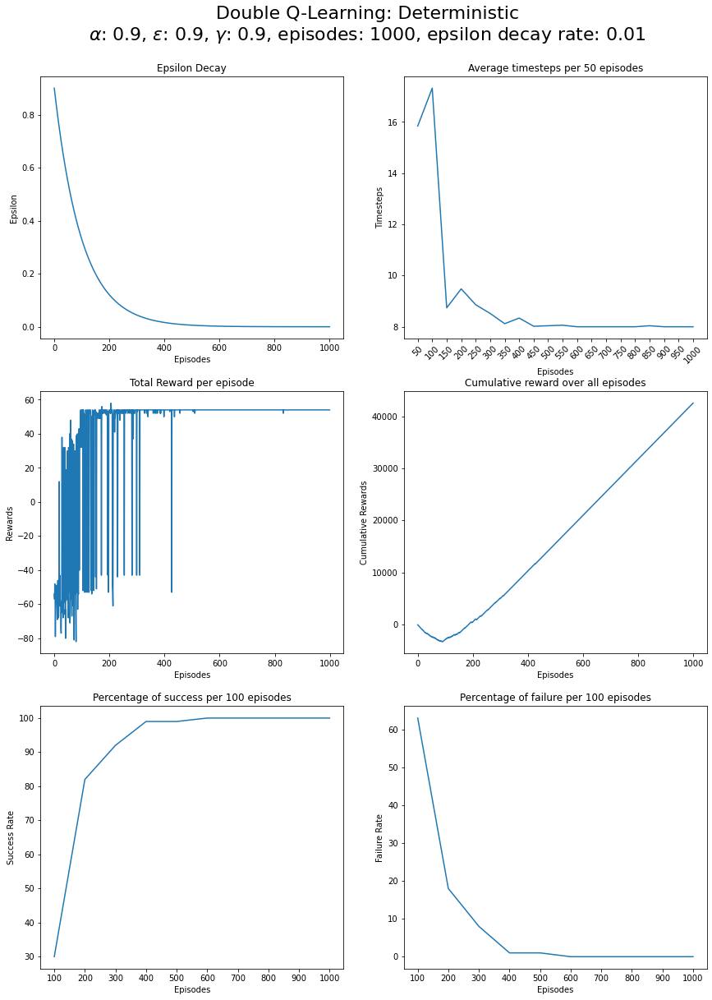

In [215]:
# Plot the graphs
title = 'Double Q-Learning: Deterministic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_ddqd, epsilon_decay_ddqd, cumulative_reward_ddqd, percentage_success_ddqd, percentage_failure_ddqd, avg_timestep_ddqd, episodes)

In [216]:
def double_q_test_agent(env, episodes, epsilon=0, perform_render=False):
    '''
    Test the agent following the double Q-learning algorithm
    '''
    total_reward_arr = list()
    
    for episode in range(episodes):
        obs = env.reset()
        current_pos = env.agent_pos.copy()
        done = False
        total_reward = 0
        while not done:
            q1_q2 = np.add(Q1_table[tuple(current_pos)], Q2_table[tuple(current_pos)])
            action = np.argmax(q1_q2)
            
            observation, reward, done, info = env.step(action)

            next_state = info['current_agent_pos']
            total_reward += reward
            current_pos = next_state.copy()
            if perform_render and episodes-1 == episode:
                env.render()
        total_reward_arr.append(total_reward)
    return total_reward_arr

#### Test the agent

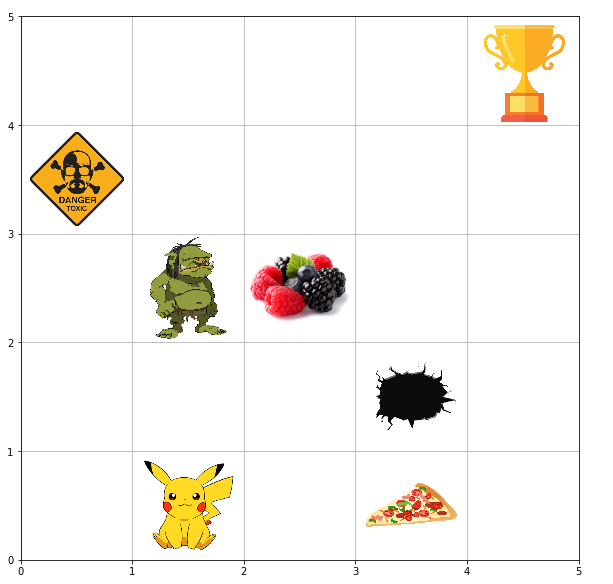

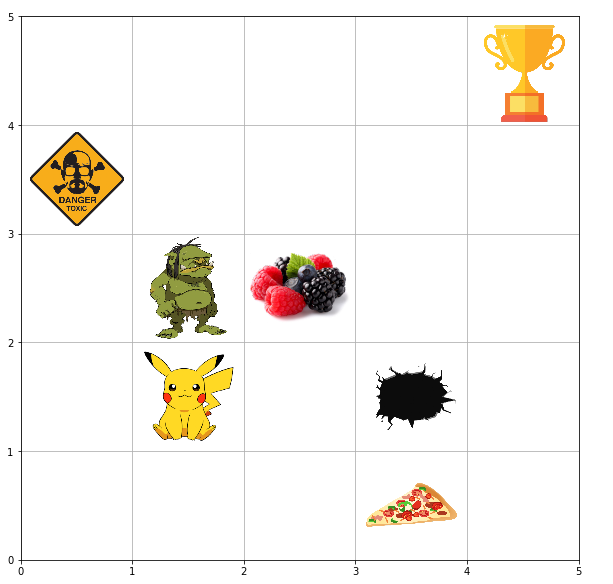

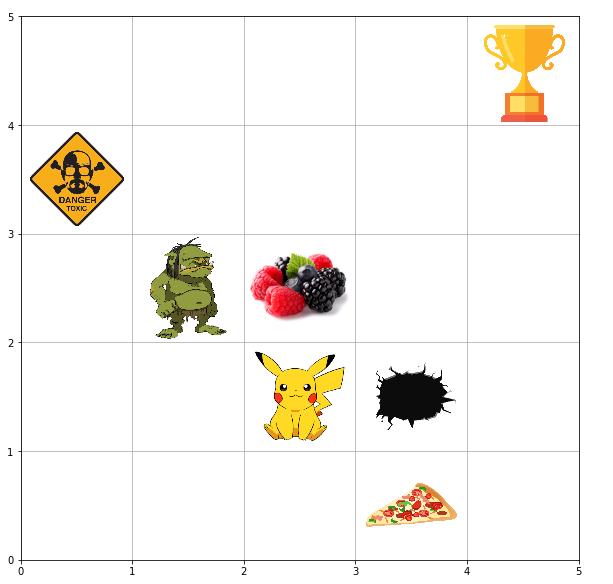

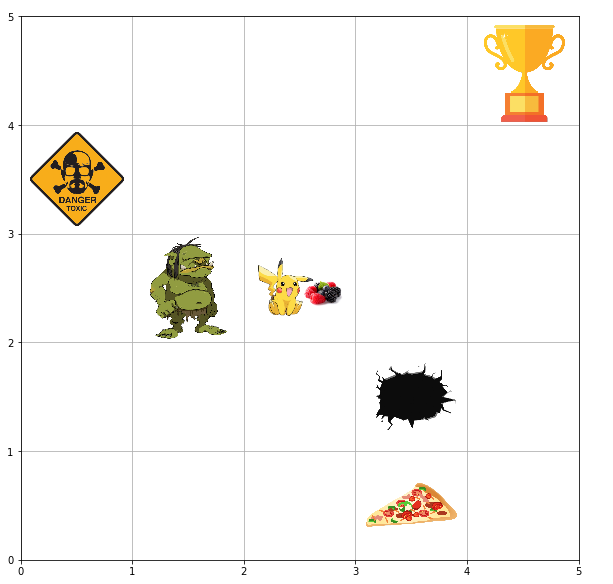

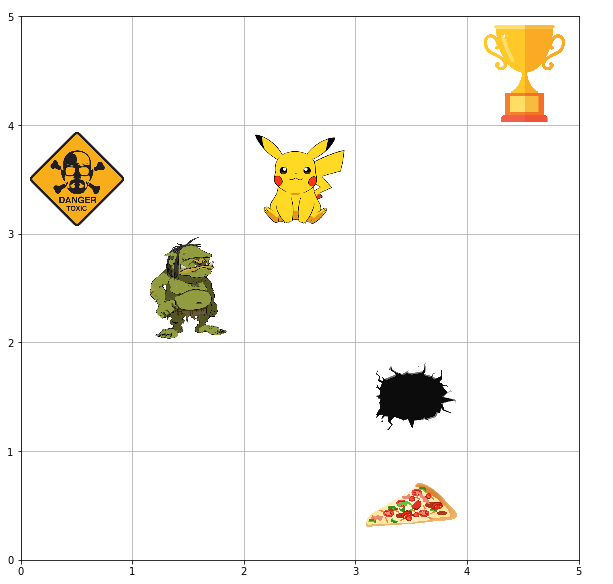

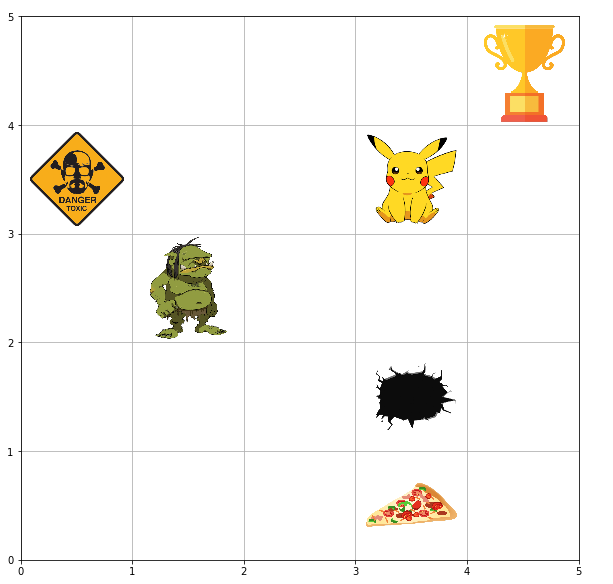

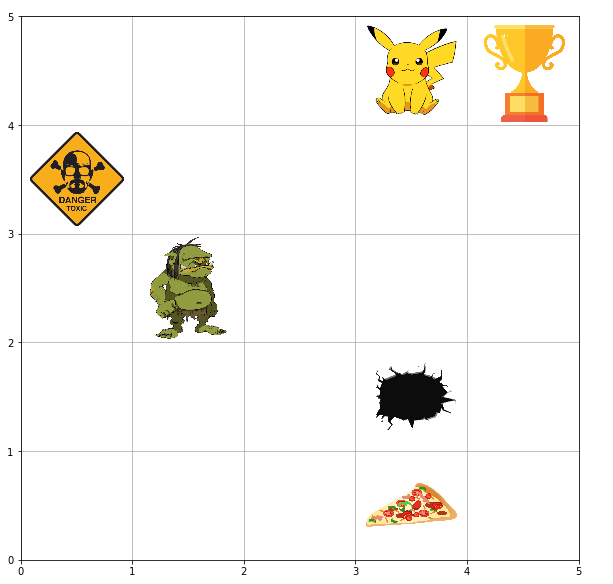

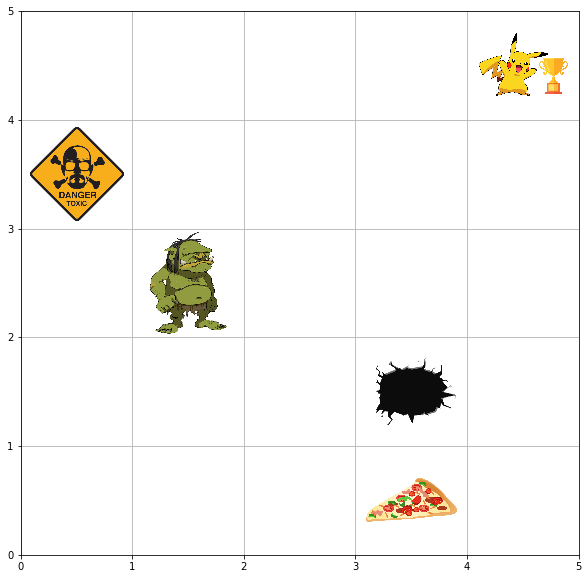

In [217]:
episodes = 10
test_total_reward_ddqd = double_q_test_agent(env, episodes, perform_render=True)

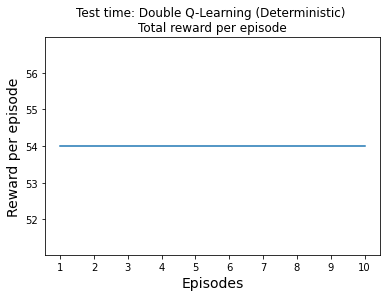

In [218]:
plt.plot(test_total_reward_ddqd)
plt.title('Test time: Double Q-Learning (Deterministic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

## Double Q-learning: Stochastic

In [371]:
# Initialize different paramters for Q-learning
alpha_lr = 0.6
epsilon = 0.9
gamma_df = 0.9
episodes = 1000
epsilon_decay_rate = 0.01

In [372]:
# Initialize Q-table to zero
Q1_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}
Q2_table = {(i,j): np.zeros(4) for i in range(5) for j in range(5)}

# Create deterministic environment object
env = GridEnvironment(is_stochastic=True)

In [373]:
# Train the agent following double q-learning algo
total_reward_ddqs, epsilon_decay_ddqs, cumulative_reward_ddqs, percentage_success_ddqs, percentage_failure_ddqs, avg_timestep_ddqs = double_qLearning(env, episodes, epsilon, alpha_lr, gamma_df, epsilon_decay_rate)

In [374]:
# Save Q-tables
dql_q_table['stochastic'] = {
        'Q1_table': Q1_table,
        'Q2_table': Q2_table
    }

In [375]:
dql_q_table

{'deterministic': {'Q1_table': {(0,
    0): array([ -7.51962568, -16.6711632 ,  20.24412136,  -5.74031794]),
   (0, 1): array([ 23.01407193, -25.63085913,   6.33626153,  -9.52052196]),
   (0, 2): array([-33.39361195,  -8.44430116, -50.        ,  -6.54078036]),
   (0, 3): array([-10.37580648,  -3.82490079,  26.05652922,  -6.23936053]),
   (0, 4): array([-6.15675038, -5.19725382, -4.29186824, -5.2514488 ]),
   (1, 0): array([  6.56712496,  30.79646   , -28.29148542,  18.70308508]),
   (1, 1): array([ 18.59756392, -50.        ,  27.33842144, -16.91355561]),
   (1, 2): array([0., 0., 0., 0.]),
   (1, 3): array([-49.999995  ,  -4.26102306,  33.73960602,  -4.27425913]),
   (1, 4): array([-3.14018309, -2.45004849, 31.07583132, -5.25788651]),
   (2, 0): array([ 27.9283945 ,  27.33842144, -21.73282111,  18.89685863]),
   (2, 1): array([-24.15662373,  40.366     , -50.        ,  23.39368214]),
   (2, 2): array([ 23.87459437,  33.74      ,  33.73914928, -50.        ]),
   (2, 3): array([26.162859

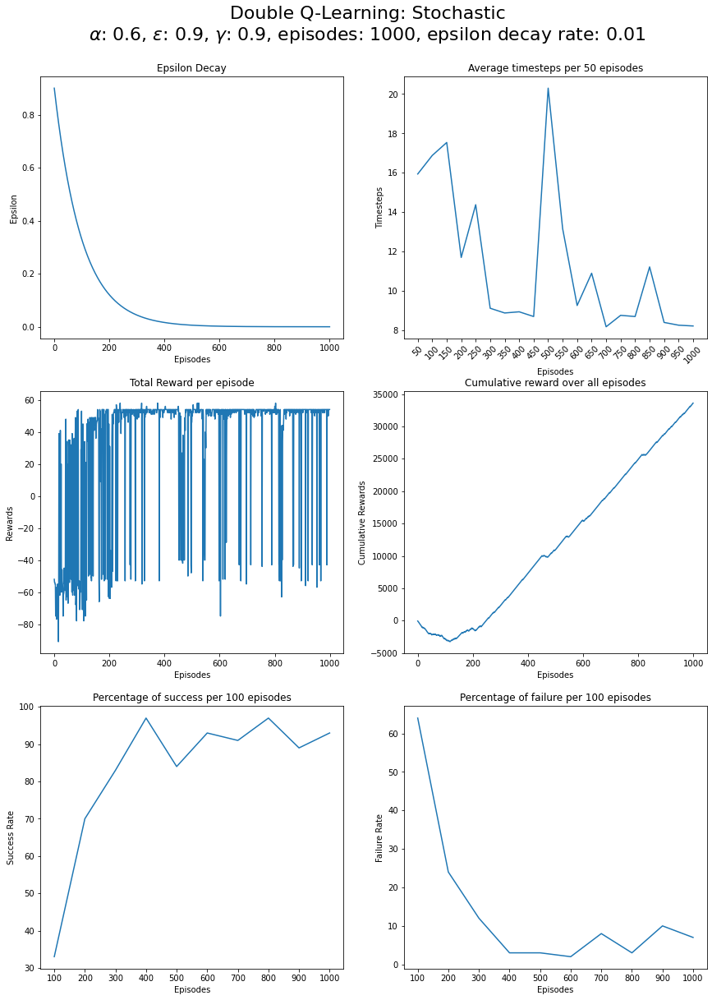

In [376]:
# Plot the graphs
title = 'Double Q-Learning: Stochastic\n' + r'$\alpha$: {}, $\epsilon$: {}, $\gamma$: {}, episodes: {}, epsilon decay rate: {}'.format(alpha_lr, epsilon, gamma_df, episodes, epsilon_decay_rate)

plot_graphs(title, total_reward_ddqs, epsilon_decay_ddqs, cumulative_reward_ddqs, percentage_success_ddqs, percentage_failure_ddqs, avg_timestep_ddqs, episodes)

#### Test the agent

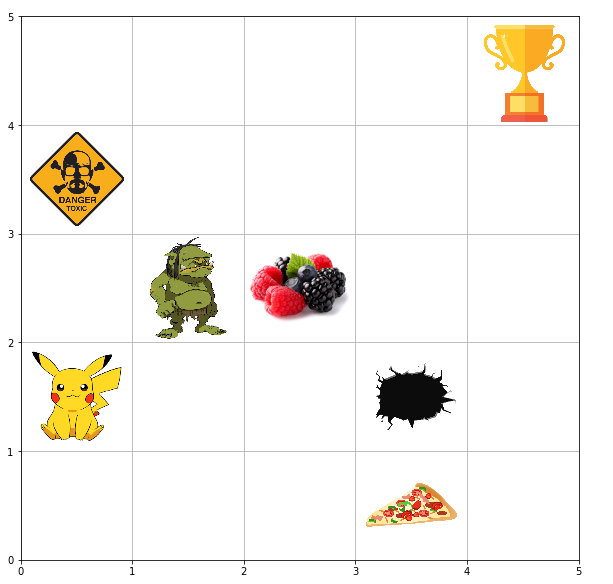

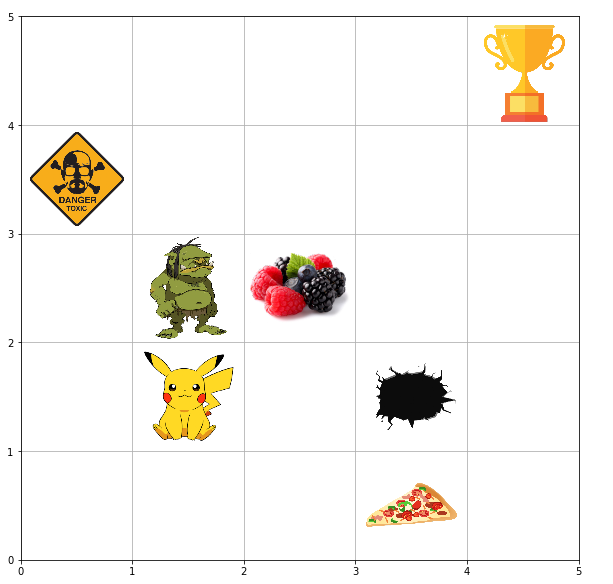

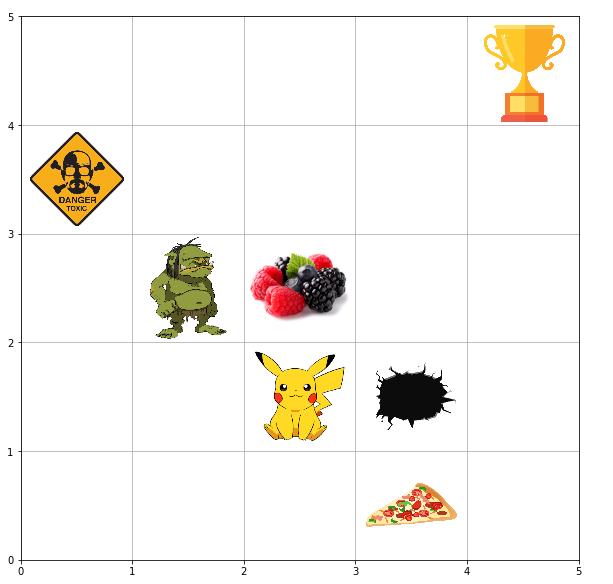

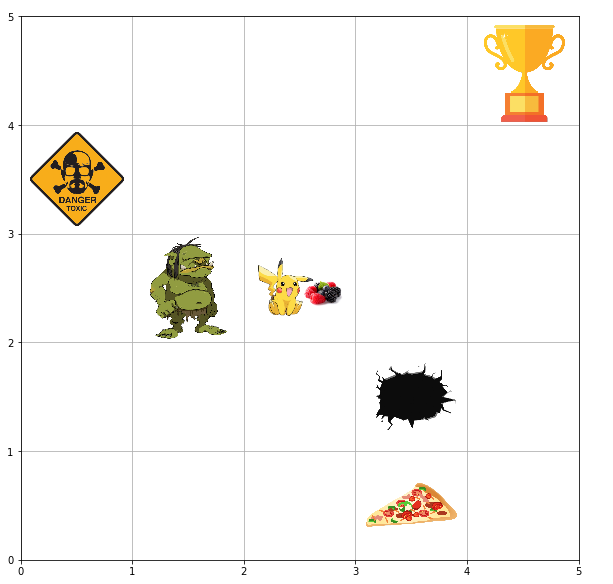

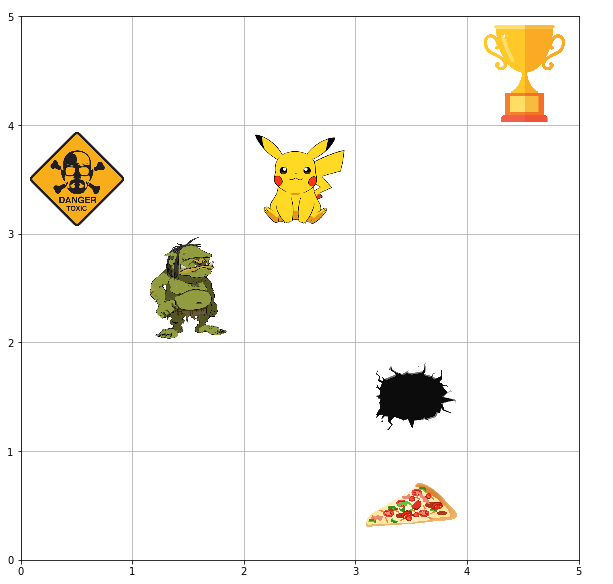

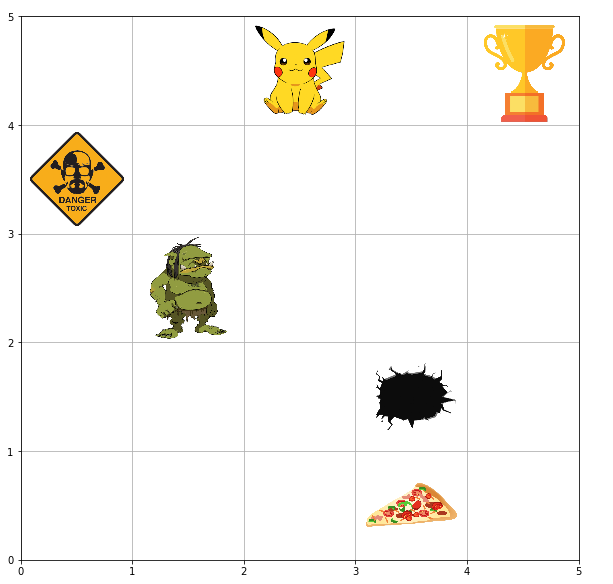

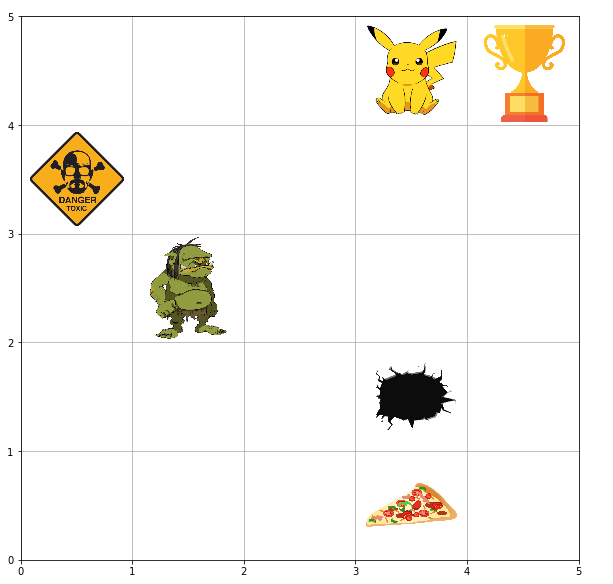

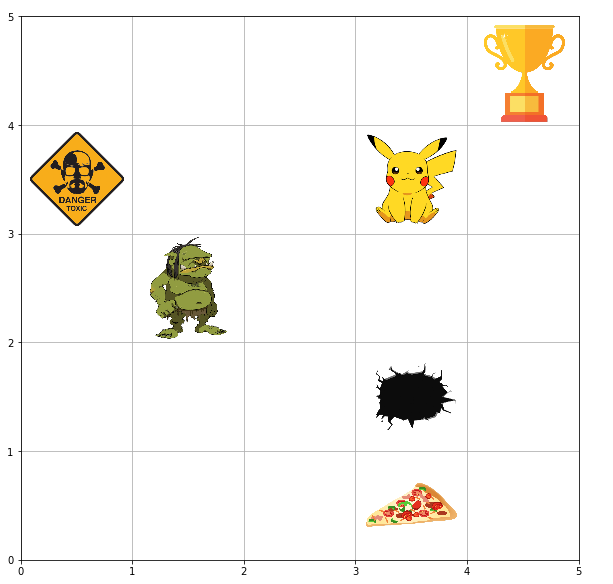

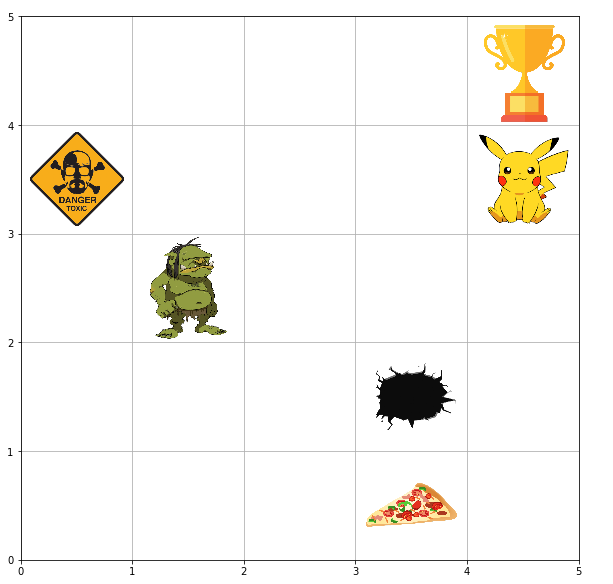

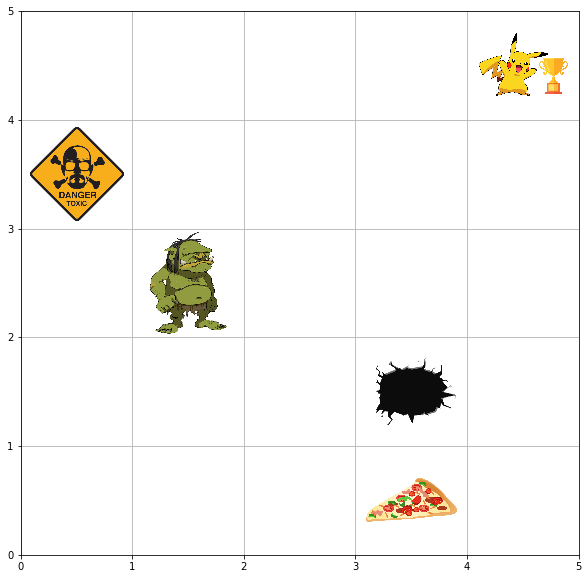

In [377]:
episodes = 10
test_total_reward_ddqs = double_q_test_agent(env, episodes, perform_render=True)

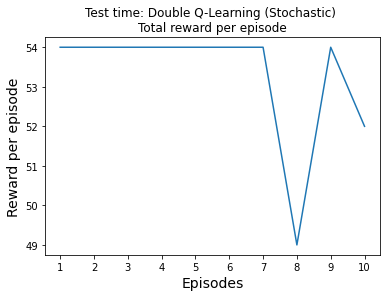

In [378]:
plt.plot(test_total_reward_ddqs)
plt.title('Test time: Double Q-Learning (Stochastic) \nTotal reward per episode')
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Reward per episode', fontsize=14)
plt.xticks(np.arange(10), np.arange(1,11))
plt.show()

## Comparing the results for Q-learning and Double Q-learning (Deterministic Env)

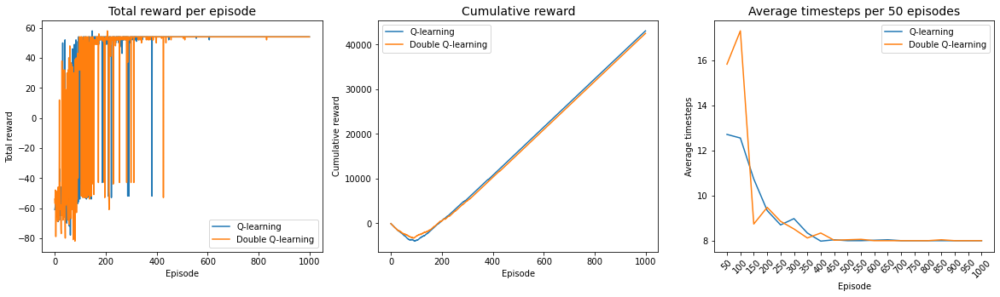

In [388]:
fig, axs = plt.subplots(1,3, figsize=(20,5))

axs[0].plot(total_reward_qd, label='Q-learning')
axs[0].plot(total_reward_ddqd, label='Double Q-learning')
axs[0].set_xlabel('Episode')
axs[0].set_ylabel('Total reward')
axs[0].set_title('Total reward per episode', fontsize=14)
axs[0].legend()

axs[1].plot(cumulative_reward_qd, label='Q-learning')
axs[1].plot(cumulative_reward_ddqd, label='Double Q-learning')
axs[1].set_xlabel('Episode')
axs[1].set_ylabel('Cumulative reward')
axs[1].set_title('Cumulative reward', fontsize=14)
axs[1].legend()

axs[2].plot(avg_timestep_qd, label='Q-learning')
axs[2].plot(avg_timestep_ddqd, label='Double Q-learning')
axs[2].set_xlabel('Episode')
axs[2].set_ylabel('Average timesteps')
axs[2].set_title('Average timesteps per 50 episodes', fontsize=14)
axs[2].set_xticks(np.arange(len(avg_timestep_qd)))
axs[2].set_xticklabels(list(range(0,1001,50))[1:], rotation=45)
axs[2].legend()

plt.show()

## Comparing the results for Q-learning and Double Q-learning (Stochastic Env)

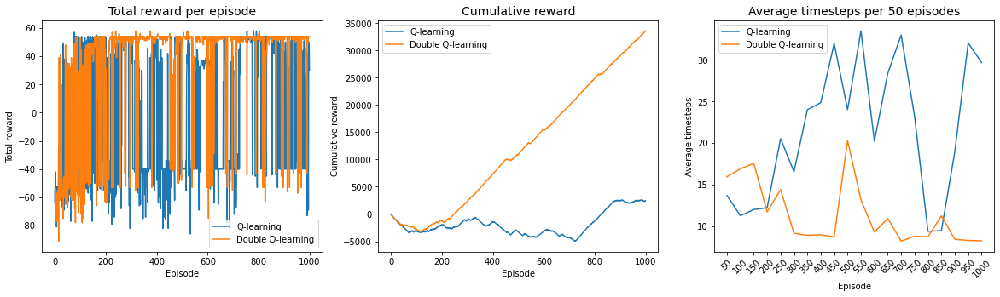

In [389]:
fig, axs = plt.subplots(1,3, figsize=(20,5))

axs[0].plot(total_reward_qs2, label='Q-learning')
axs[0].plot(total_reward_ddqs, label='Double Q-learning')
axs[0].set_xlabel('Episode')
axs[0].set_ylabel('Total reward')
axs[0].set_title('Total reward per episode', fontsize=14)
axs[0].legend()

axs[1].plot(cumulative_reward_qs2, label='Q-learning')
axs[1].plot(cumulative_reward_ddqs, label='Double Q-learning')
axs[1].set_xlabel('Episode')
axs[1].set_ylabel('Cumulative reward')
axs[1].set_title('Cumulative reward', fontsize=14)
axs[1].legend()

axs[2].plot(avg_timestep_qs2, label='Q-learning')
axs[2].plot(avg_timestep_ddqs, label='Double Q-learning')
axs[2].set_xlabel('Episode')
axs[2].set_ylabel('Average timesteps')
axs[2].set_title('Average timesteps per 50 episodes', fontsize=14)
axs[2].set_xticks(np.arange(len(avg_timestep_qd)))
axs[2].set_xticklabels(list(range(0,1001,50))[1:], rotation=45)
axs[2].legend()

plt.show()

## The End